In [1]:
! pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488491 sha256=b6c16149cba924d730ca86bc8fb09252b0f72c539cd417e08222852970321a59
  Stored in directory: /root/.cache/pip/wheels/80/1d/60/2c256ed38dddce2fdd93be545214a63e02fbd8d74fb0b7f3a6
Successfully built pyspark


In [2]:
import pyspark
from pyspark import SparkContext, SparkConf
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.evaluation import RegressionEvaluator
import numpy as np

https://www.kaggle.com/datasets/tanay001/nseindia-futures-options-daily/data

In [3]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d tanay001/nseindia-futures-options-daily
! unzip nseindia-futures-options-daily.zip

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 403, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.
unzip:  cannot find or open nseindia-futures-options-daily.zip, nseindia-futures-options-daily.zip.zip or nseindia-futures-options-daily.zip.ZIP.


In [4]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col

spark = SparkSession.builder.config('spark.driver.memory', '10g').appName('Future and Option Data Analysis').getOrCreate()


In [ ]:

# Load your dataset
data = spark.read.csv("fobhav.csv", header=True, inferSchema=True)


ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/usr/local/lib/python3.10/dist-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/usr/lib/python3.10/socket.py", line 705, in readinto
    return self._sock.recv_into(b)
KeyboardInterrupt


KeyboardInterrupt: 

In [ ]:
data.printSchema()

root
 |-- INSTRUMENT: string (nullable = true)
 |-- SYMBOL: string (nullable = true)
 |-- EXPIRY_DT: string (nullable = true)
 |-- STRIKE_PR: string (nullable = true)
 |-- OPTION_TYP: string (nullable = true)
 |-- OPEN: string (nullable = true)
 |-- HIGH: string (nullable = true)
 |-- LOW: string (nullable = true)
 |-- CLOSE: string (nullable = true)
 |-- SETTLE_PR: string (nullable = true)
 |-- CONTRACTS: string (nullable = true)
 |-- VAL_INLAKH: string (nullable = true)
 |-- OPEN_INT: string (nullable = true)
 |-- CHG_IN_OI: string (nullable = true)
 |-- TIMESTAMP: string (nullable = true)
 |-- Unnamed: 15: string (nullable = true)



In [ ]:
headers = ['INSTRUMENT','SYMBOL','EXPIRY_DT','STRIKE_PR','OPTION_TYP','OPEN','HIGH','LOW','CLOSE','SETTLE_PR','CONTRACTS','VAL_INLAKH','OPEN_INT','CHG_IN_OI','TIMESTAMP','Unnamed']

In [ ]:
import numpy as np
all_options = np.array(data.filter(data['INSTRUMENT'] == 'OPTSTK').select('SYMBOL').distinct().collect()).tolist()
#print all the different stock names
all_option_1d_array = np.reshape(all_options,(1,-1))
all_option_1d_array = all_option_1d_array[0]
print(all_option_1d_array)

['GODREJCP' 'LT' 'ICICIBANK' 'L&TFH' 'IDEA' 'TITAN' 'MINDTREE'
 'TORNTPOWER' 'SRTRANSFIN' 'IBULHSGFIN' 'BOSCHLTD' 'MANAPPURAM' 'PETRONET'
 'PFC' 'DIVISLAB' 'SAIL' 'EXIDEIND' 'HDFCBANK' 'EQUITAS' 'CIPLA'
 'AUROPHARMA' 'MFSL' 'CENTURYTEX' 'BHARATFORG' 'MRF' 'HINDALCO' 'SBILIFE'
 'ZEEL' 'ACC' 'BAJAJ-AUTO' 'BALKRISIND' 'INFY' 'BATAINDIA' 'M&M' 'IGL'
 'POWERGRID' 'ONGC' 'PNB' 'ASHOKLEY' 'NATIONALUM' 'ADANIPORTS'
 'APOLLOHOSP' 'HDFC' 'M&MFIN' 'AMBUJACEM' 'CUMMINSIND' 'UBL' 'RAMCOCEM'
 'BAJFINANCE' 'SIEMENS' 'VOLTAS' 'SRF' 'HAVELLS' 'BPCL' 'TATACONSUM'
 'EICHERMOT' 'HINDPETRO' 'HINDUNILVR' 'ASIANPAINT' 'MOTHERSUMI'
 'MUTHOOTFIN' 'NAUKRI' 'BHEL' 'NCC' 'NTPC' 'RELIANCE' 'NMDC' 'TATAPOWER'
 'COFORGE' 'TVSMOTOR' 'DABUR' 'DLF' 'MARUTI' 'UPL' 'LICHSGFIN' 'NESTLEIND'
 'TECHM' 'CONCOR' 'UJJIVAN' 'INDIGO' 'MCDOWELL-N' 'SUNPHARMA' 'COLPAL'
 'MARICO' 'PVR' 'BHARTIARTL' 'PAGEIND' 'COALINDIA' 'ADANIENT' 'TORNTPHARM'
 'RECLTD' 'TCS' 'CHOLAFIN' 'RBLBANK' 'INDUSINDBK' 'BANDHANBNK'
 'FEDERALBNK' 'HDFCLIFE' 'G

In [ ]:
industry_leader_in_each_sector = ['NAUKRI', 'JUBLFOOD', 'PIIND', 'HDFC', 'HDFCBANK','ADANIGREEN','ADANITRANS','BHARTIARTL','CIPLA',
                                  'HEROMOTOCO','HINDUNILVR', 'INF','TCS', 'INIGO', 'M&M', 'JUBLFOOD', 'LT', 'NUKRI', 'NESTIND',
                                  'PIIND', 'PIDILITIND', 'SIEMENS', 'TATASTEEL', 'TITAN', 'ULTERACEMCO', 'SUNPHARMA','DLF','JSWSTEEL'
                                  'SIEMENS', 'ULTRACEMCO', 'BHARATIARTL', 'ADANITRANS']

In [ ]:
option_data_LT = data.filter( \
                        (data['SYMBOL'] == 'LT') & \
                        (data['INSTRUMENT'] == 'OPTSTK') &
                        ~(col("OPEN") == 0) &  ~(col("HIGH") == 0) & \
                        ~(col("LOW") == 0) & \
                        ~(col("CLOSE") == 0) & \
                        ~(col("SETTLE_PR") == 0) & \
                        ~(col("CONTRACTS") == 0) & \
                        ~(col("VAL_INLAKH") == 0) & \
                        ~(col("OPEN_INT") == 0) & \
                        ~(col("CHG_IN_OI") == 0)
                        ).collect()


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
len(option_data_LT)

633054

In [ ]:
type(option_data_LT)

list

In [ ]:
import csv
header = ['INSTRUMENT','SYMBOL','EXPIRY_DT','STRIKE_PR','OPTION_TYP','OPEN','HIGH','LOW','CLOSE','SETTLE_PR','CONTRACTS','VAL_INLAKH','OPEN_INT','CHG_IN_OI','TIMESTAMP','Unnamed']
with open('lt_option.csv','w') as f:
    writer = csv.writer(f)
    writer.writerow(header)
    writer.writerows(option_data_LT)


In [ ]:
option_data_LT.count()

643420

In [ ]:
for name in all_option_1d_array

94010

  INSTRUMENT SYMBOL  EXPIRY_DT  STRIKE_PR OPTION_TYP  OPEN  HIGH  LOW   CLOSE  \
0     OPTSTK     LT 2020-09-24      680.0         CE   0.0   0.0  0.0  278.10   
1     OPTSTK     LT 2020-09-24      700.0         CE   0.0   0.0  0.0  260.55   
2     OPTSTK     LT 2020-09-24      720.0         CE   0.0   0.0  0.0  243.45   
3     OPTSTK     LT 2020-09-24      740.0         CE   0.0   0.0  0.0  230.00   
4     OPTSTK     LT 2020-09-24      760.0         CE   0.0   0.0  0.0  210.90   

   SETTLE_PR  CONTRACTS  VAL_INLAKH  OPEN_INT  CHG_IN_OI    TIMESTAMP  Unnamed  
0     266.85        0.0         0.0       0.0        0.0  31-AUG-2020      NaN  
1     246.90        0.0         0.0       0.0        0.0  31-AUG-2020      NaN  
2     227.00        0.0         0.0       0.0        0.0  31-AUG-2020      NaN  
3     207.10        0.0         0.0    3300.0        0.0  31-AUG-2020      NaN  
4     187.35        0.0         0.0       0.0        0.0  31-AUG-2020      NaN  
                           

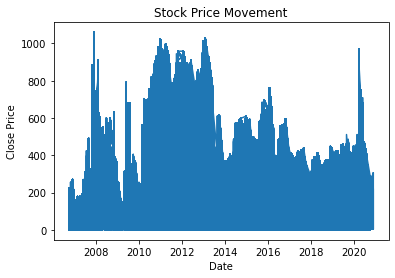

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read the data
data = pd.read_csv('lt_option.csv')

# Convert 'EXPIRY_DT' to datetime with mixed format
data['EXPIRY_DT'] = pd.to_datetime(data['EXPIRY_DT'], format='mixed', dayfirst=True)

# Perform basic EDA
print(data.head())
print(data.describe())

# Plot stock price movements over time
plt.plot(data['EXPIRY_DT'].values, data['CLOSE'].values)
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Stock Price Movement')
plt.show()


# Cleaning the dataset of any values wich are 0

In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col

# Assuming 'df' is your DataFrame containing the data
# Read the data from CSV
df = spark.read.csv("lt_option.csv", header=True, inferSchema=True)

# Drop rows with any column value equal to 0
df_filtered = df.filter(~(col("OPEN") == 0) &
                        ~(col("HIGH") == 0) &
                        ~(col("LOW") == 0) &
                        ~(col("CLOSE") == 0) &
                        ~(col("SETTLE_PR") == 0) &
                        ~(col("CONTRACTS") == 0) &
                        ~(col("VAL_INLAKH") == 0) &
                        ~(col("OPEN_INT") == 0) &
                        ~(col("CHG_IN_OI") == 0))

# Show the resulting DataFrame
df_filtered.show(vertical=True)


+----------+------+-----------+---------+----------+-----+-----+-----+-----+---------+---------+----------+---------+---------+-----------+-------+
|INSTRUMENT|SYMBOL|  EXPIRY_DT|STRIKE_PR|OPTION_TYP| OPEN| HIGH|  LOW|CLOSE|SETTLE_PR|CONTRACTS|VAL_INLAKH| OPEN_INT|CHG_IN_OI|  TIMESTAMP|Unnamed|
+----------+------+-----------+---------+----------+-----+-----+-----+-----+---------+---------+----------+---------+---------+-----------+-------+
|    OPTSTK|    LT|24-Sep-2020|    840.0|        CE|148.7|148.7|148.7|148.7|   111.25|      1.0|      5.43|    550.0|    550.0|31-AUG-2020|   NULL|
|    OPTSTK|    LT|24-Sep-2020|    860.0|        CE|134.0|134.0|120.0|120.0|     94.0|      5.0|     27.04|   2750.0|   2750.0|31-AUG-2020|   NULL|
|    OPTSTK|    LT|24-Sep-2020|    880.0|        CE| 84.0| 84.0| 83.8| 83.8|    77.95|      2.0|      10.6|   1100.0|   1100.0|31-AUG-2020|   NULL|
|    OPTSTK|    LT|24-Sep-2020|    900.0|        CE|100.1|102.5| 65.0|68.05|    68.05|    154.0|    830.18| 1523

In [ ]:
df_filtered.show(vertical=True)


-RECORD 0-----------------
 INSTRUMENT | OPTSTK      
 SYMBOL     | LT          
 EXPIRY_DT  | 24-Sep-2020 
 STRIKE_PR  | 840.0       
 OPTION_TYP | CE          
 OPEN       | 148.7       
 HIGH       | 148.7       
 LOW        | 148.7       
 CLOSE      | 148.7       
 SETTLE_PR  | 111.25      
 CONTRACTS  | 1.0         
 VAL_INLAKH | 5.43        
 OPEN_INT   | 550.0       
 CHG_IN_OI  | 550.0       
 TIMESTAMP  | 31-AUG-2020 
 Unnamed    | NULL        
-RECORD 1-----------------
 INSTRUMENT | OPTSTK      
 SYMBOL     | LT          
 EXPIRY_DT  | 24-Sep-2020 
 STRIKE_PR  | 860.0       
 OPTION_TYP | CE          
 OPEN       | 134.0       
 HIGH       | 134.0       
 LOW        | 120.0       
 CLOSE      | 120.0       
 SETTLE_PR  | 94.0        
 CONTRACTS  | 5.0         
 VAL_INLAKH | 27.04       
 OPEN_INT   | 2750.0      
 CHG_IN_OI  | 2750.0      
 TIMESTAMP  | 31-AUG-2020 
 Unnamed    | NULL        
-RECORD 2-----------------
 INSTRUMENT | OPTSTK      
 SYMBOL     | LT          
 

In [ ]:
print(result_df)


Empty DataFrame
Columns: [EXPIRY_DT, CLOSE]
Index: []


In [ ]:
# Specify the path where you want to save the CSV file
output_path = "filtered_lt_option.csv"

# Repartition the DataFrame into a single partition
df_filtered_single_partition = df_filtered.coalesce(1)

# Save the filtered DataFrame as a CSV file
df_filtered_single_partition.write.csv(output_path, header=True, mode="overwrite")

# Print a message to confirm the CSV file has been saved
print(f"Filtered data has been saved to {output_path}")


Filtered data has been saved to filtered_lt_option.csv


In [ ]:
from pyspark.sql.functions import col

# Assuming futures_data is your DataFrame
futures_data = futures_data.withColumn("SETTLE_PR", col("SETTLE_PR").cast("double"))


In [ ]:
futures_data.printSchema()

root
 |-- INSTRUMENT: string (nullable = true)
 |-- SYMBOL: string (nullable = true)
 |-- EXPIRY_DT: string (nullable = true)
 |-- STRIKE_PR: string (nullable = true)
 |-- OPTION_TYP: string (nullable = true)
 |-- OPEN: string (nullable = true)
 |-- HIGH: string (nullable = true)
 |-- LOW: string (nullable = true)
 |-- CLOSE: string (nullable = true)
 |-- SETTLE_PR: double (nullable = true)
 |-- CONTRACTS: string (nullable = true)
 |-- VAL_INLAKH: string (nullable = true)
 |-- OPEN_INT: string (nullable = true)
 |-- CHG_IN_OI: string (nullable = true)
 |-- TIMESTAMP: string (nullable = true)
 |-- Unnamed: 15: string (nullable = true)



##### Now clean the FUTIDX data frame where the option type is xx

In [ ]:
futures_data.show(vertical=True)

-RECORD 0------------------
 INSTRUMENT  | FUTIDX      
 SYMBOL      | BANKNIFTY   
 EXPIRY_DT   | 24-Sep-2020 
 STRIKE_PR   | 0.0         
 OPTION_TYP  | XX          
 OPEN        | 24900.05    
 HIGH        | 25270.0     
 LOW         | 23371.0     
 CLOSE       | 23743.0     
 SETTLE_PR   | 23743.0     
 CONTRACTS   | 504222      
 VAL_INLAKH  | 3051593.27  
 OPEN_INT    | 1432850     
 CHG_IN_OI   | -54500      
 TIMESTAMP   | 31-AUG-2020 
 Unnamed: 15 | null        
-RECORD 1------------------
 INSTRUMENT  | FUTIDX      
 SYMBOL      | BANKNIFTY   
 EXPIRY_DT   | 29-Oct-2020 
 STRIKE_PR   | 0.0         
 OPTION_TYP  | XX          
 OPEN        | 24937.55    
 HIGH        | 25315.9     
 LOW         | 23391.9     
 CLOSE       | 23770.1     
 SETTLE_PR   | 23770.1     
 CONTRACTS   | 10630       
 VAL_INLAKH  | 64526.57    
 OPEN_INT    | 91375       
 CHG_IN_OI   | 19325       
 TIMESTAMP   | 31-AUG-2020 
 Unnamed: 15 | null        
-RECORD 2------------------
 INSTRUMENT  | FUTID

In [ ]:
futures_data.show()

+----------+---------+-----------+---------+----------+--------+--------+--------+--------+---------+---------+----------+--------+---------+-----------+-----------+
|INSTRUMENT|   SYMBOL|  EXPIRY_DT|STRIKE_PR|OPTION_TYP|    OPEN|    HIGH|     LOW|   CLOSE|SETTLE_PR|CONTRACTS|VAL_INLAKH|OPEN_INT|CHG_IN_OI|  TIMESTAMP|Unnamed: 15|
+----------+---------+-----------+---------+----------+--------+--------+--------+--------+---------+---------+----------+--------+---------+-----------+-----------+
|    FUTIDX|BANKNIFTY|24-Sep-2020|      0.0|        XX|24900.05| 25270.0| 23371.0| 23743.0|  23743.0|   504222|3051593.27| 1432850|   -54500|31-AUG-2020|       null|
|    FUTIDX|BANKNIFTY|29-Oct-2020|      0.0|        XX|24937.55| 25315.9| 23391.9| 23770.1|  23770.1|    10630|  64526.57|   91375|    19325|31-AUG-2020|       null|
|    FUTIDX|BANKNIFTY|26-Nov-2020|      0.0|        XX|24989.95|25280.75|23437.15| 23766.2|  23766.2|     1171|   7088.68|   14400|     8400|31-AUG-2020|       null|
|   

## Extract all the individual stock

In [ ]:
print(data)

       INSTRUMENT SYMBOL  EXPIRY_DT  STRIKE_PR OPTION_TYP  OPEN  HIGH  LOW  \
0          OPTSTK     LT 2020-09-24      680.0         CE   0.0   0.0  0.0   
1          OPTSTK     LT 2020-09-24      700.0         CE   0.0   0.0  0.0   
2          OPTSTK     LT 2020-09-24      720.0         CE   0.0   0.0  0.0   
3          OPTSTK     LT 2020-09-24      740.0         CE   0.0   0.0  0.0   
4          OPTSTK     LT 2020-09-24      760.0         CE   0.0   0.0  0.0   
...           ...    ...        ...        ...        ...   ...   ...  ...   
633049     OPTSTK     LT 2006-11-30     2500.0         PA   0.0   0.0  0.0   
633050     OPTSTK     LT 2006-11-30     2550.0         PA   0.0   0.0  0.0   
633051     OPTSTK     LT 2006-11-30     2600.0         PA   0.0   0.0  0.0   
633052     OPTSTK     LT 2006-11-30     2650.0         PA   0.0   0.0  0.0   
633053     OPTSTK     LT 2006-11-30     2700.0         PA   0.0   0.0  0.0   

         CLOSE  SETTLE_PR  CONTRACTS  VAL_INLAKH  OPEN_INT  CHG

In [ ]:
import csv
for name in industry_leader_in_each_sector:
  option_data_LT = data.filter( \
                        (data['SYMBOL'] == name) & \
                        (data['INSTRUMENT'] == 'OPTSTK') &
                        ~(col("OPEN") == 0) &  ~(col("HIGH") == 0) & \
                        ~(col("LOW") == 0) & \
                        ~(col("CLOSE") == 0) & \
                        ~(col("SETTLE_PR") == 0) & \
                        ~(col("CONTRACTS") == 0) & \
                        ~(col("VAL_INLAKH") == 0) & \
                        ~(col("OPEN_INT") == 0) & \
                        ~(col("CHG_IN_OI") == 0)
                        ).collect()
  header = ['INSTRUMENT','SYMBOL','EXPIRY_DT','STRIKE_PR','OPTION_TYP','OPEN','HIGH','LOW','CLOSE','SETTLE_PR','CONTRACTS','VAL_INLAKH','OPEN_INT','CHG_IN_OI','TIMESTAMP','Unnamed']
  with open(f'options/{name}_option.csv','w') as f:
      writer = csv.writer(f)
      writer.writerow(header)
      writer.writerows(option_data_LT)



In [5]:
! pip install pandas matplotlib seaborn


In [6]:
import pandas as pd
import matplotlib.pyplot as plt


In [29]:
# Read CSV File
df = pd.read_csv('options/CIPLA_option.csv')

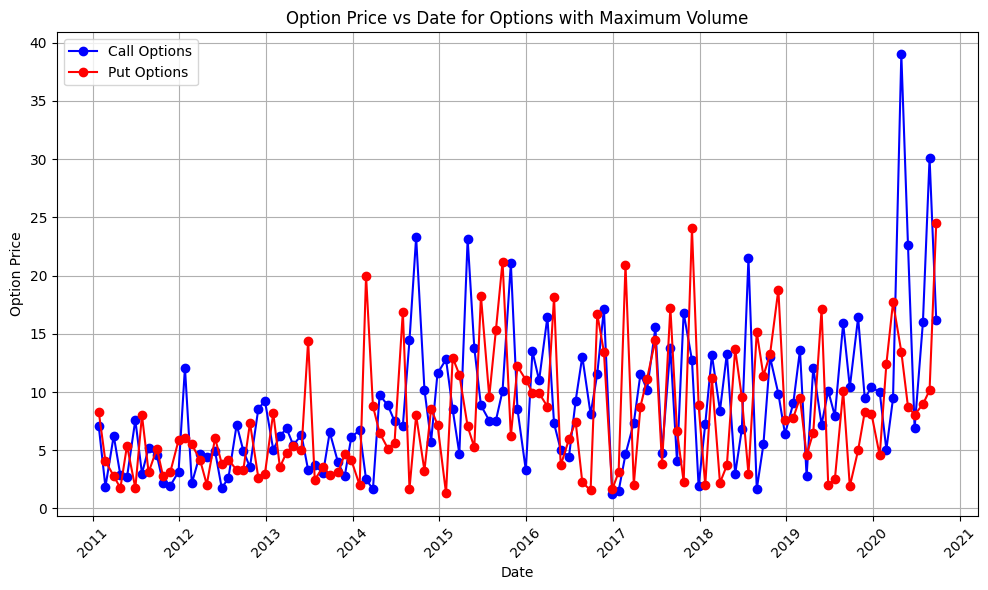

In [9]:


# Convert EXPIRY_DT column to datetime format
df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])

# Filter call and put options
call_options = df[df['OPTION_TYP'] == 'CE']
put_options = df[df['OPTION_TYP'] == 'PE']

# Group call options by date and find the row with maximum volume for each date
max_volume_call = call_options.loc[call_options.groupby('EXPIRY_DT')['CONTRACTS'].idxmax()]

# Group put options by date and find the row with maximum volume for each date
max_volume_put = put_options.loc[put_options.groupby('EXPIRY_DT')['CONTRACTS'].idxmax()]

# Plot
plt.figure(figsize=(10, 6))

# Plot call options
plt.plot(max_volume_call['EXPIRY_DT'], max_volume_call['CLOSE'], marker='o', linestyle='-', color='blue', label='Call Options')

# Plot put options
plt.plot(max_volume_put['EXPIRY_DT'], max_volume_put['CLOSE'], marker='o', linestyle='-', color='red', label='Put Options')

plt.xlabel('Date')
plt.ylabel('Option Price')
plt.title(f'Option Price vs Date for Options with Maximum Volume')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


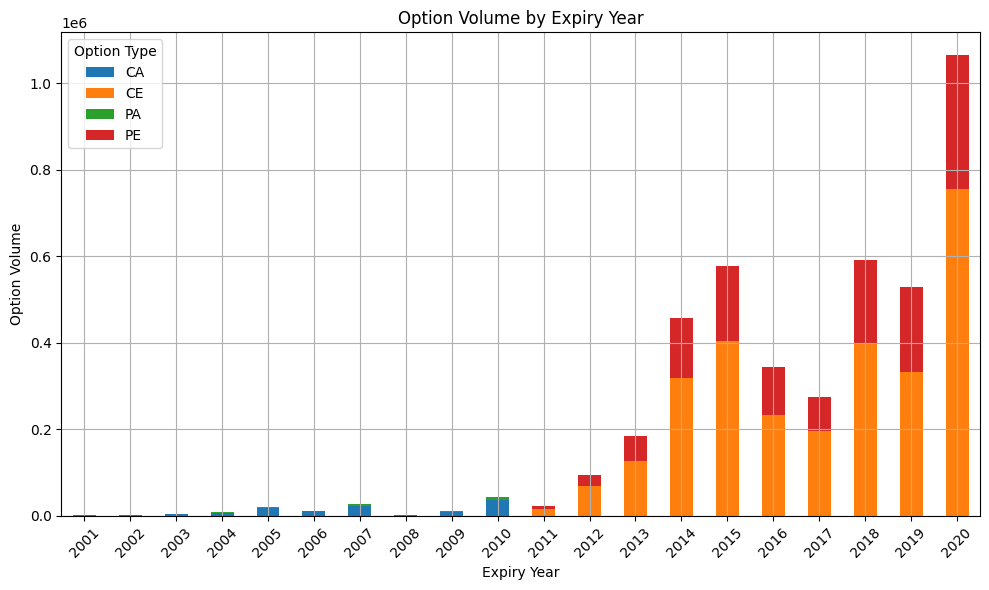

In [12]:
# Convert EXPIRY_DT column to datetime format
df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])

# Group the data by EXPIRY_DT and OPTION_TYP and calculate the total volume of call and put options
grouped_data = df.groupby([df['EXPIRY_DT'].dt.year, 'OPTION_TYP'])['CONTRACTS'].sum().unstack().fillna(0)

# Plot
grouped_data.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.xlabel('Expiry Year')
plt.ylabel('Option Volume')
plt.title('Option Volume by Expiry Year')
plt.xticks(rotation=45)
plt.legend(title='Option Type')
plt.grid(True)
plt.tight_layout()
plt.show()

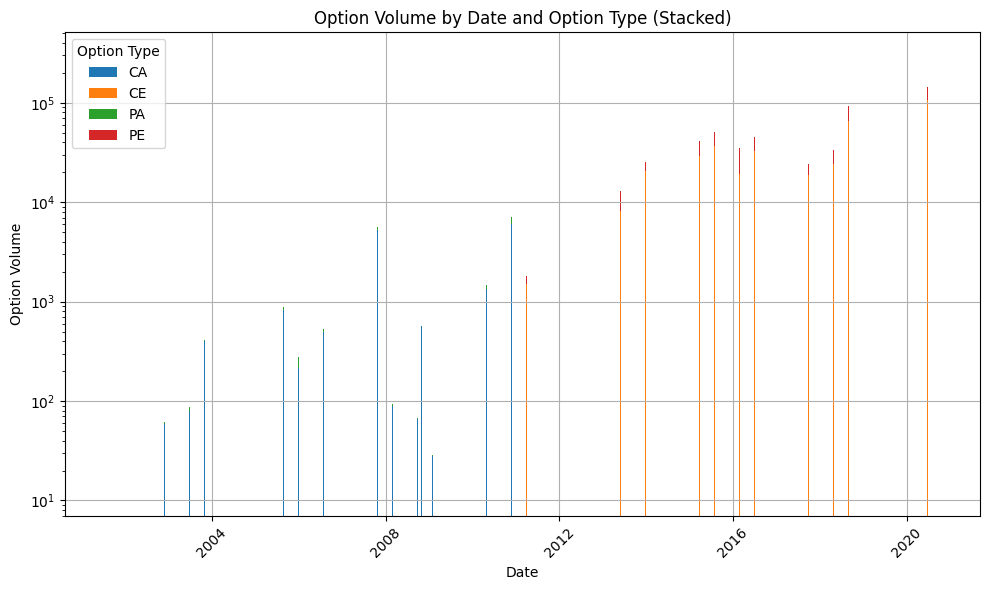

In [16]:
df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])

# Group the data by date and option type and calculate the total volume of options
grouped_data = df.groupby(['EXPIRY_DT', 'OPTION_TYP'])['CONTRACTS'].sum().unstack().fillna(0)

# Plot
plt.figure(figsize=(10, 6))
bottom = None
for option_type in grouped_data.columns:
    plt.bar(grouped_data.index, grouped_data[option_type], label=option_type, bottom=bottom)
    if bottom is None:
        bottom = grouped_data[option_type]
    else:
        bottom += grouped_data[option_type]

plt.xlabel('Date')
plt.ylabel('Option Volume')
plt.title('Option Volume by Date and Option Type (Stacked)')
plt.legend(title='Option Type')
plt.xticks(rotation=45)
plt.yscale('log')
plt.grid(True)
plt.tight_layout()
plt.show()

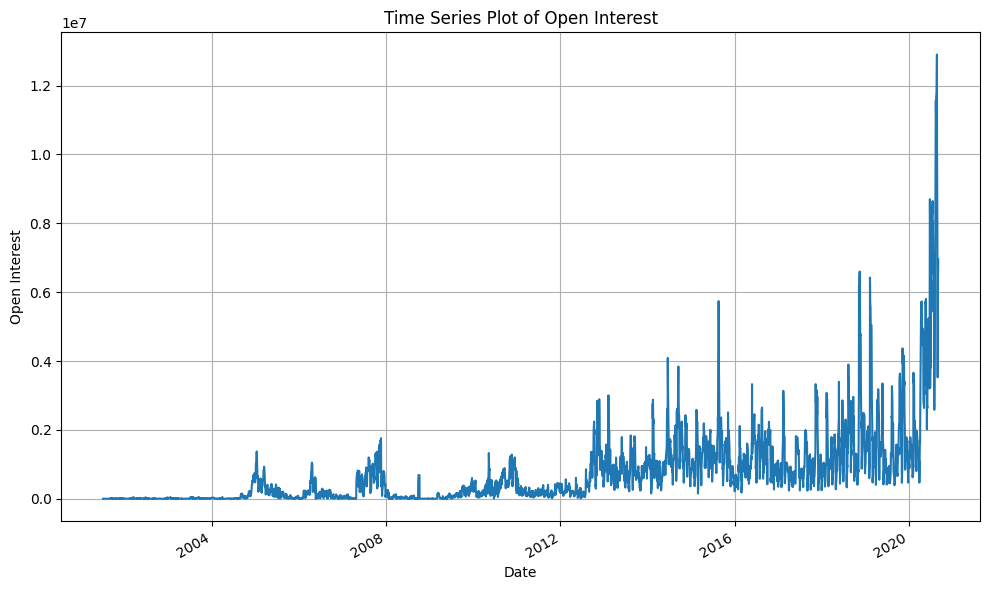

In [17]:
df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])

# Group the data by 'TIMESTAMP' and calculate the sum of 'OPEN_INT' for each timestamp
open_interest_series = df.groupby('TIMESTAMP')['OPEN_INT'].sum()

# Plot
plt.figure(figsize=(10, 6))
open_interest_series.plot()
plt.xlabel('Date')
plt.ylabel('Open Interest')
plt.title('Time Series Plot of Open Interest')
plt.grid(True)
plt.tight_layout()
plt.show()

In [19]:
import seaborn as sns


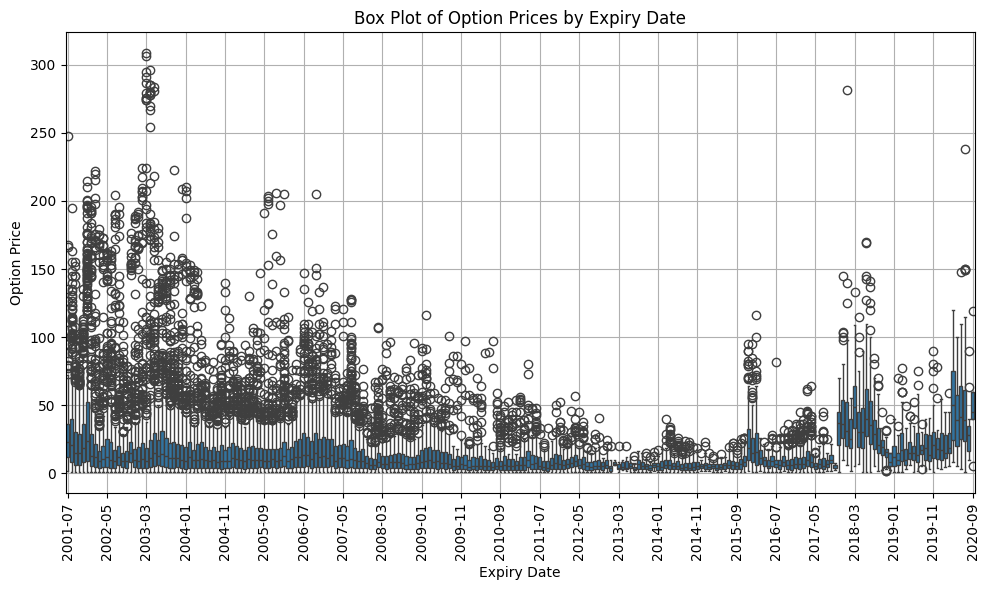

In [26]:
df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])

# Group the data by EXPIRY_DT and calculate the median option price for each expiry date
grouped_data = df.groupby('EXPIRY_DT')['CLOSE'].median().reset_index()

# Plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='EXPIRY_DT', y='CLOSE', data=df)
plt.xlabel('Expiry Date')
plt.ylabel('Option Price')
plt.title('Box Plot of Option Prices by Expiry Date')
plt.xticks(rotation=90)

# Customize x-axis ticks to display every n-th date
n = 10  # Display every 30th date
plt.xticks(range(0, len(grouped_data), n), grouped_data['EXPIRY_DT'].dt.strftime('%Y-%m').iloc[::n])

plt.grid(True)
plt.tight_layout()
plt.show()

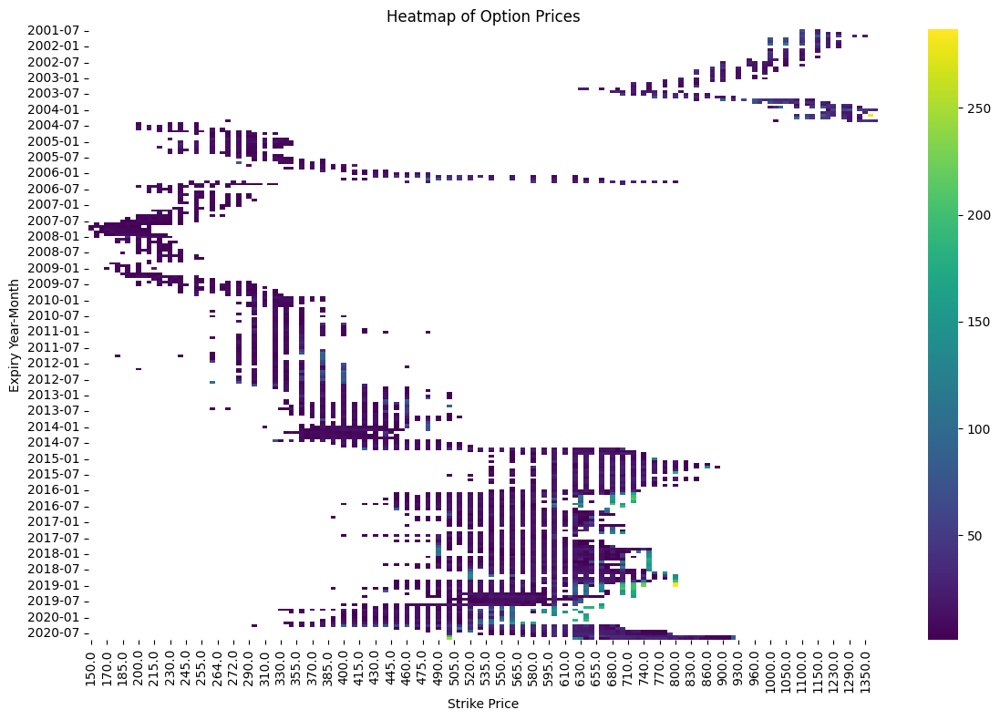

In [30]:

# Convert EXPIRY_DT column to datetime format
df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])

# Extract year and month from the expiry dates
df['Year_Month'] = df['EXPIRY_DT'].dt.to_period('M')

# Pivot the data to create a matrix where rows are expiration dates, columns are strike prices, and values are option prices
heatmap_data = df.pivot_table(index='Year_Month', columns='STRIKE_PR', values='CLOSE', aggfunc='mean')

# Plot
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis')
plt.xlabel('Strike Price')
plt.ylabel('Expiry Year-Month')
plt.title('Heatmap of Option Prices')
plt.tight_layout()
plt.show()


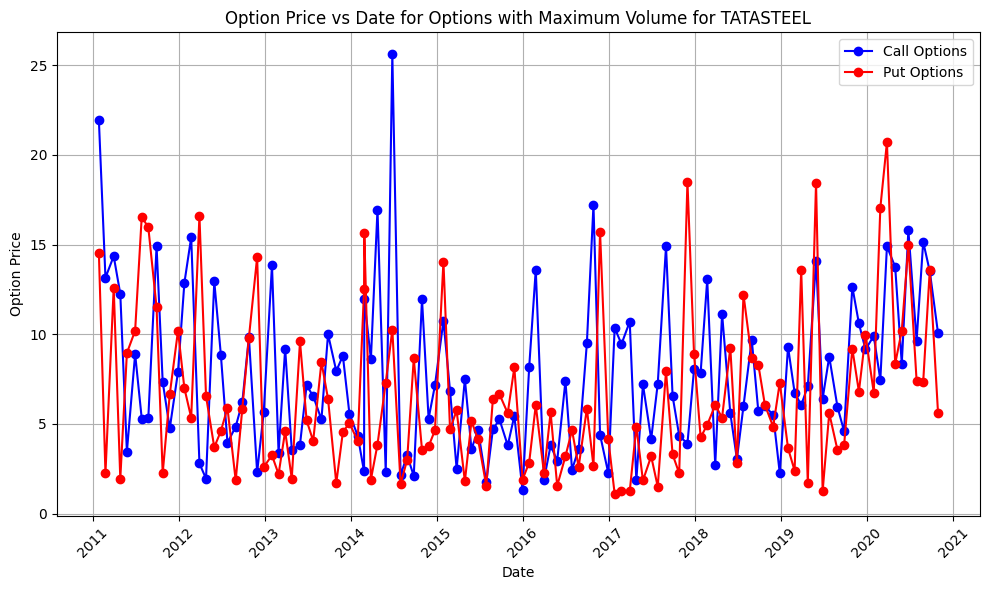

<Figure size 1000x600 with 0 Axes>

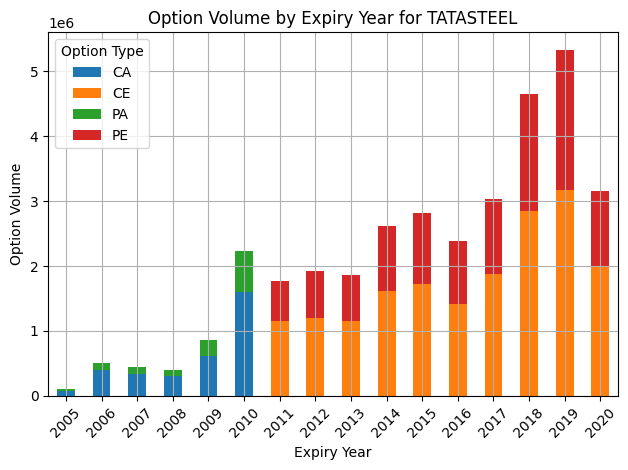

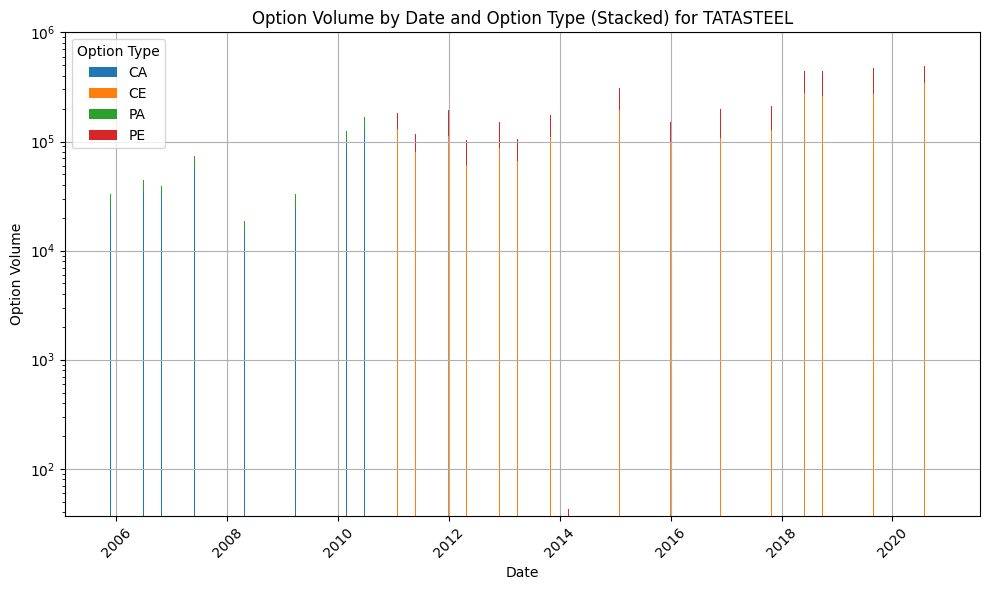

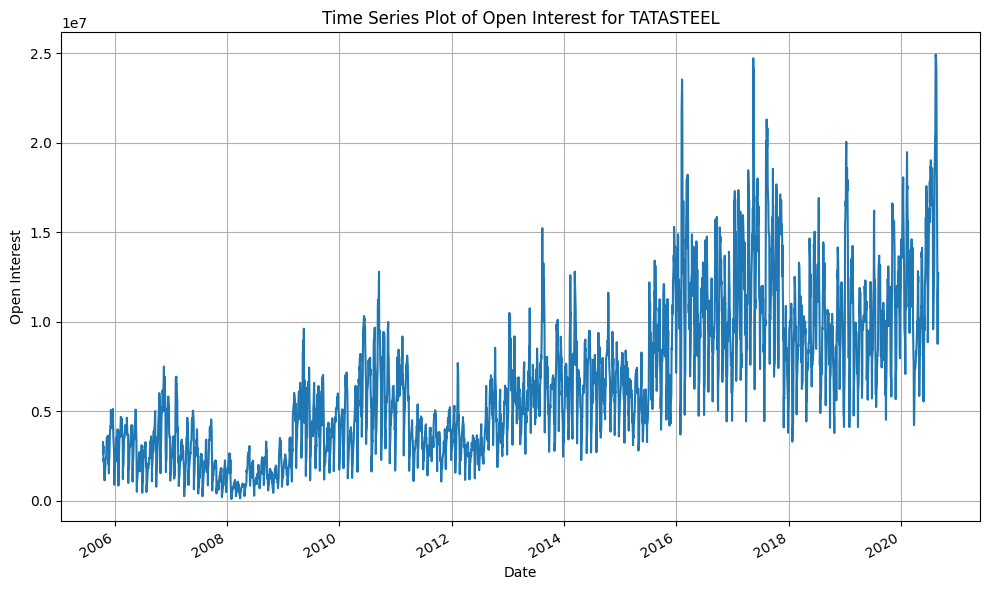

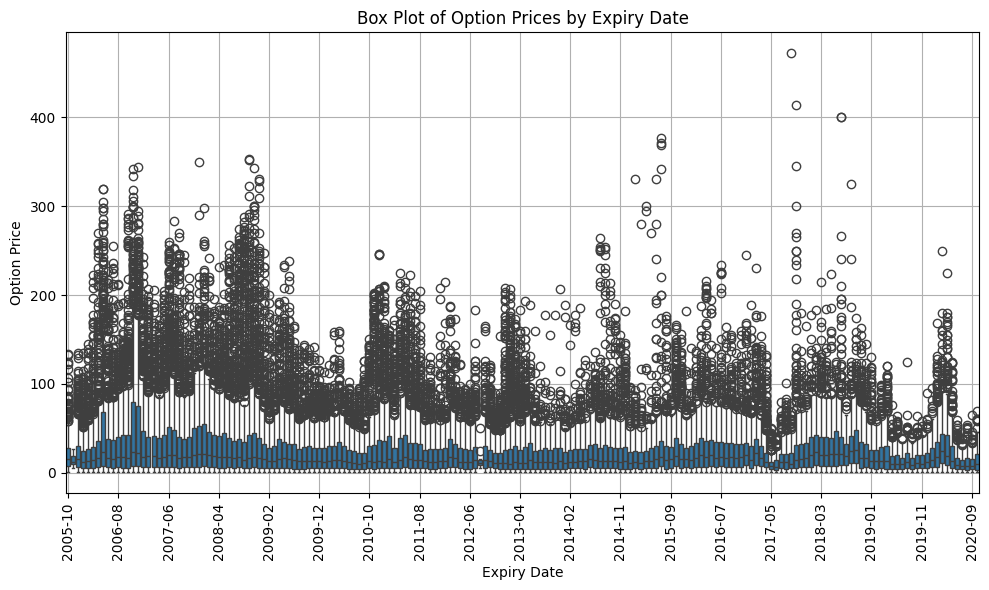

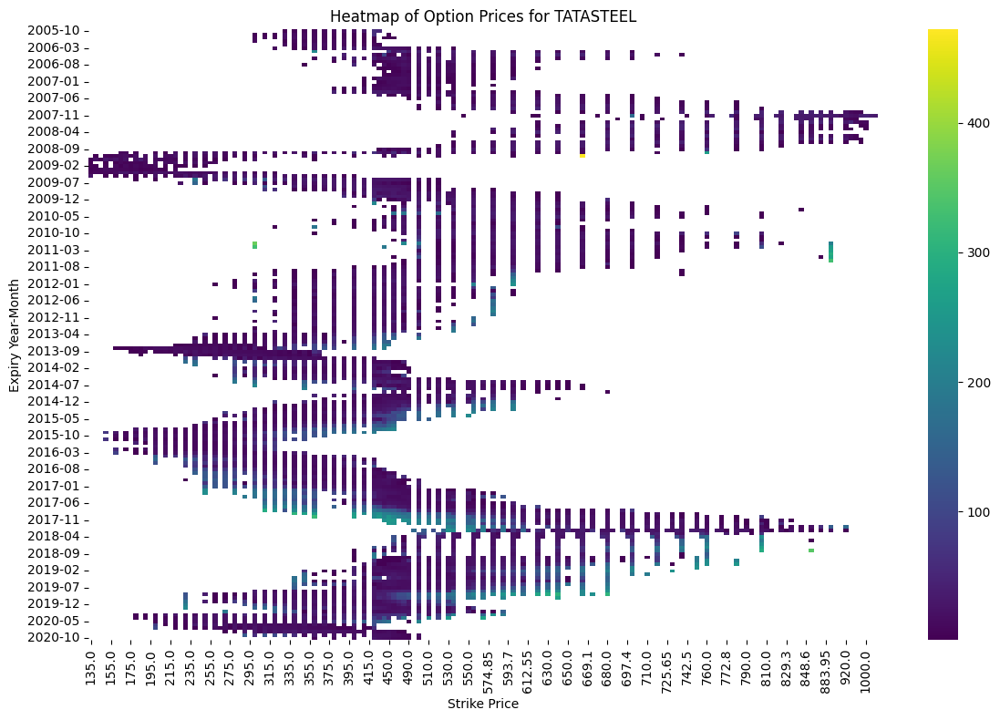

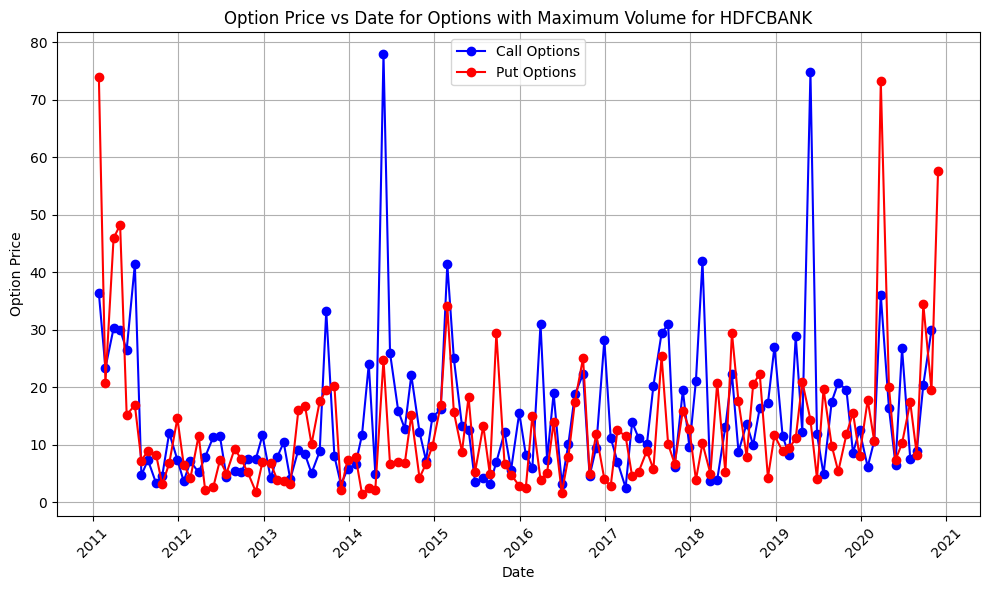

<Figure size 1000x600 with 0 Axes>

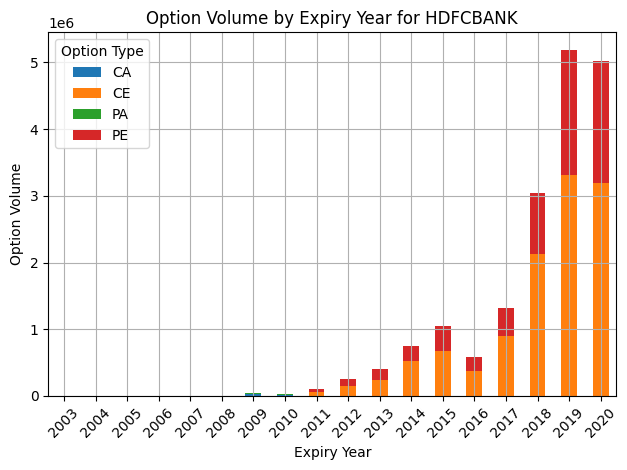

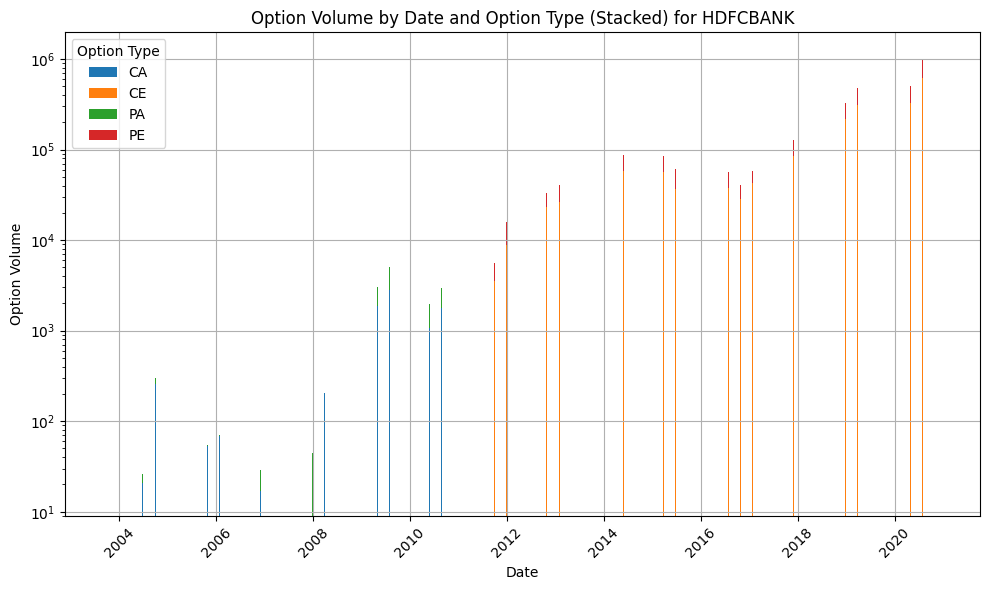

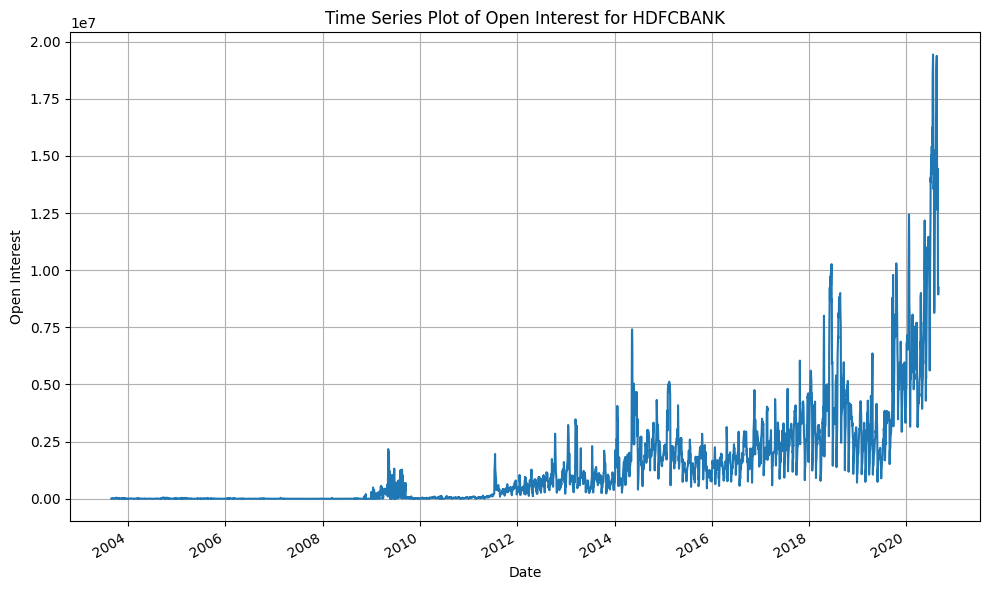

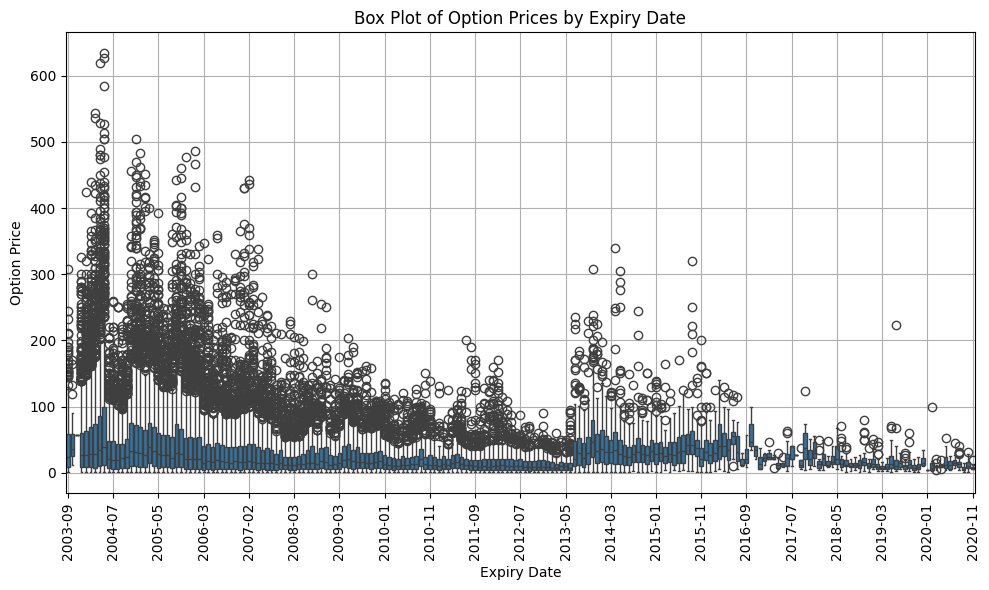

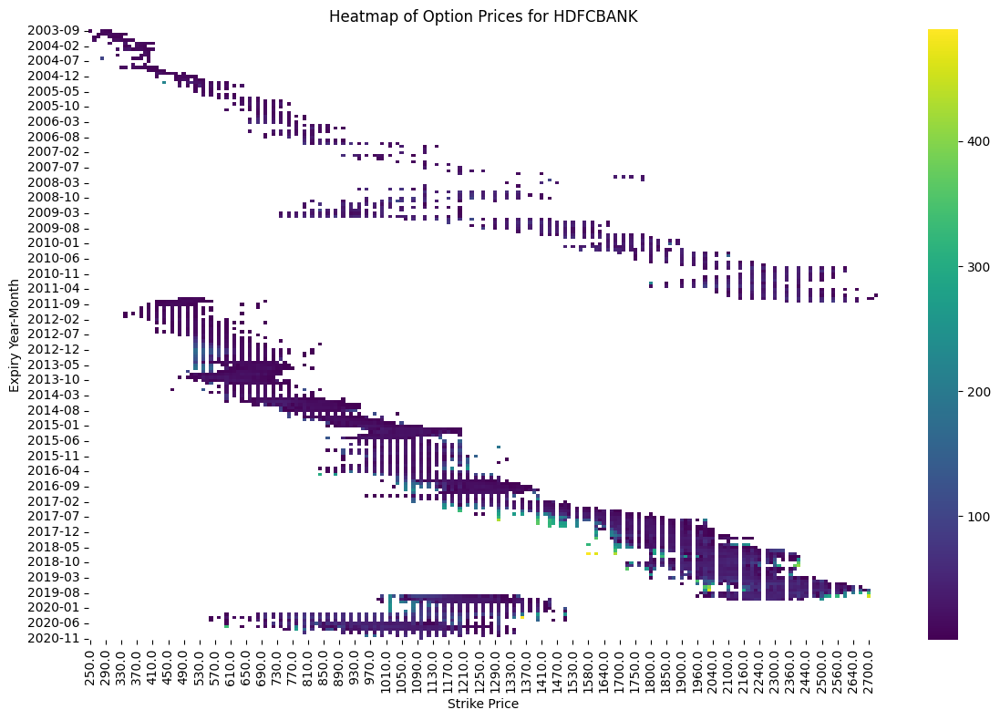

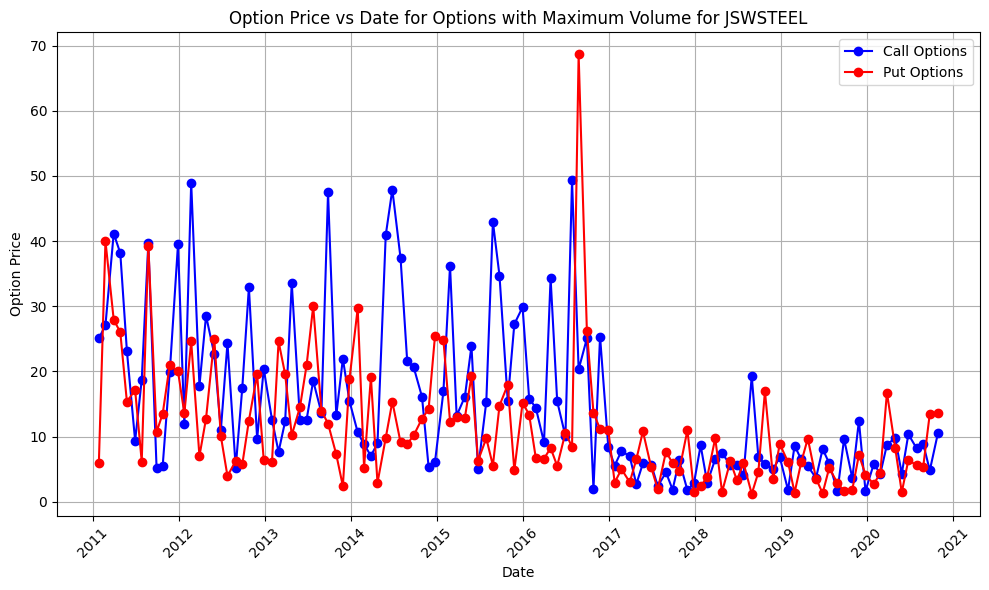

<Figure size 1000x600 with 0 Axes>

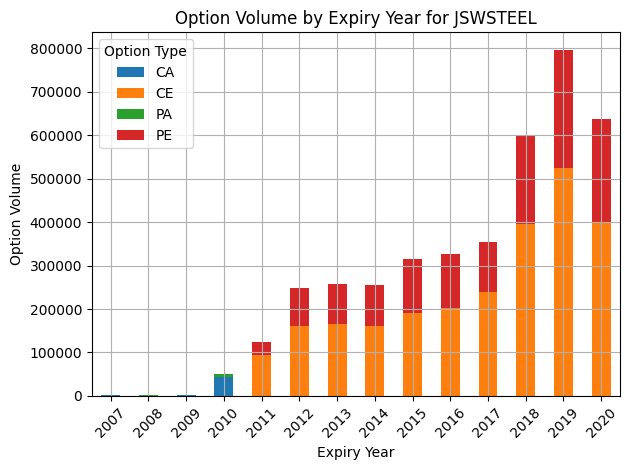

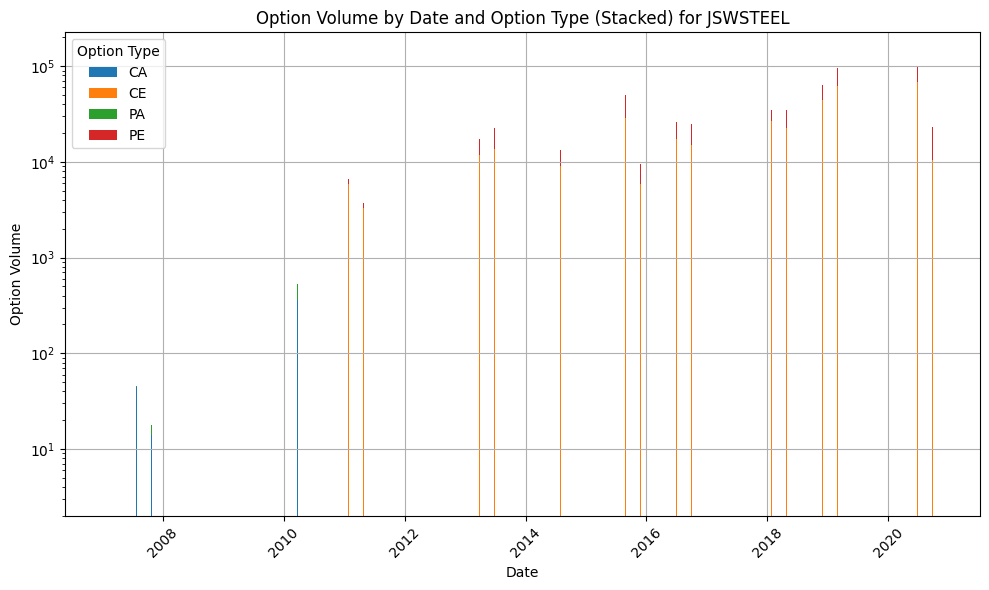

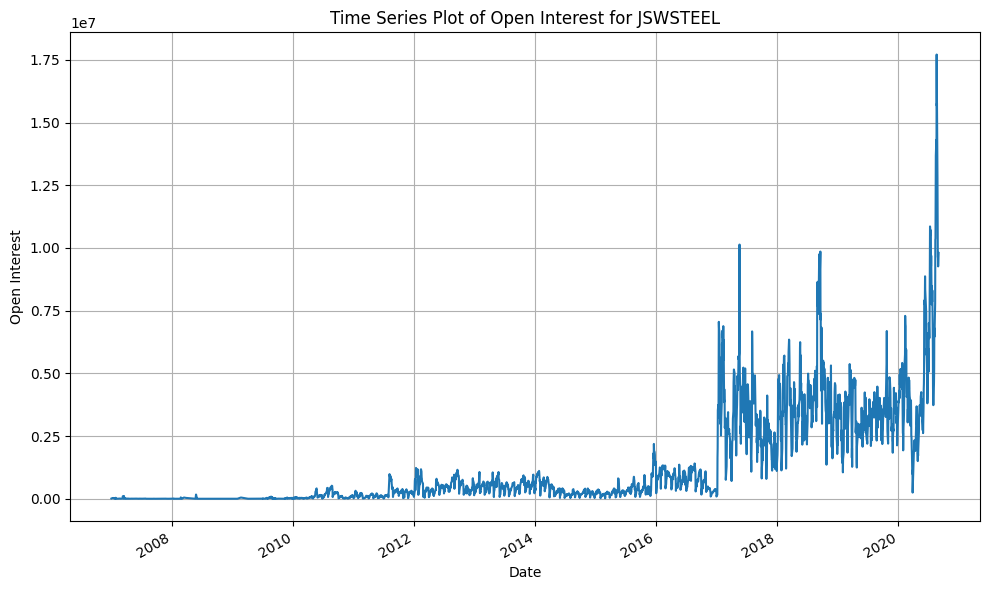

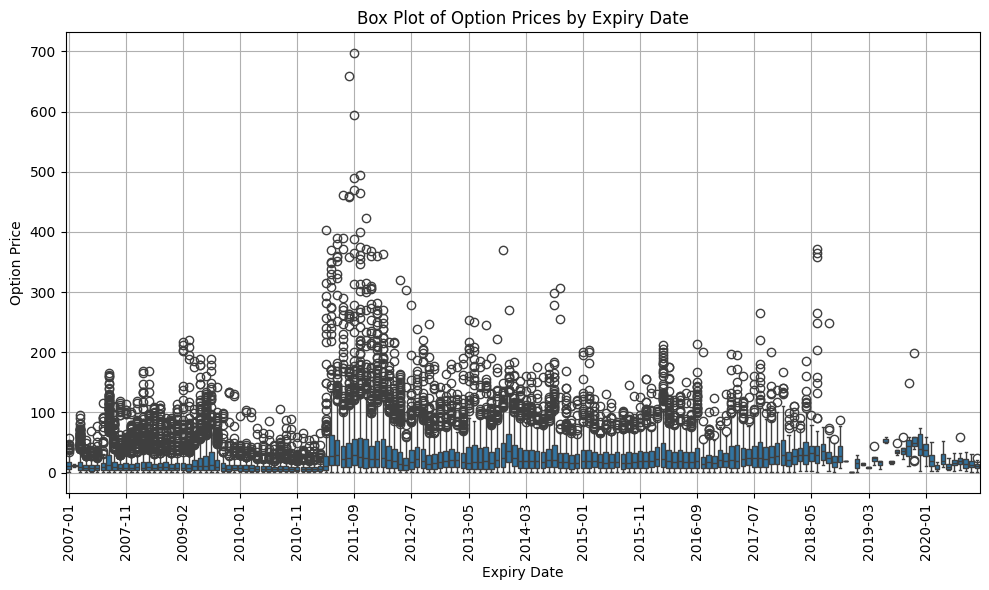

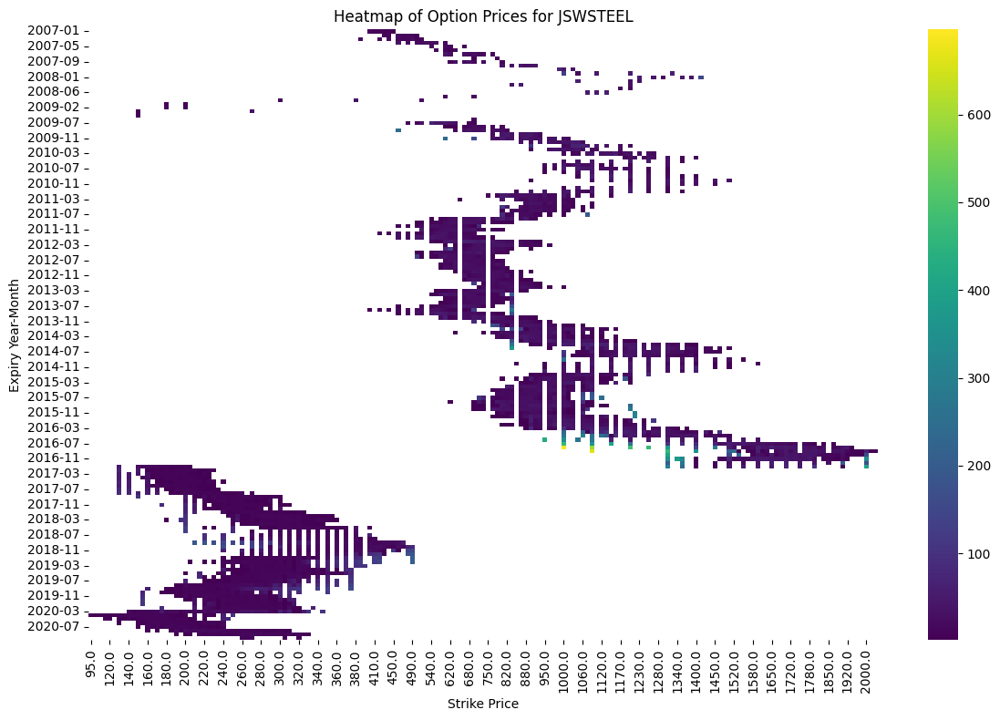

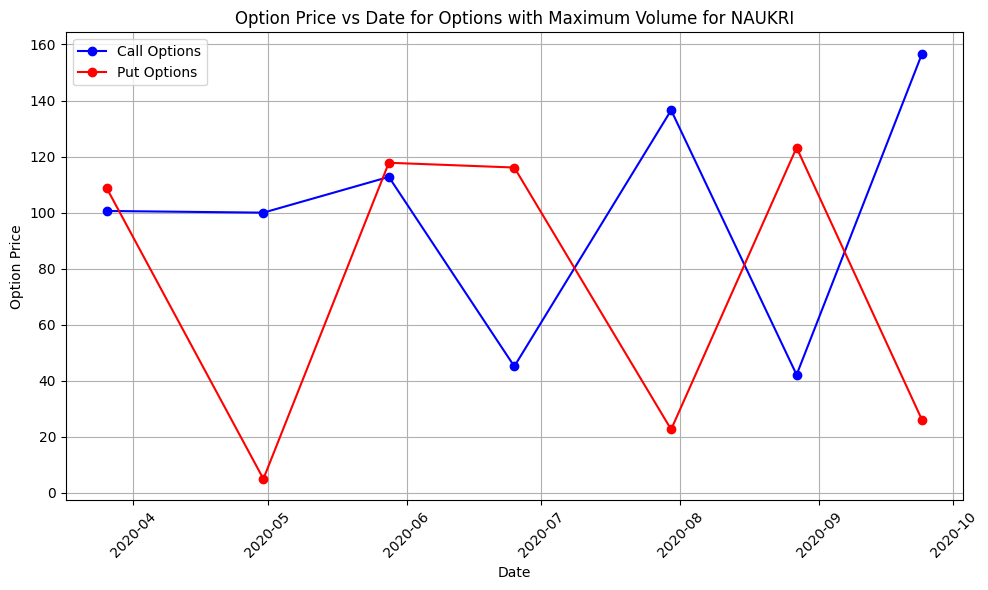

<Figure size 1000x600 with 0 Axes>

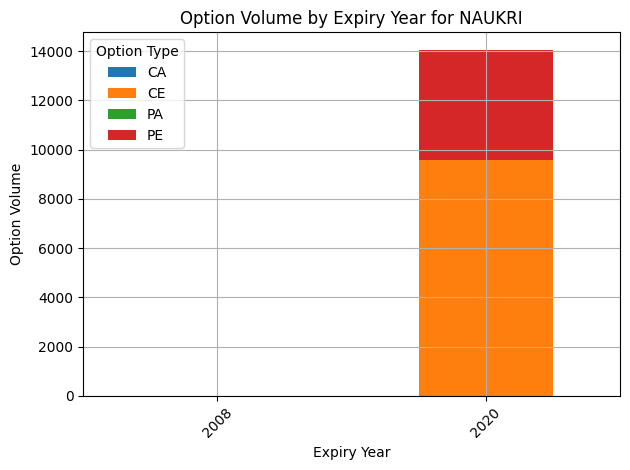

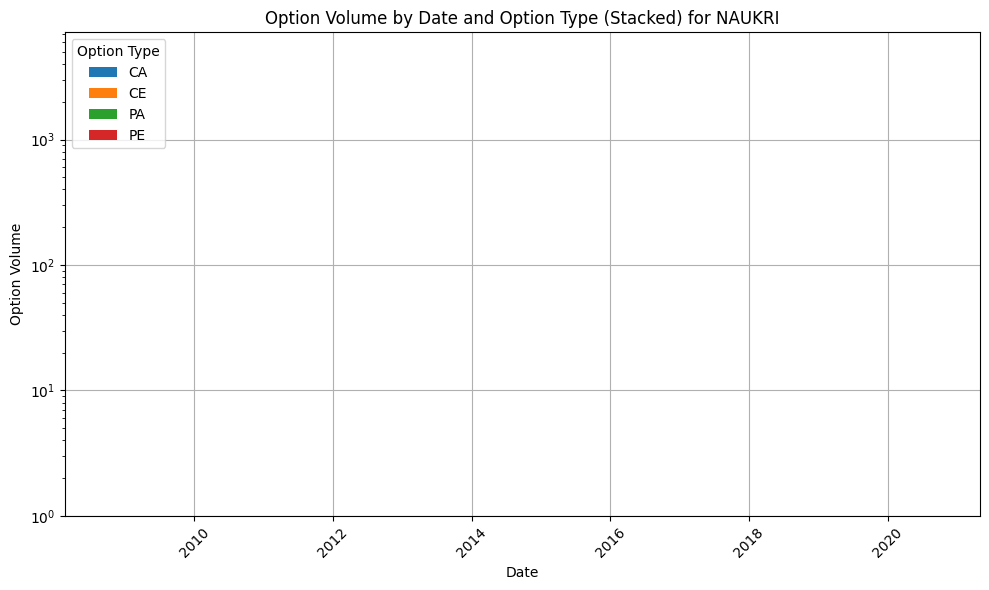

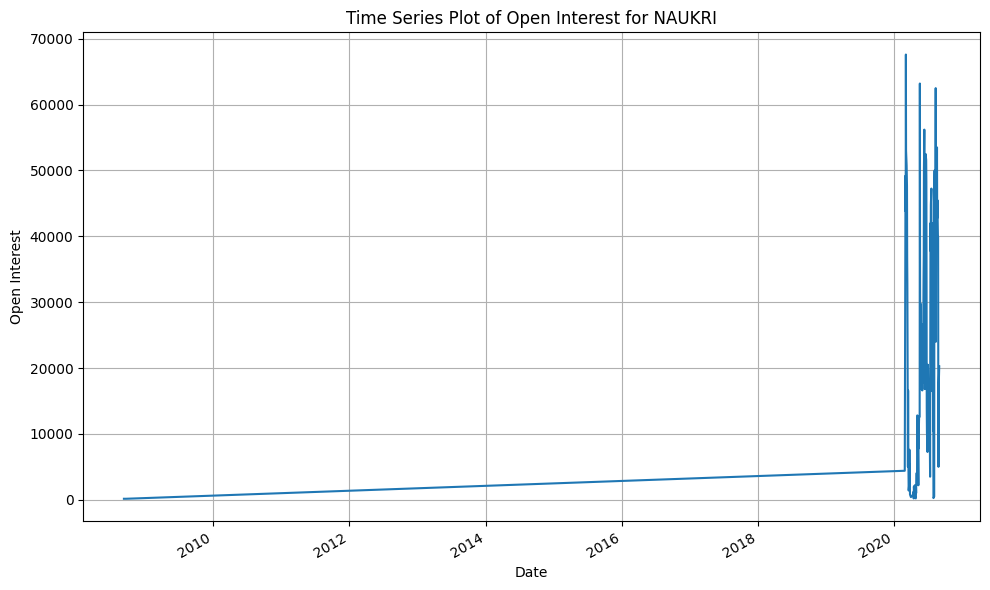

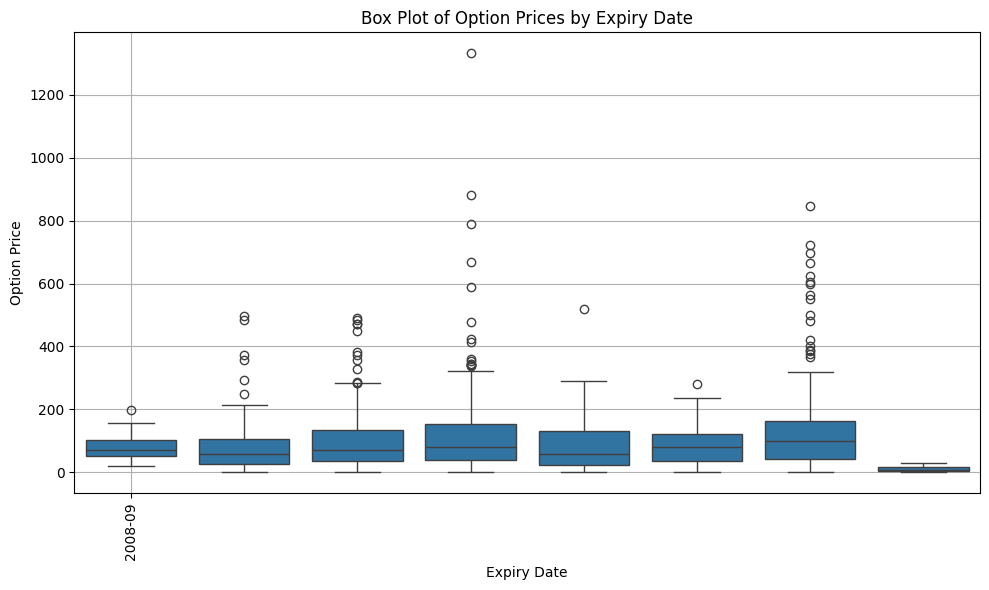

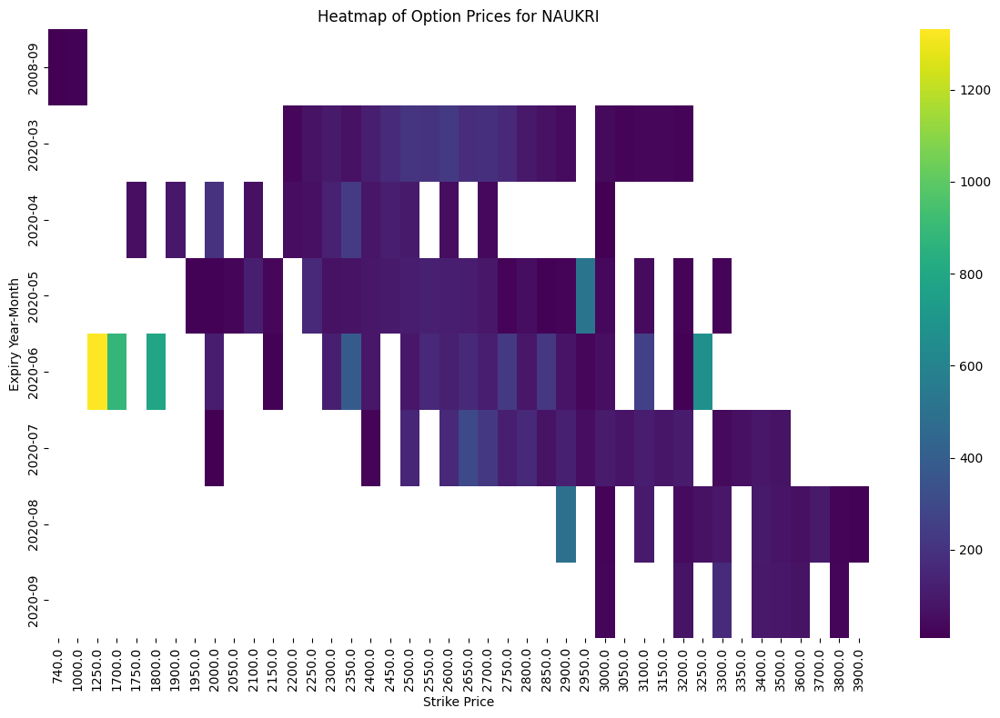

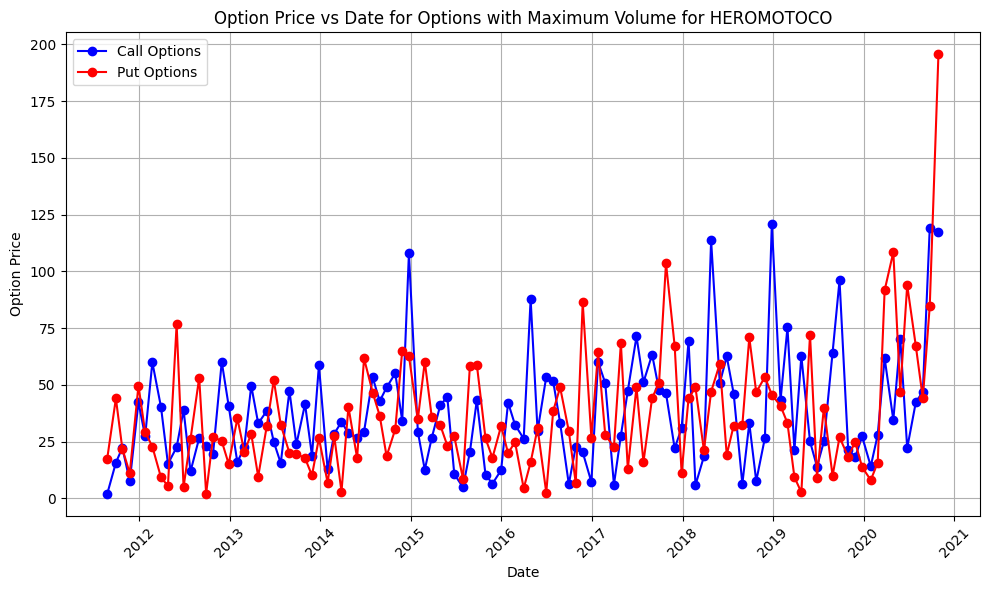

<Figure size 1000x600 with 0 Axes>

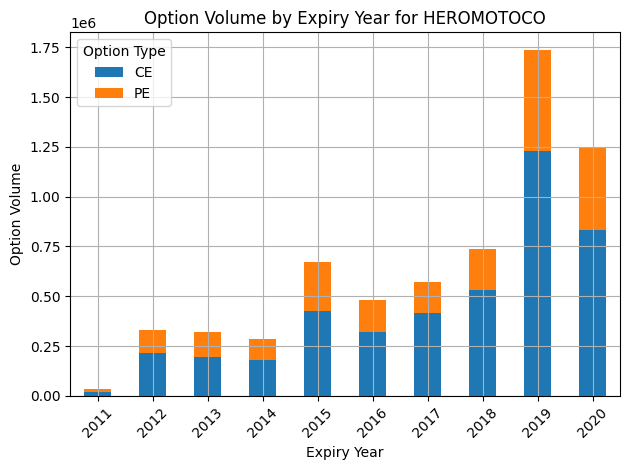

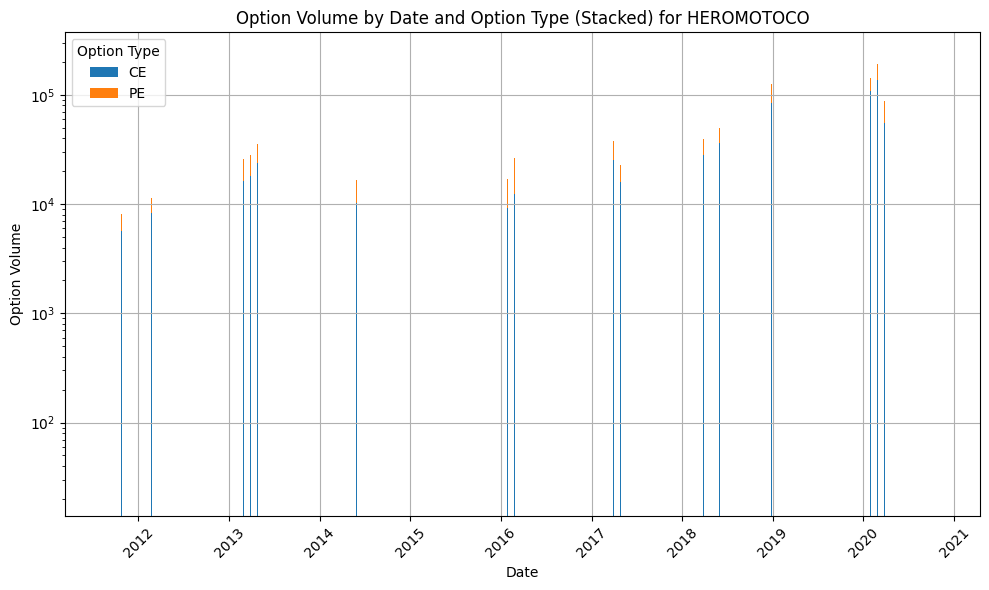

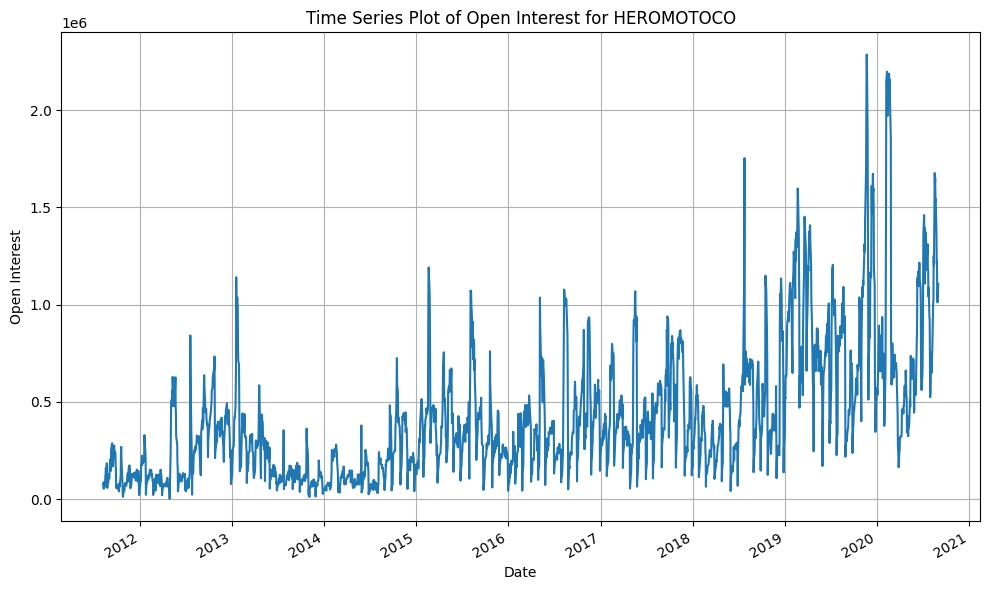

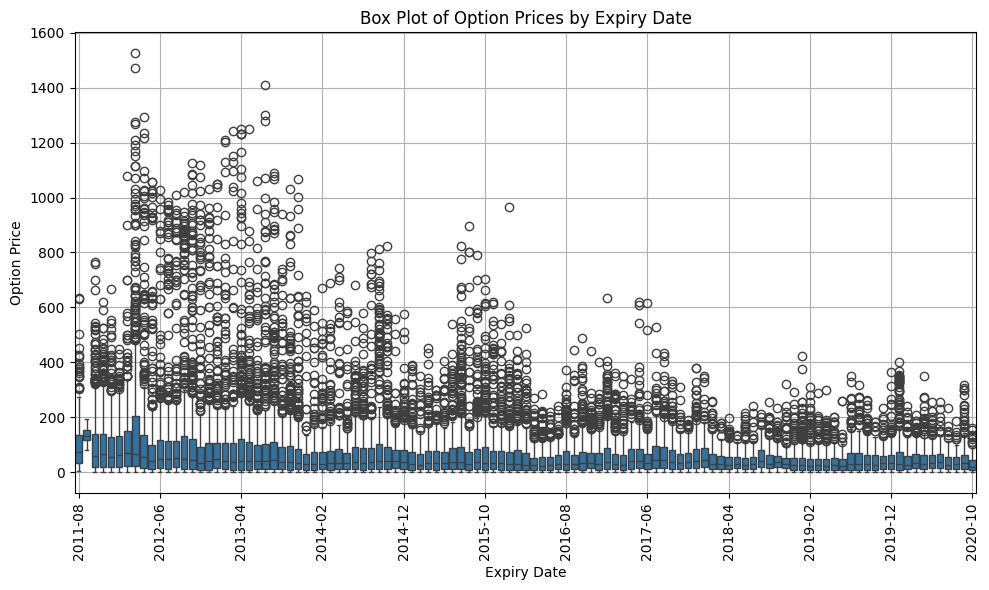

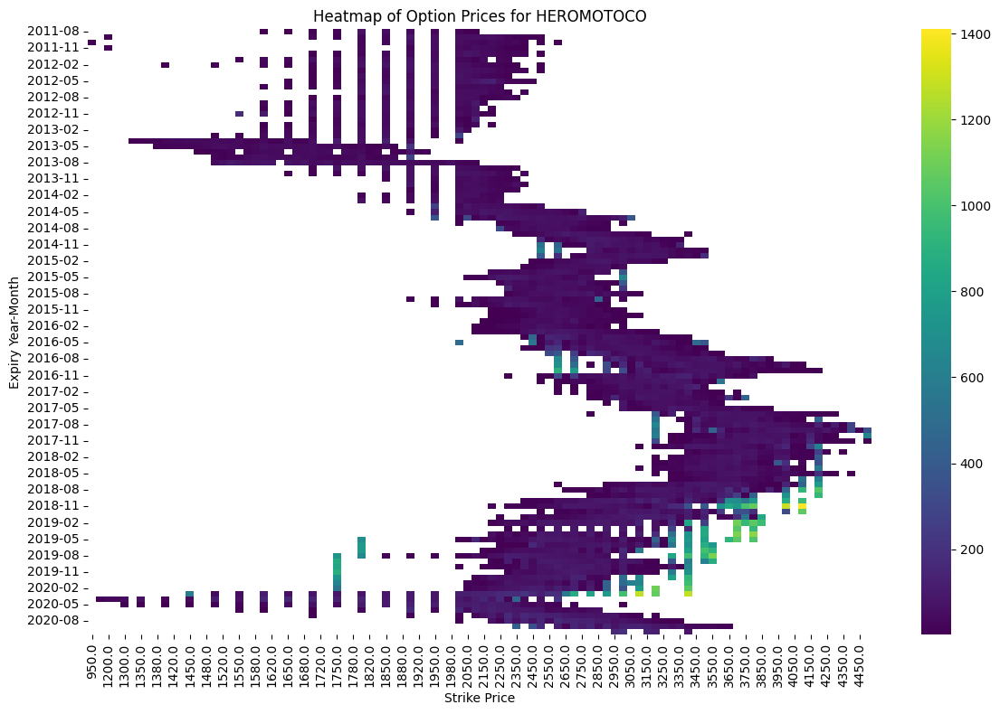

No data available for NESTIND. Skipping...


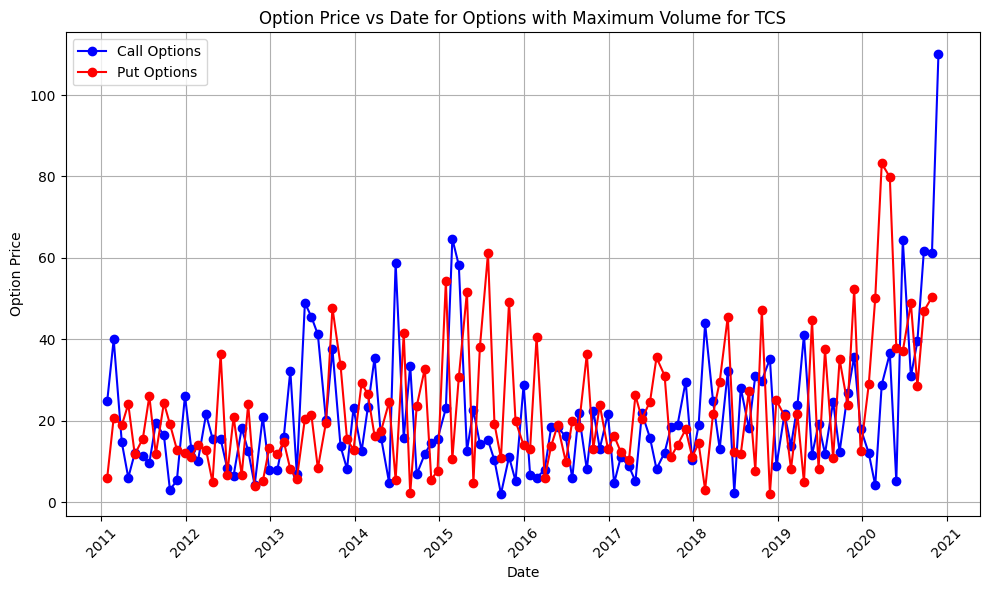

<Figure size 1000x600 with 0 Axes>

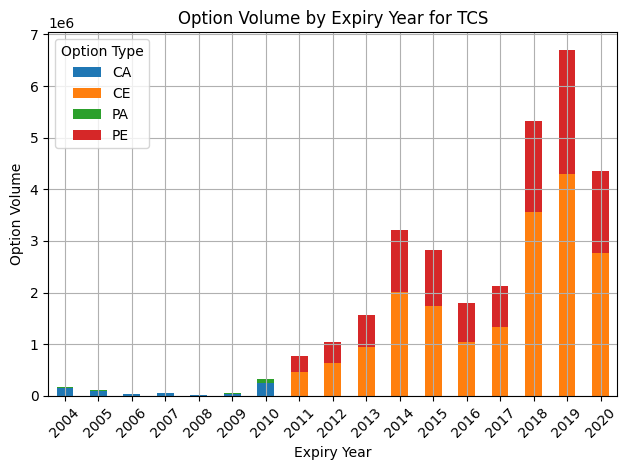

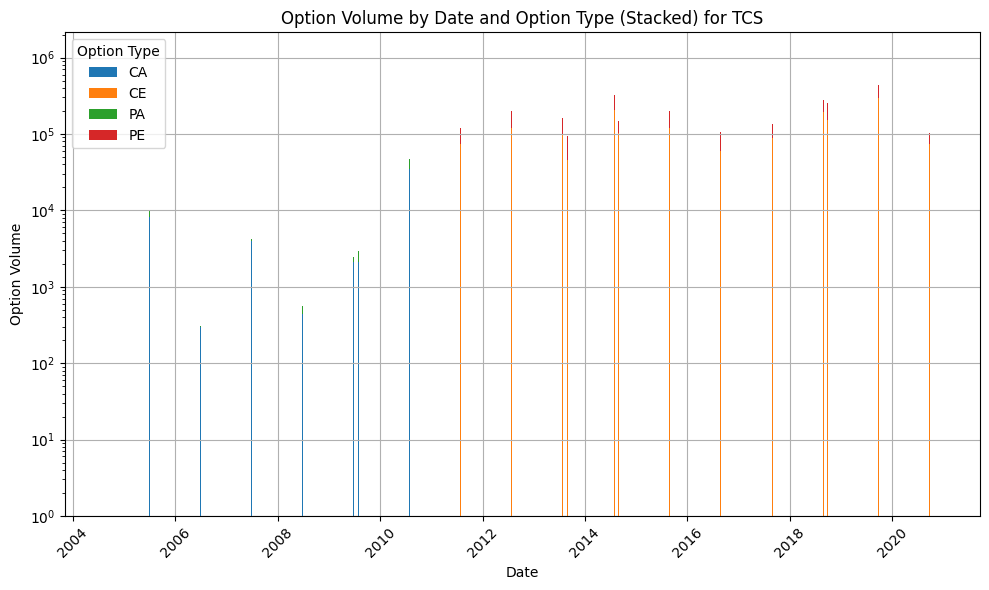

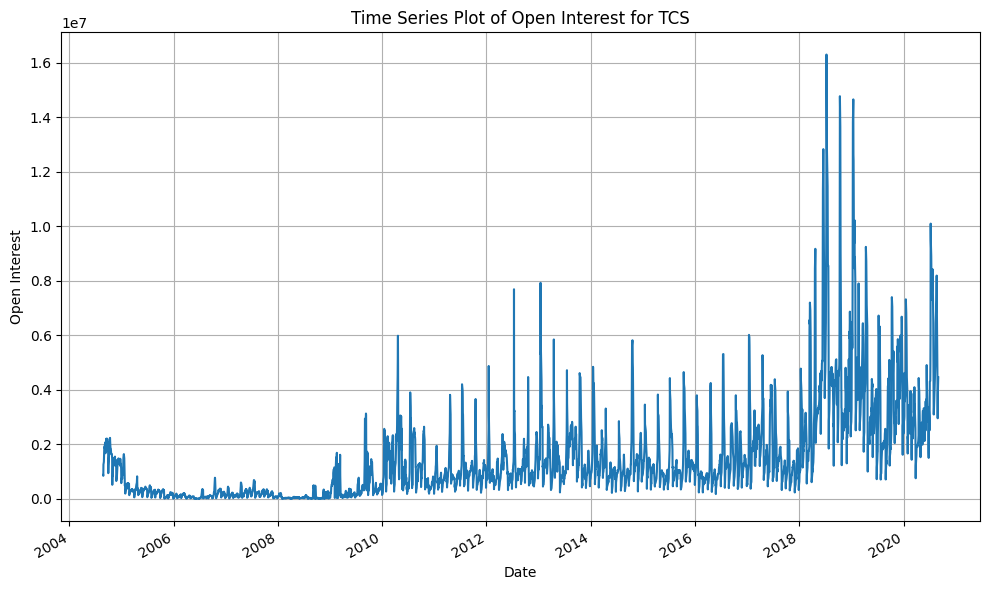

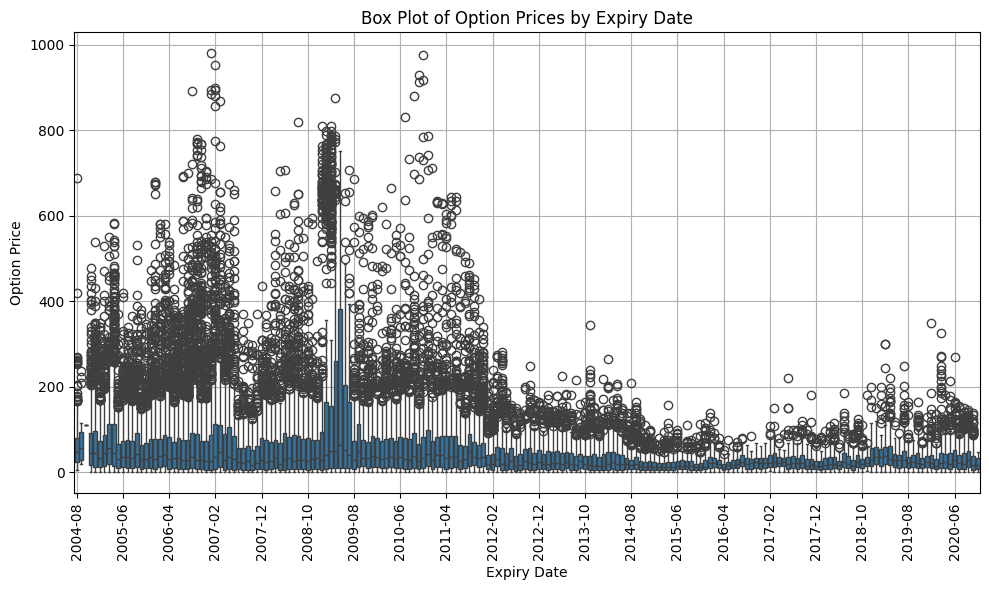

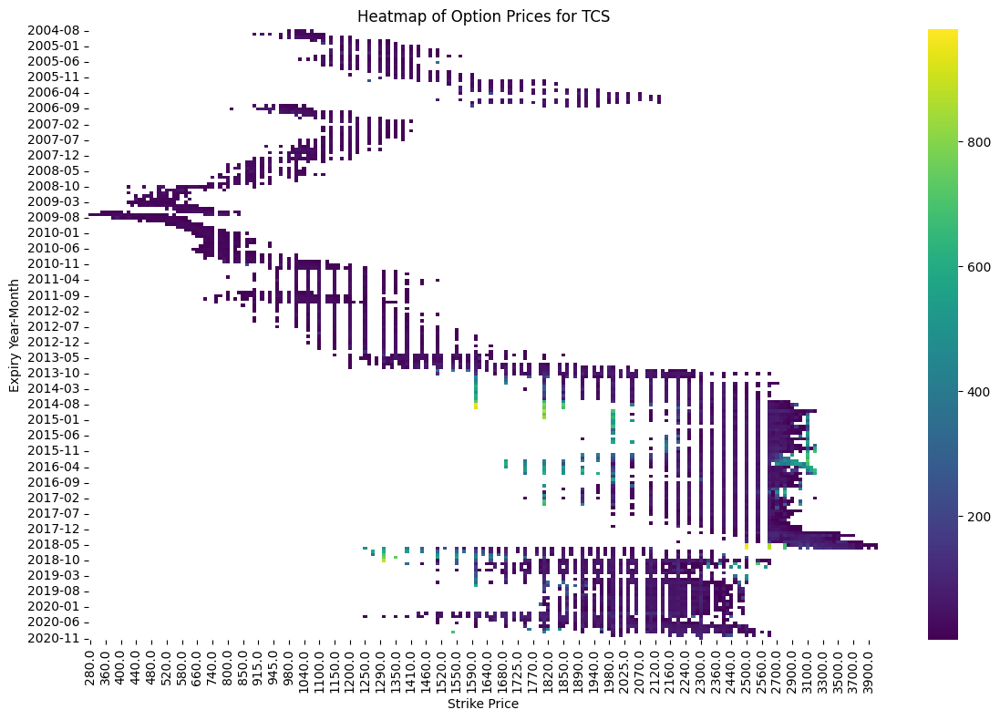

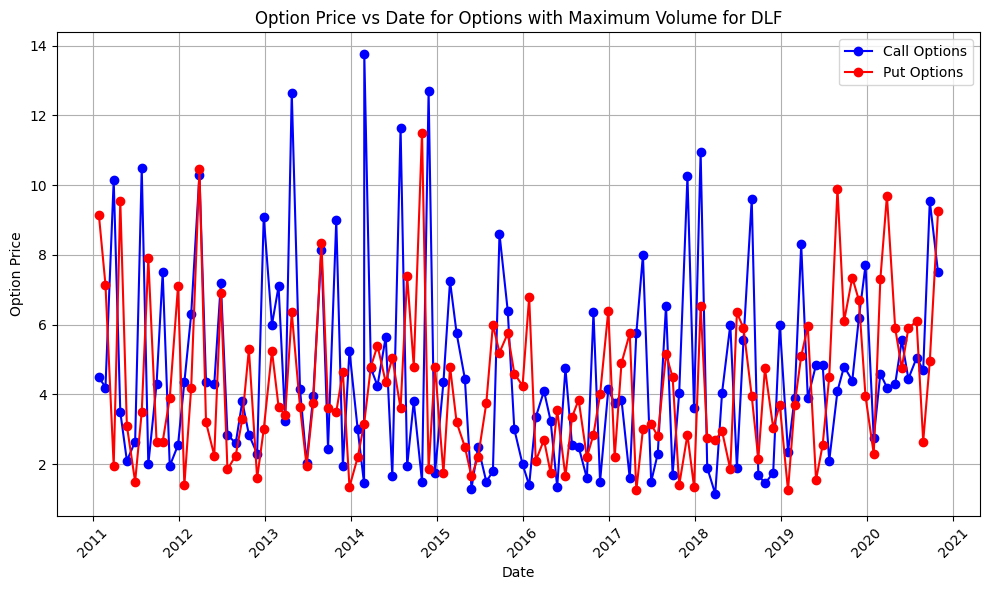

<Figure size 1000x600 with 0 Axes>

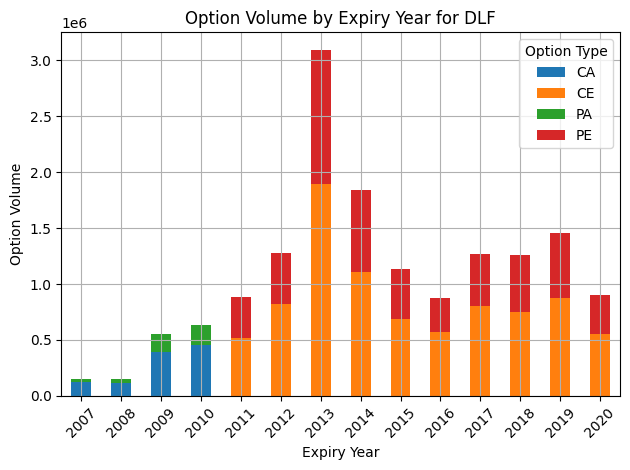

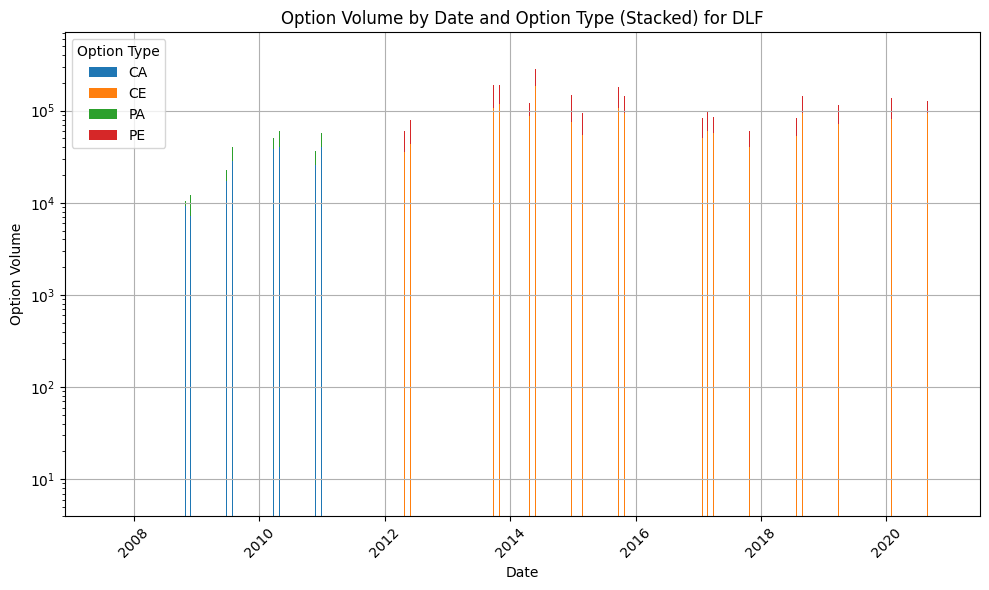

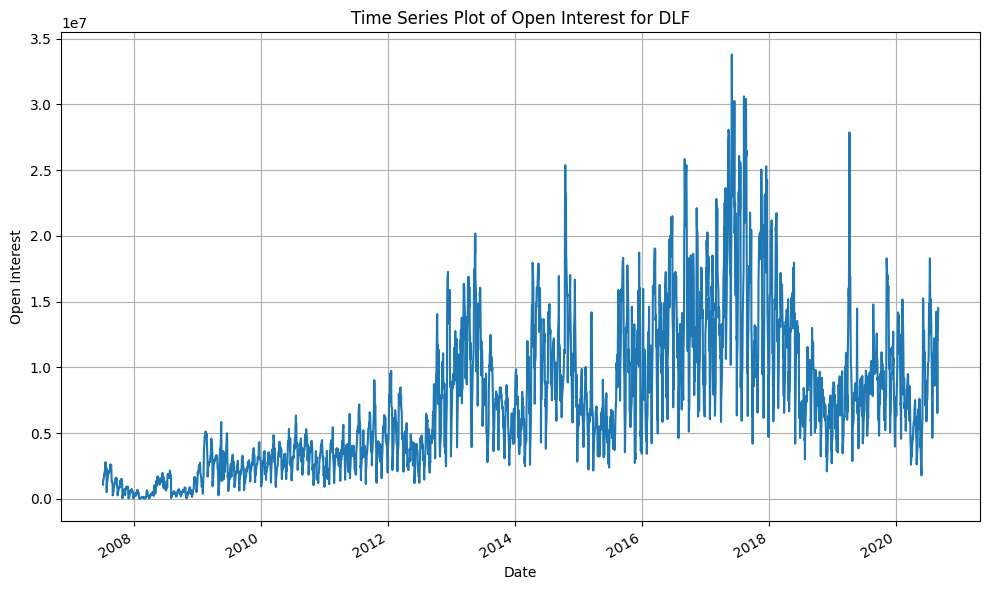

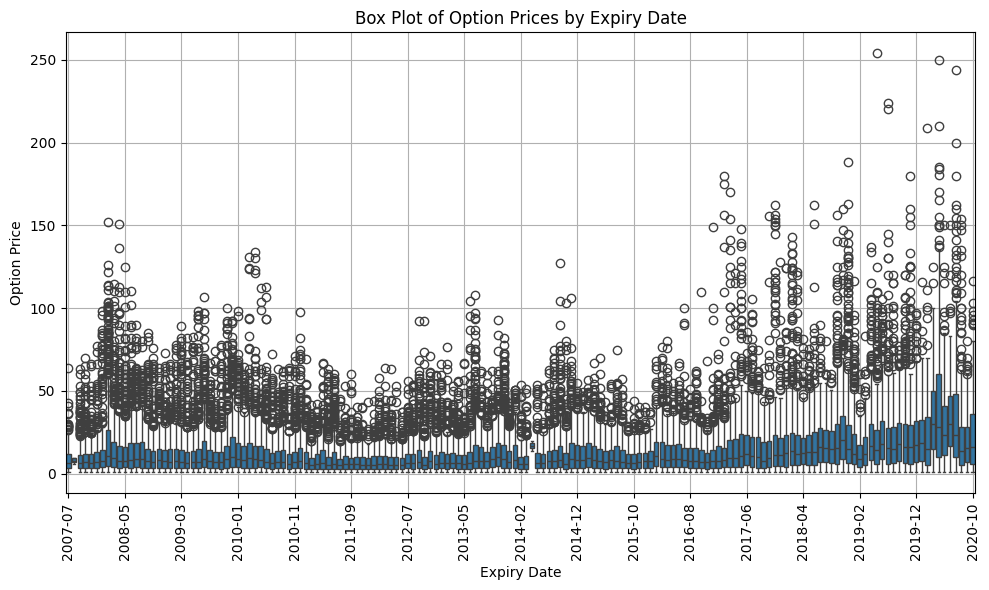

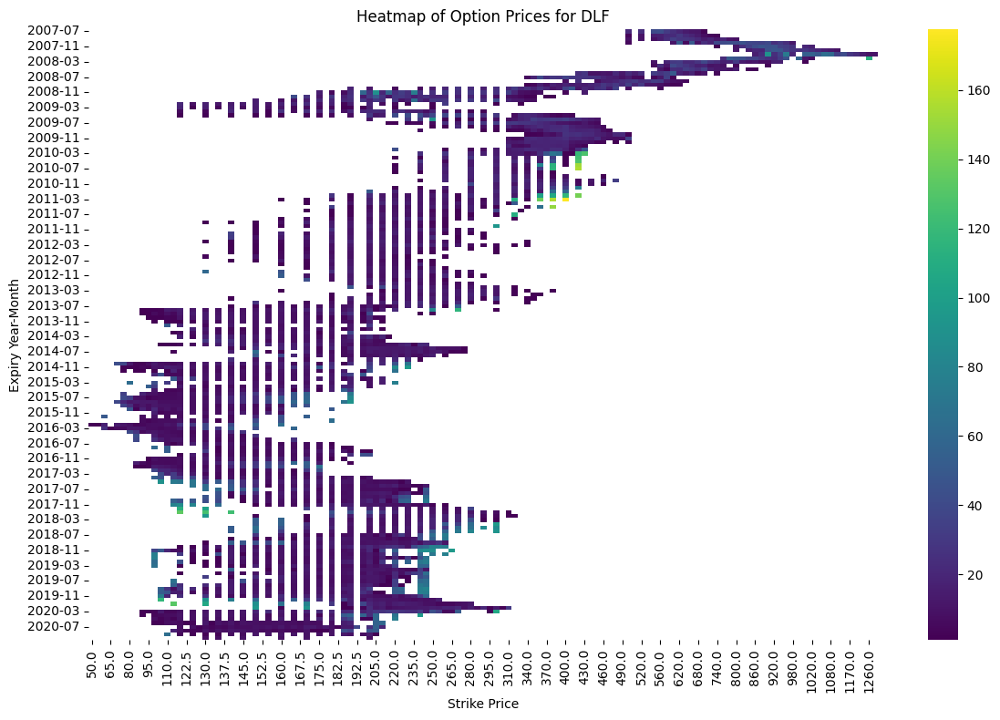

No data available for INIDGO. Skipping...


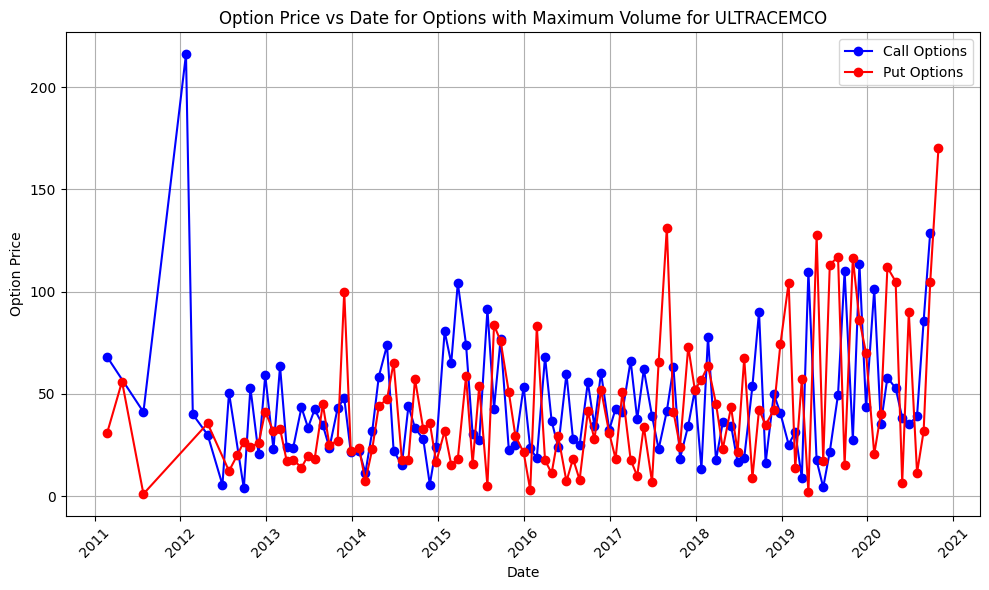

<Figure size 1000x600 with 0 Axes>

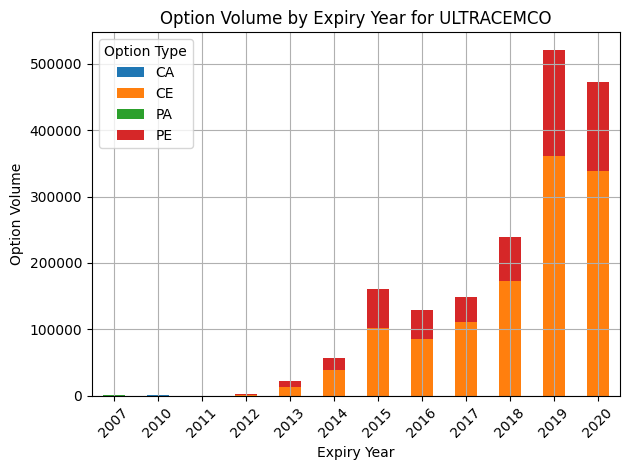

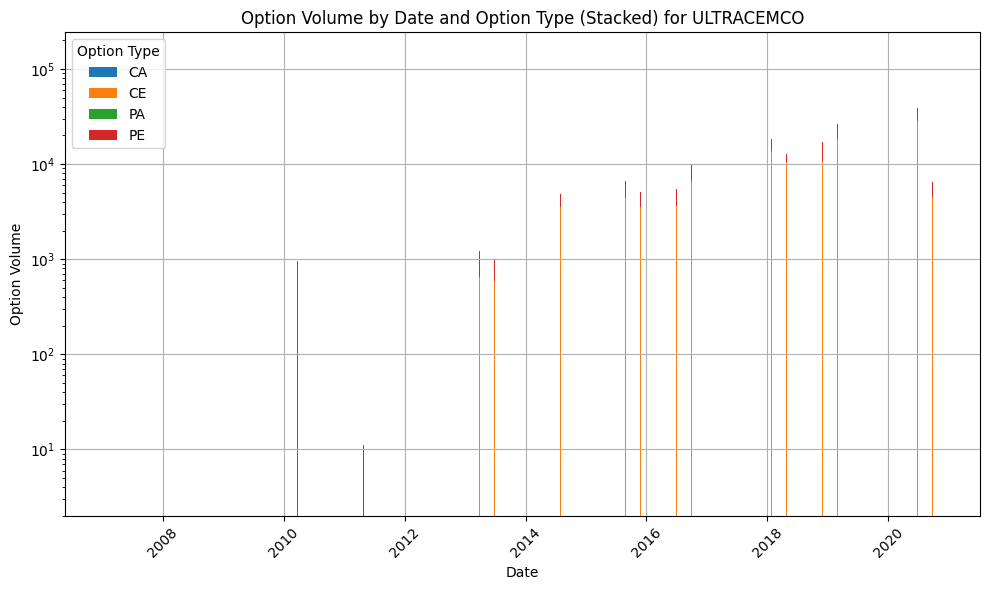

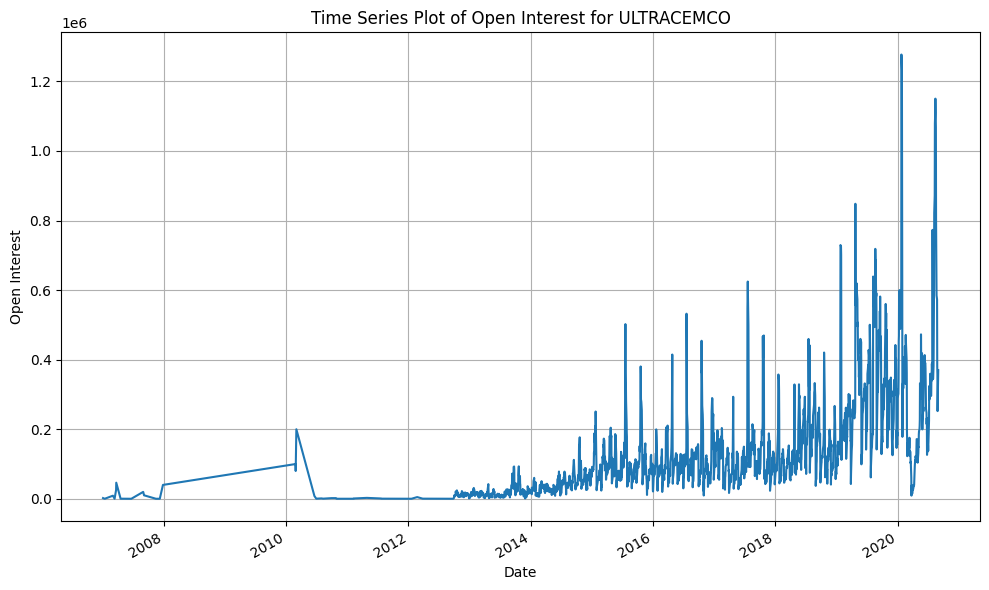

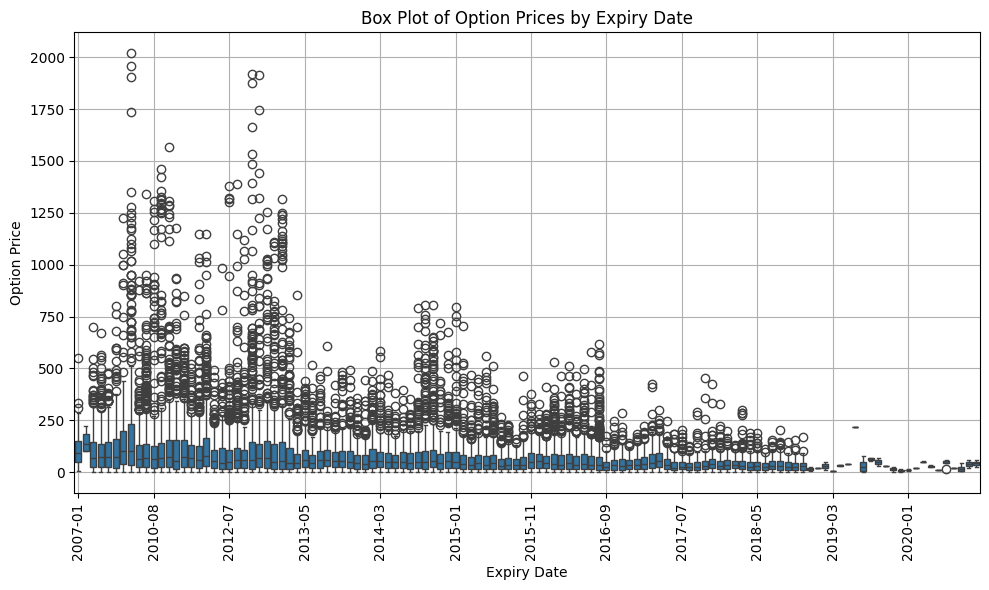

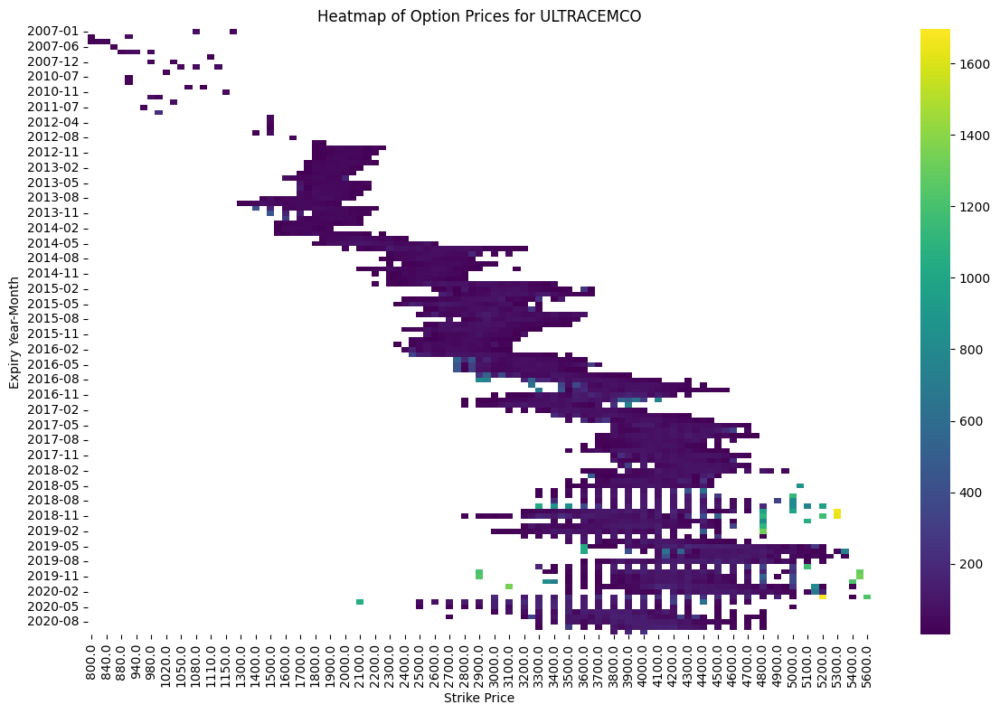

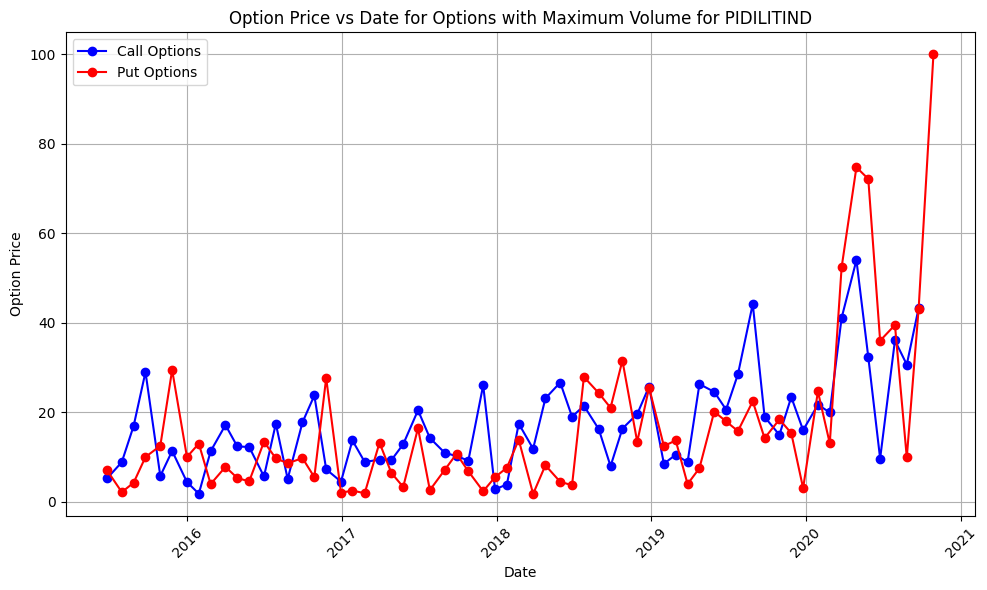

<Figure size 1000x600 with 0 Axes>

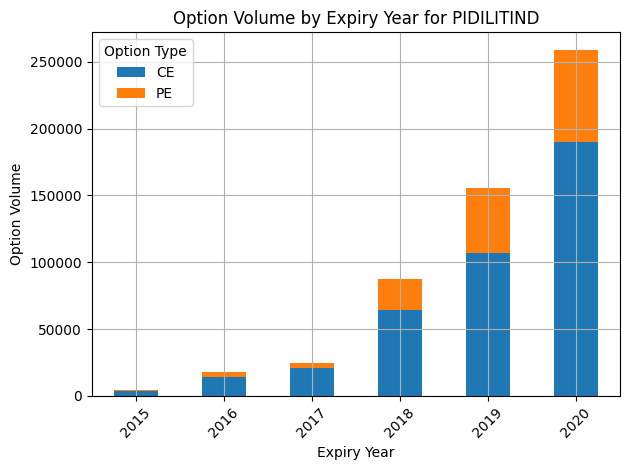

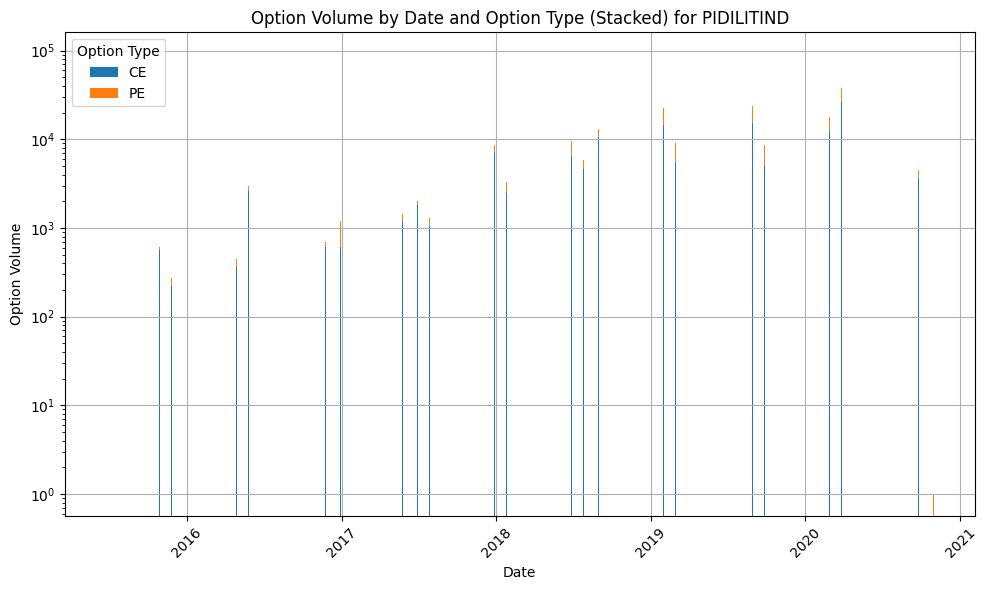

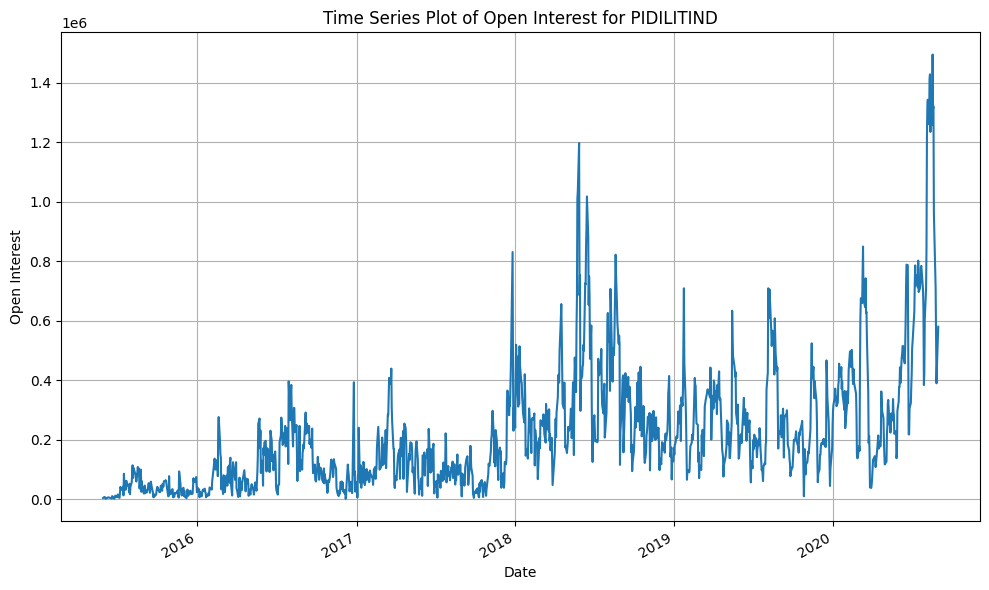

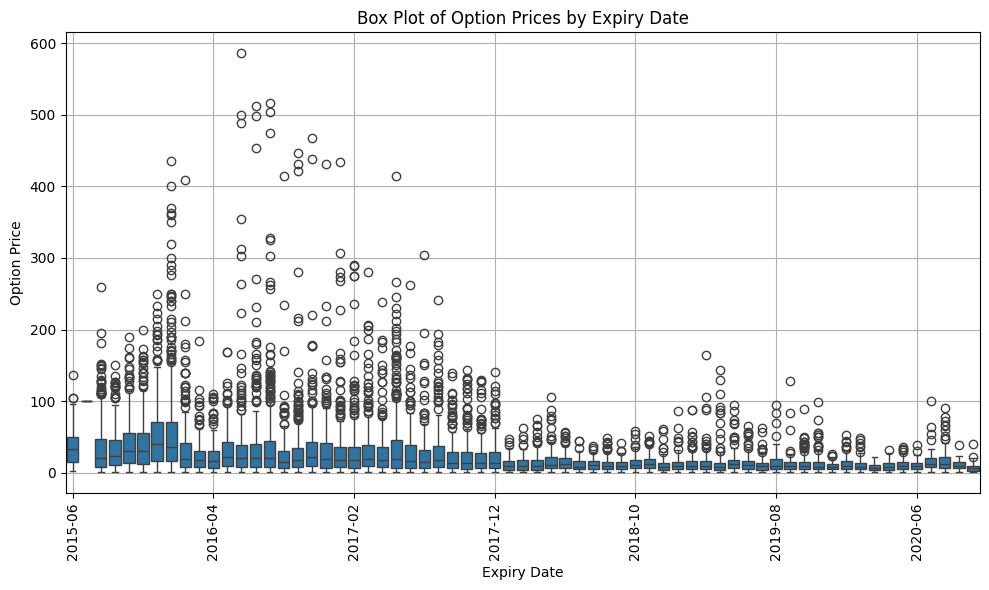

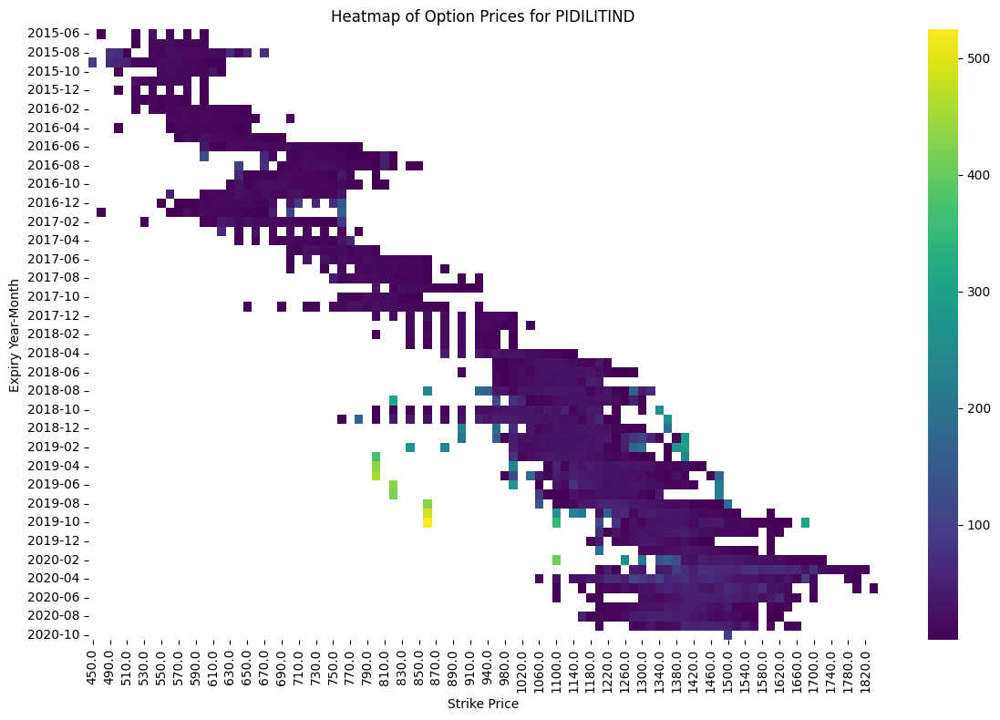

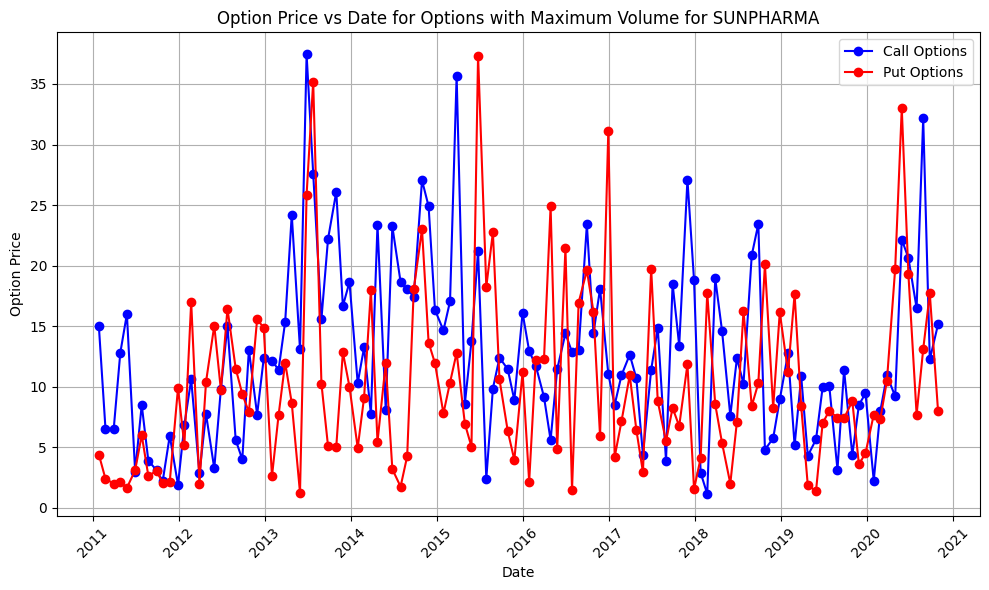

<Figure size 1000x600 with 0 Axes>

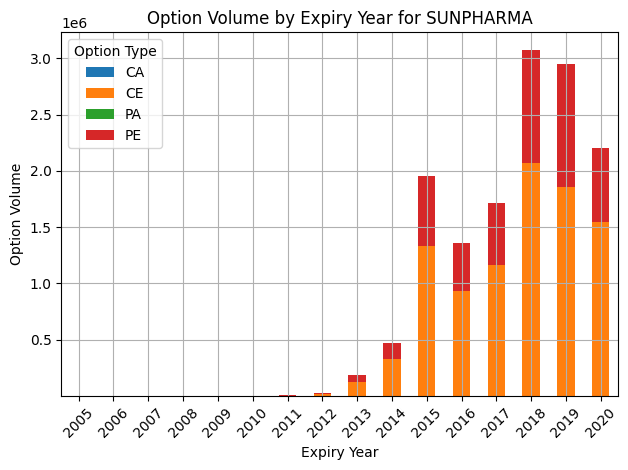

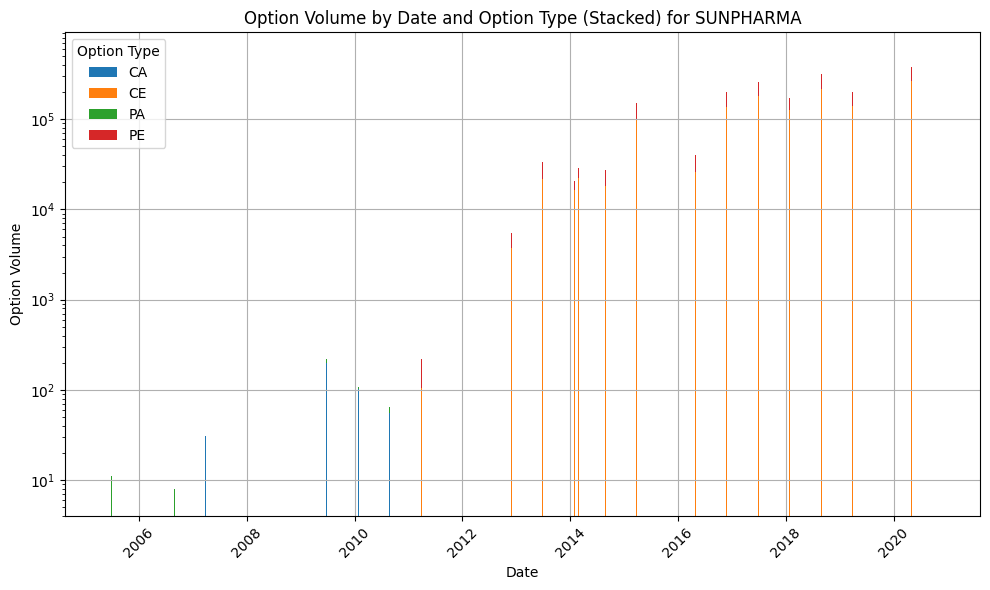

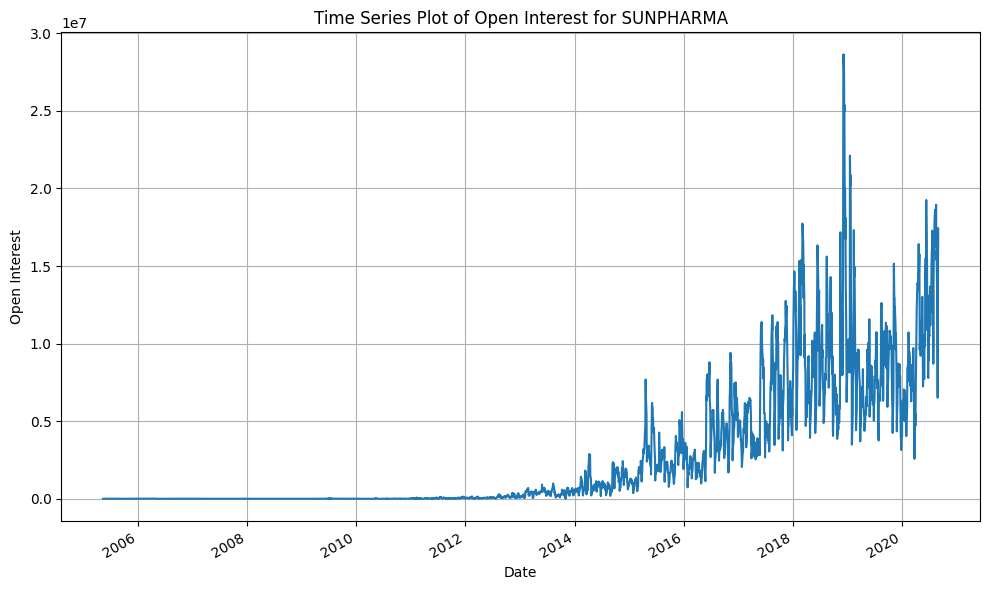

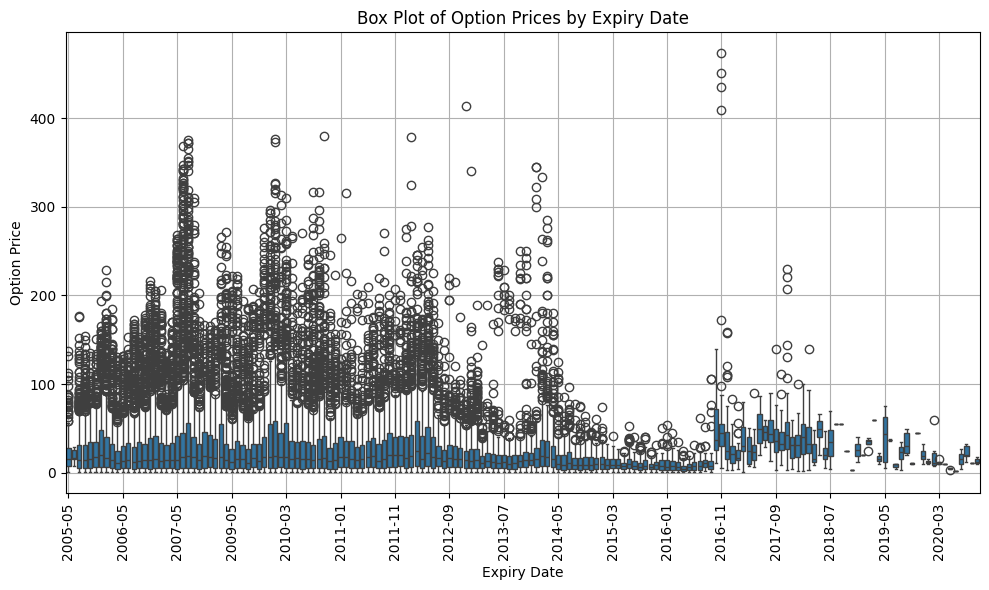

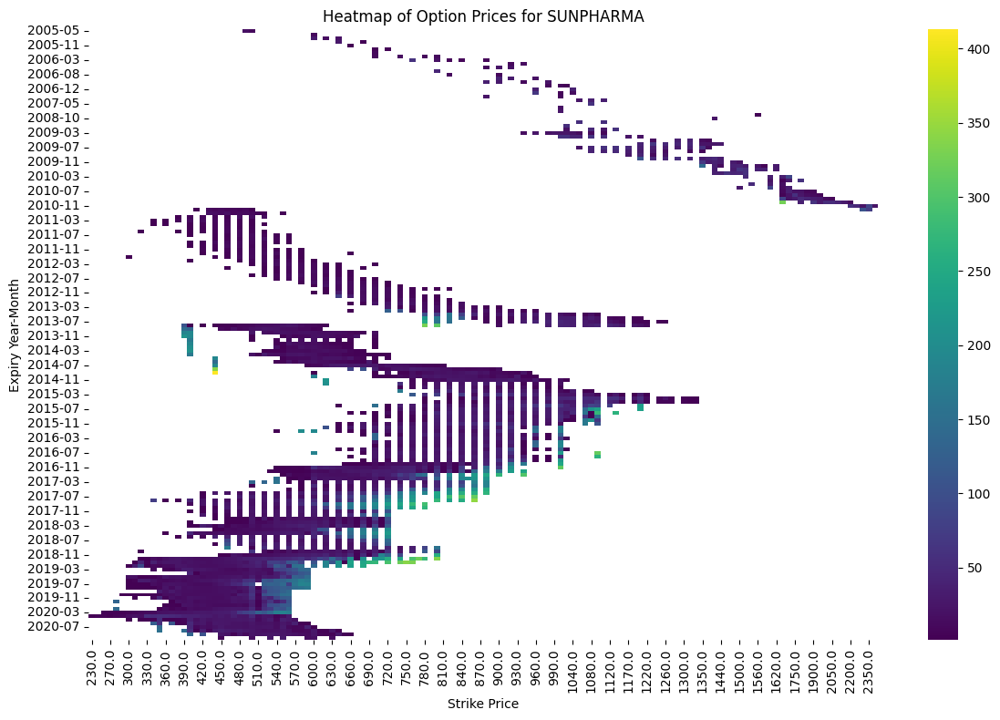

No data available for BHARATIARTL. Skipping...


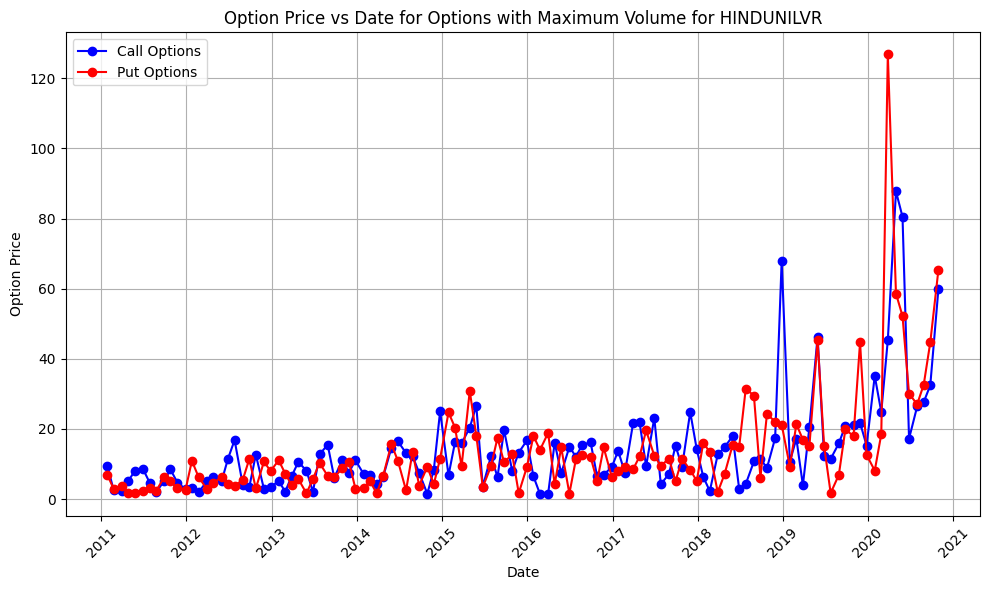

<Figure size 1000x600 with 0 Axes>

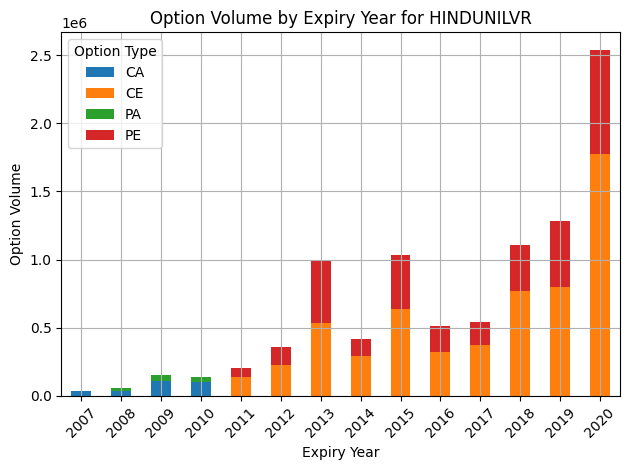

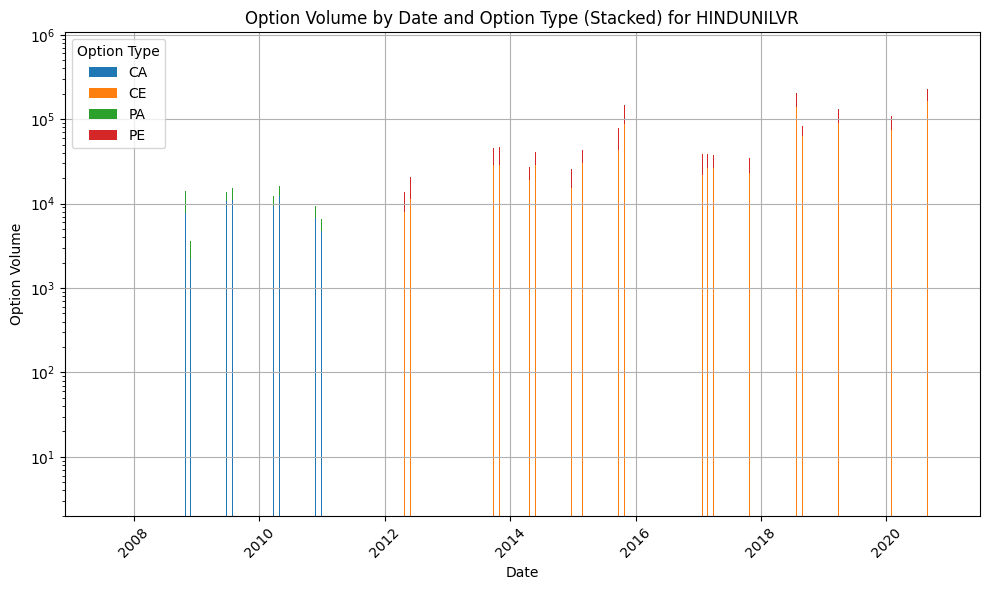

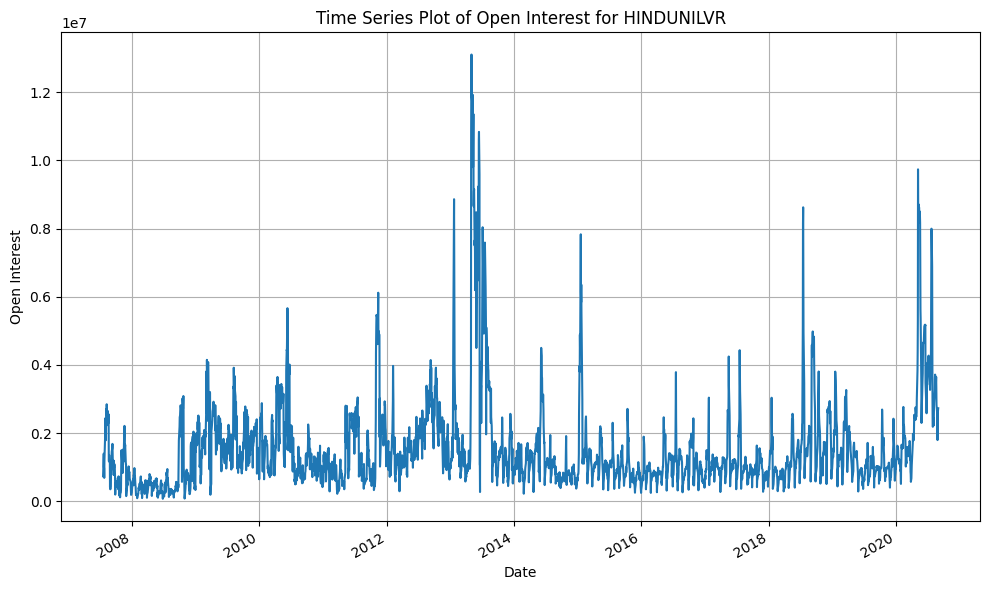

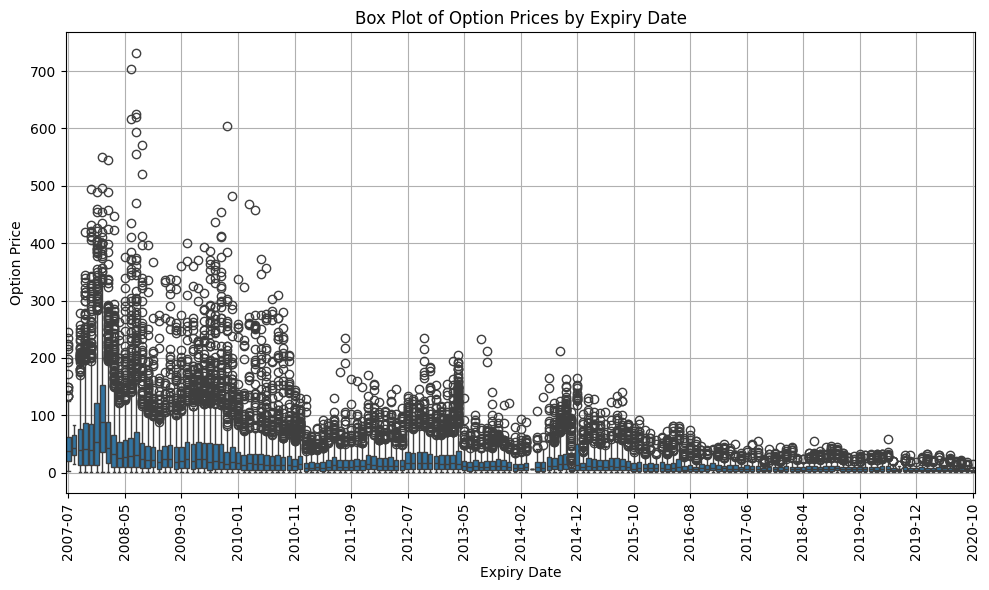

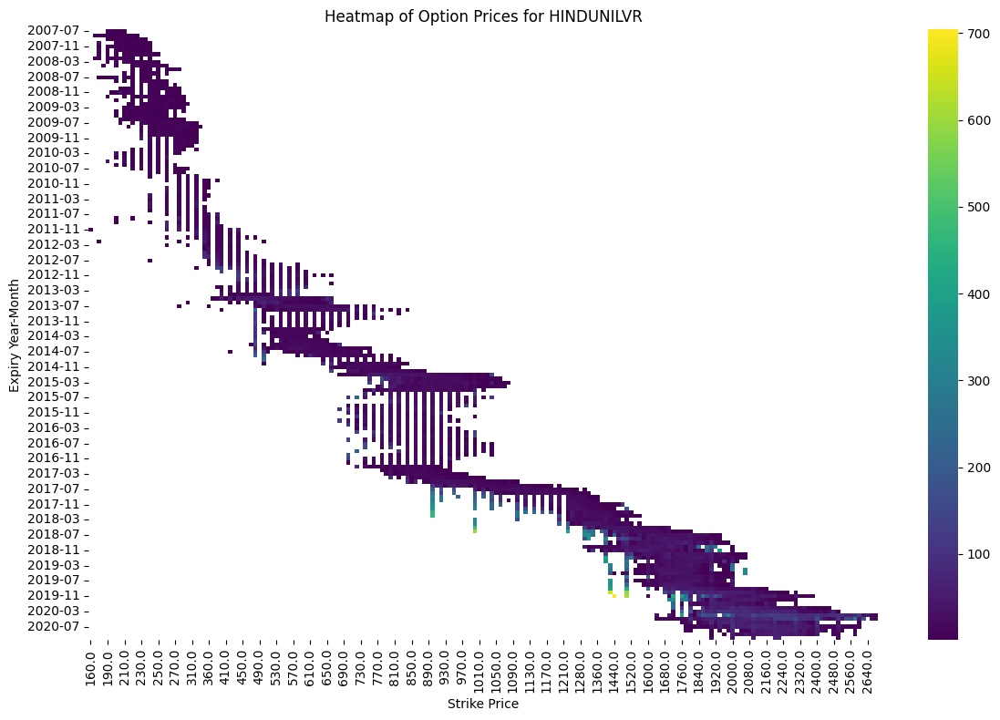

No data available for INF. Skipping...


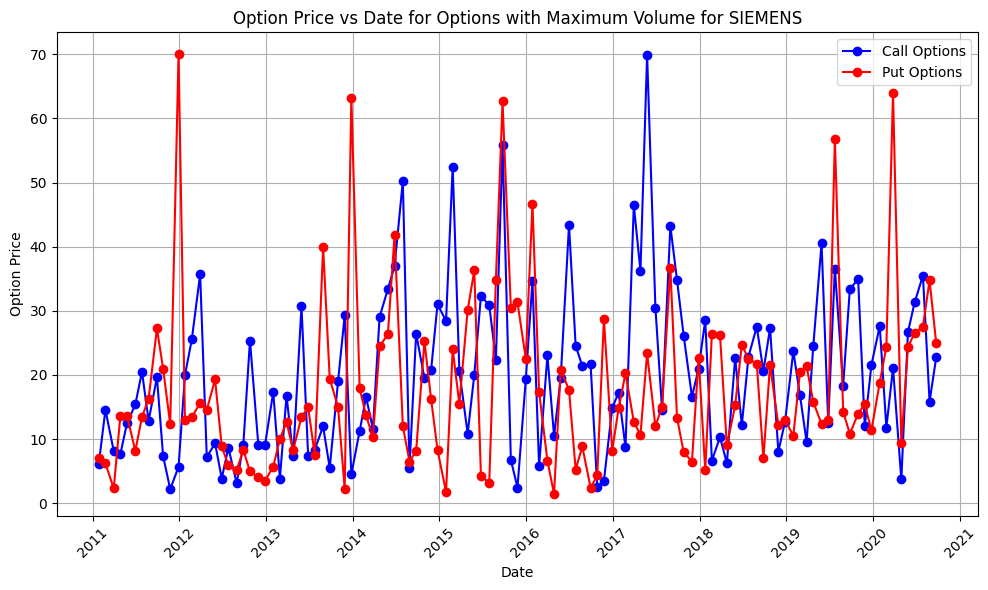

<Figure size 1000x600 with 0 Axes>

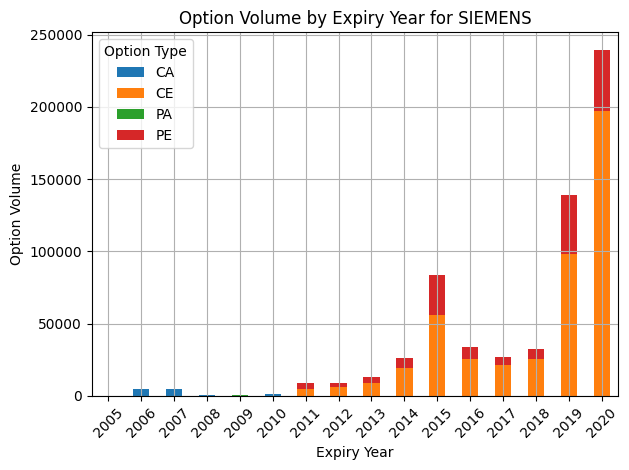

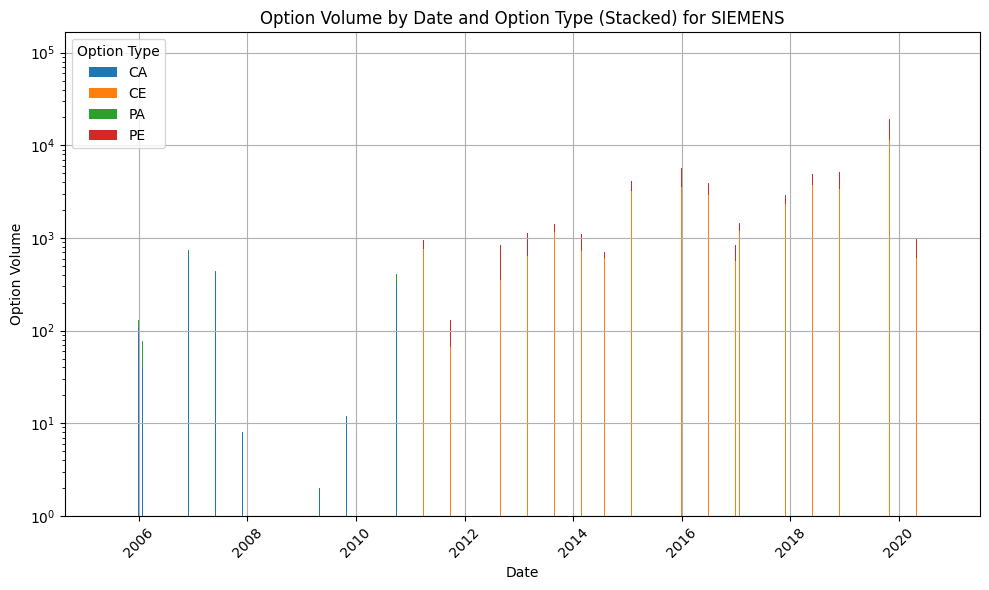

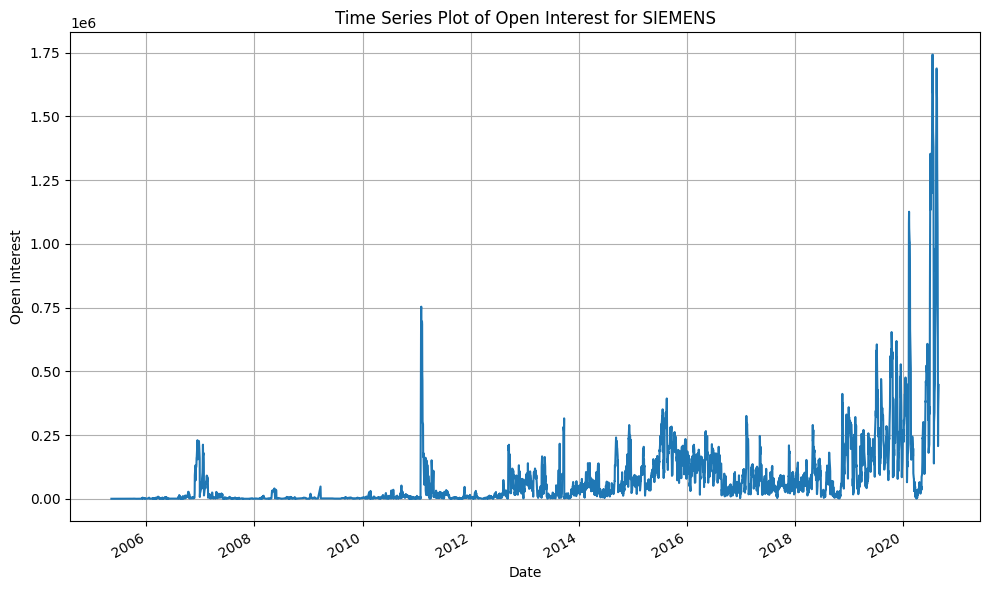

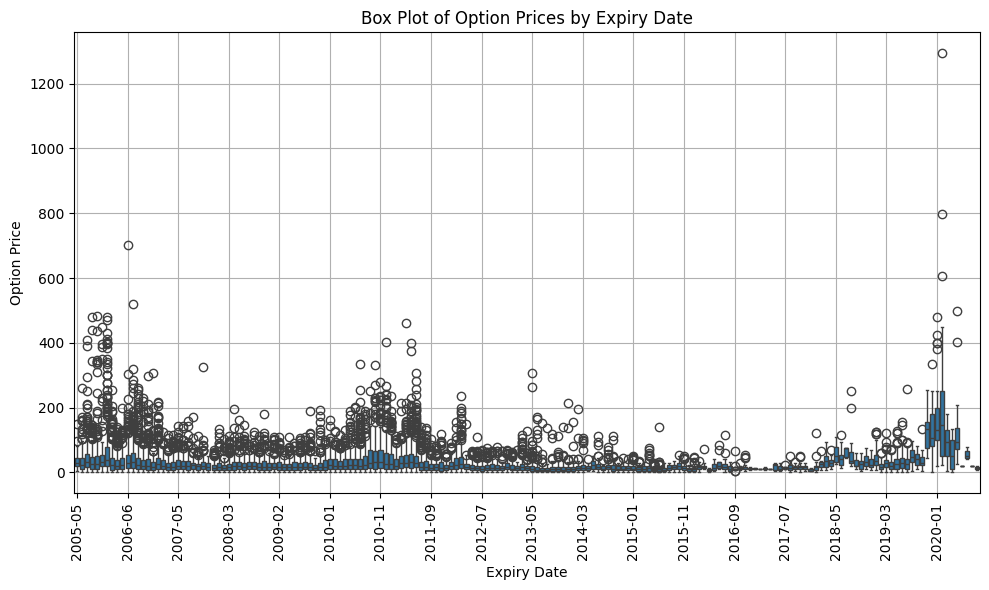

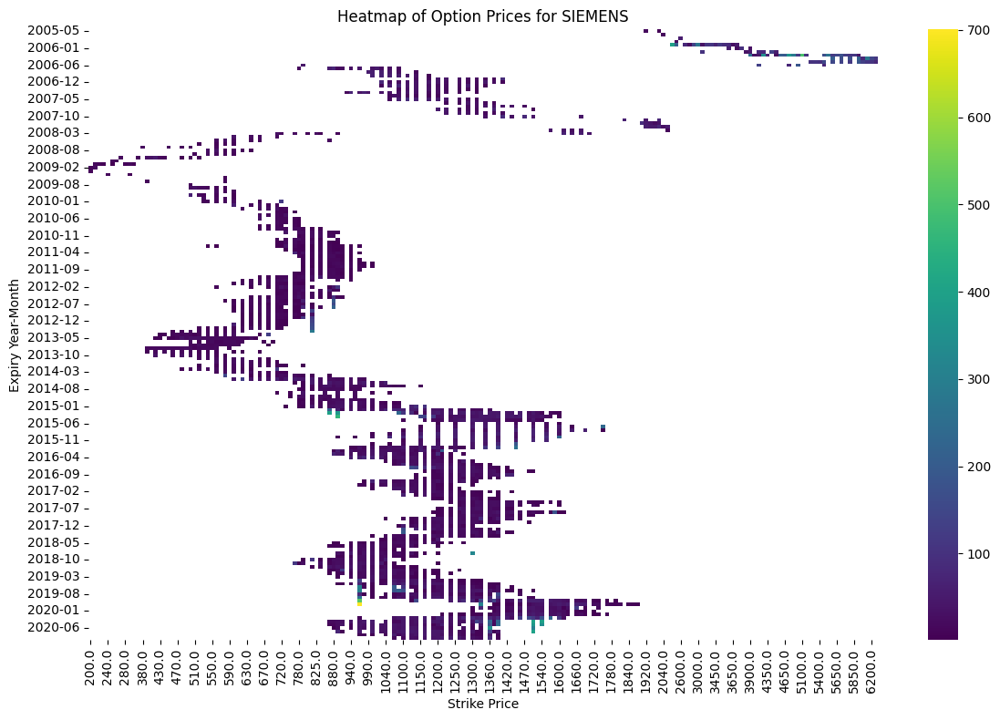

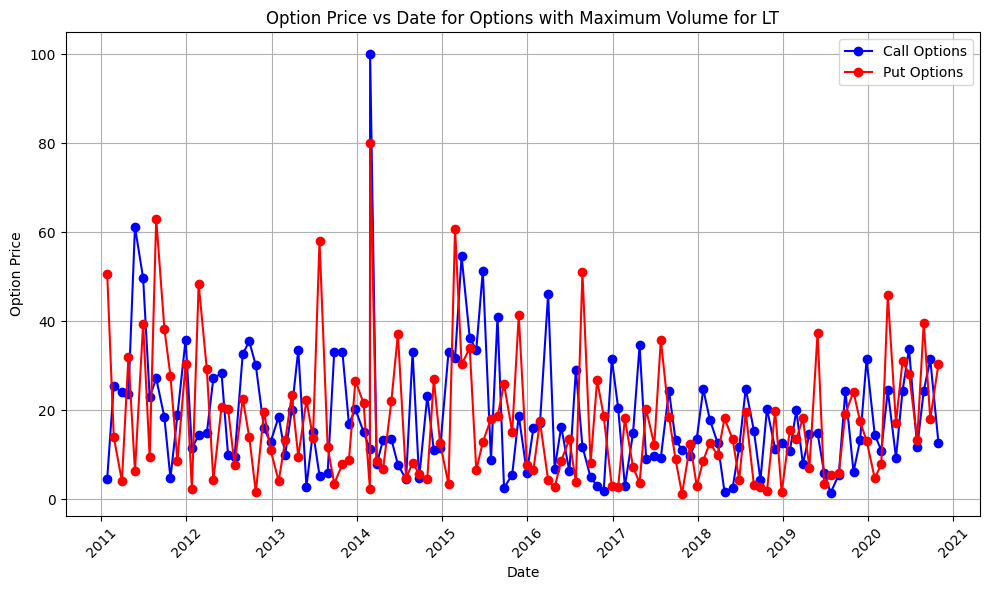

<Figure size 1000x600 with 0 Axes>

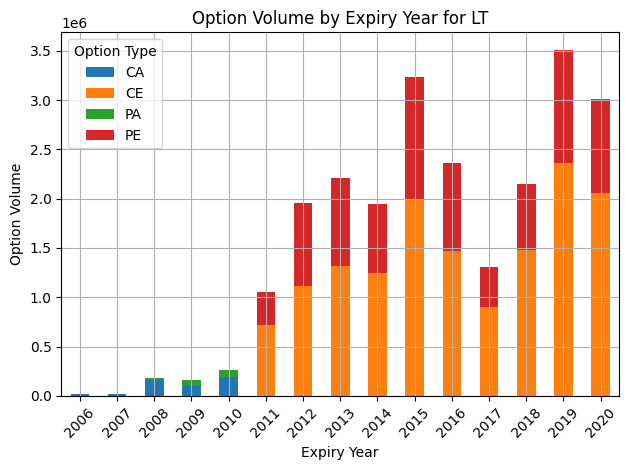

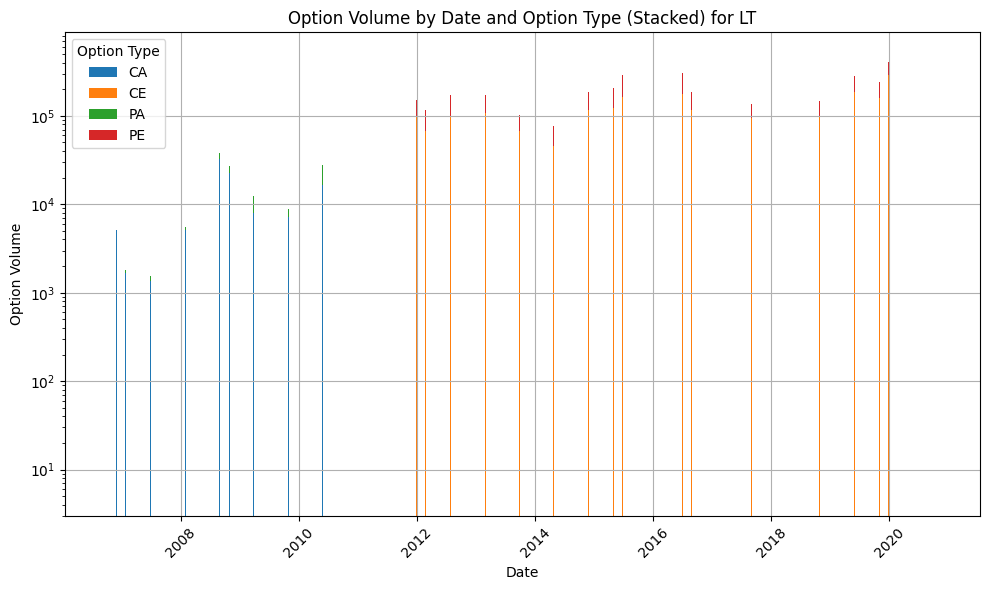

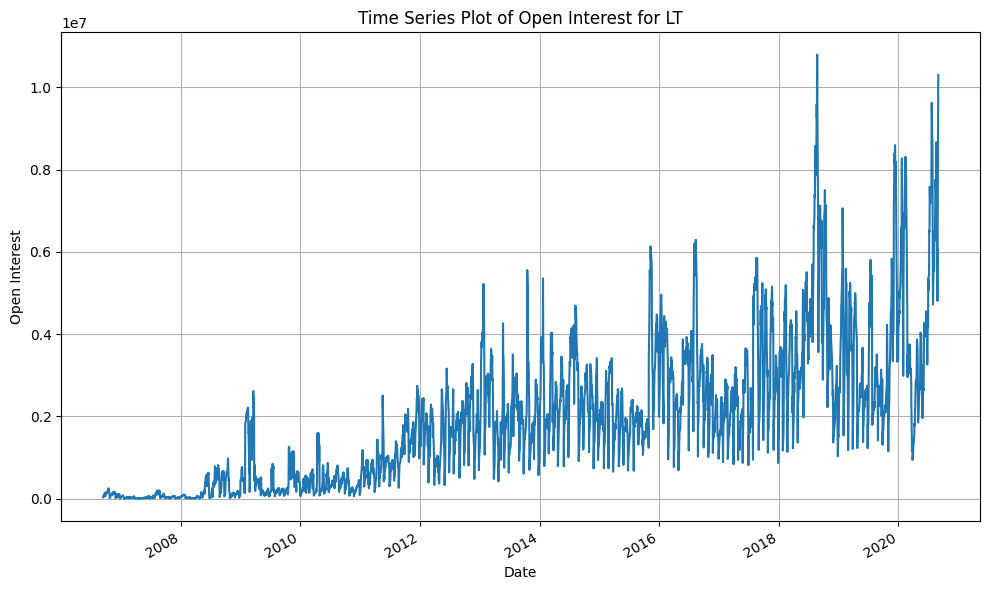

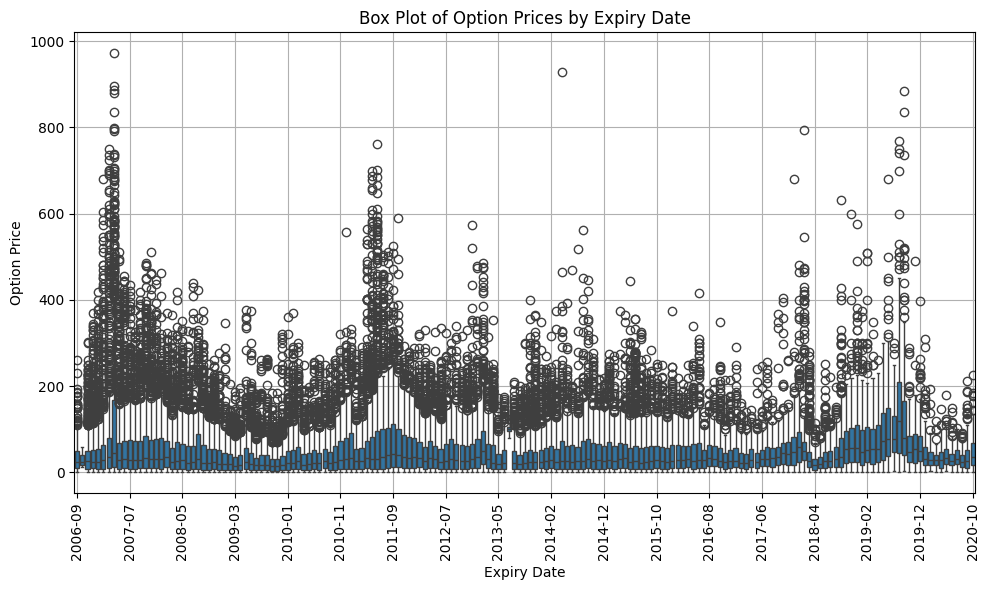

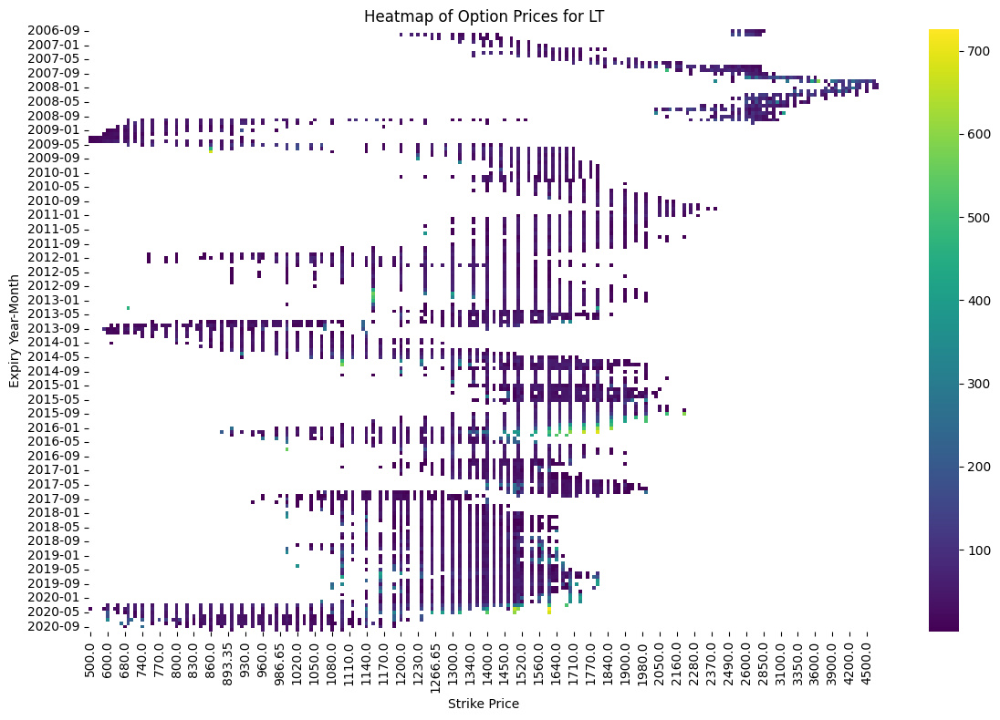

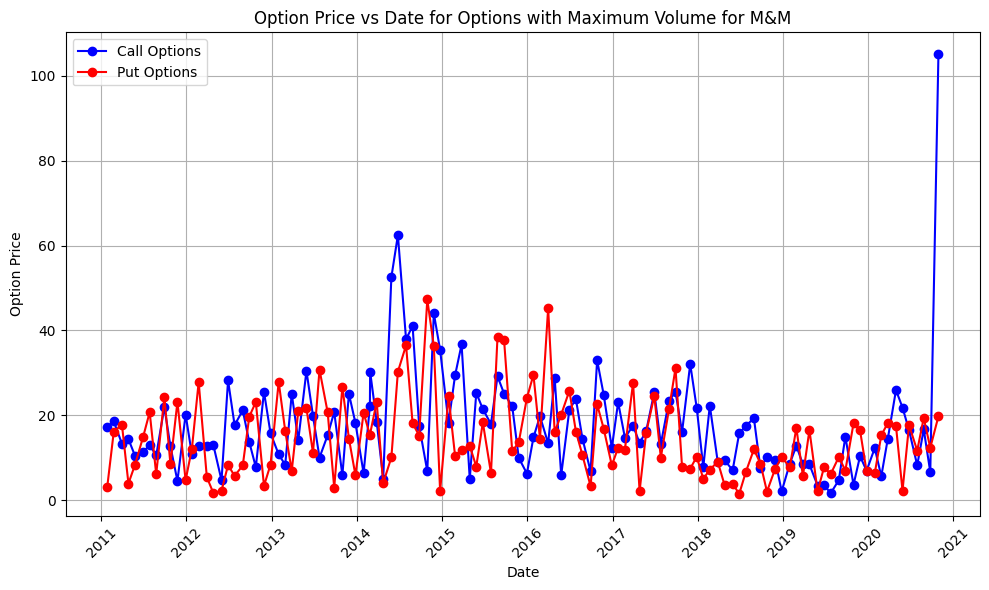

<Figure size 1000x600 with 0 Axes>

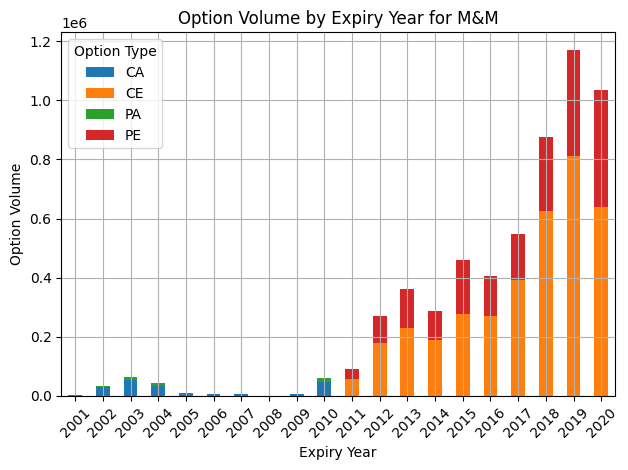

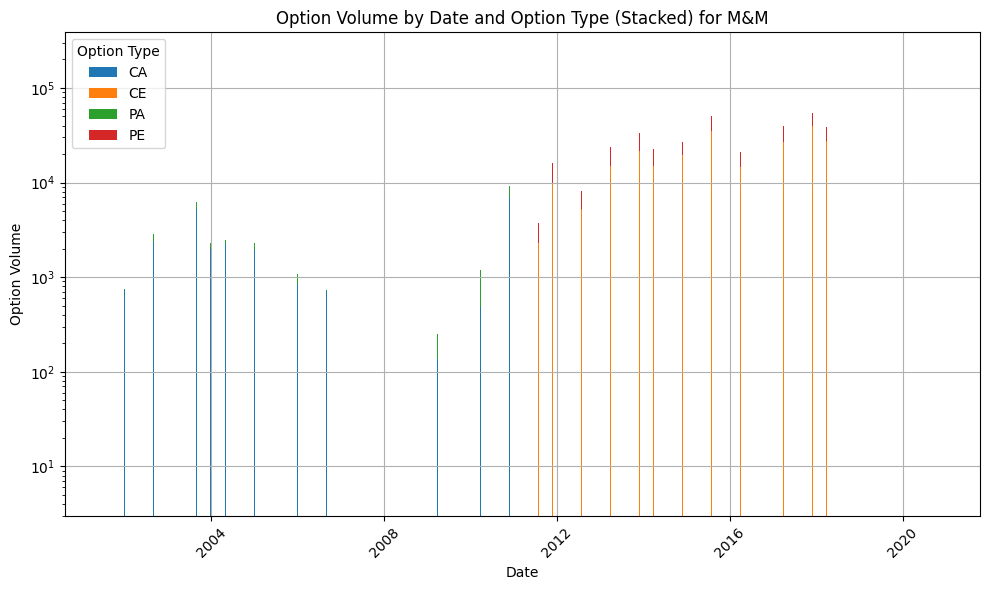

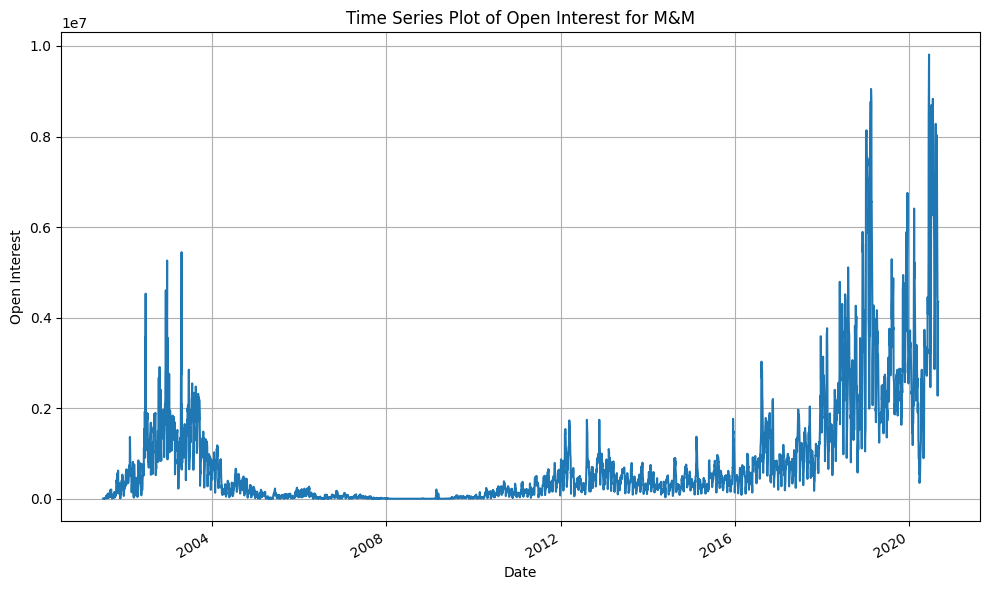

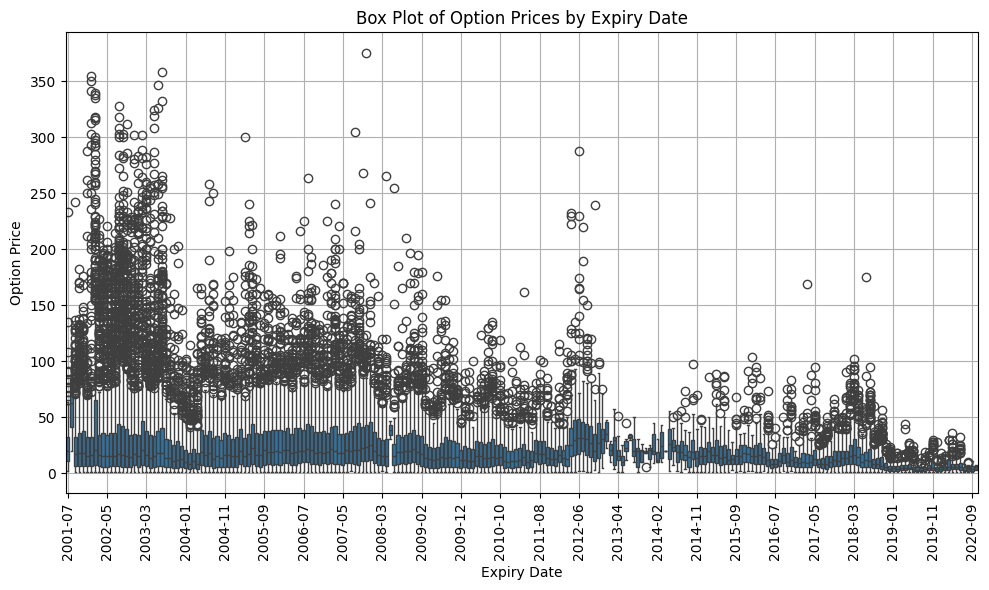

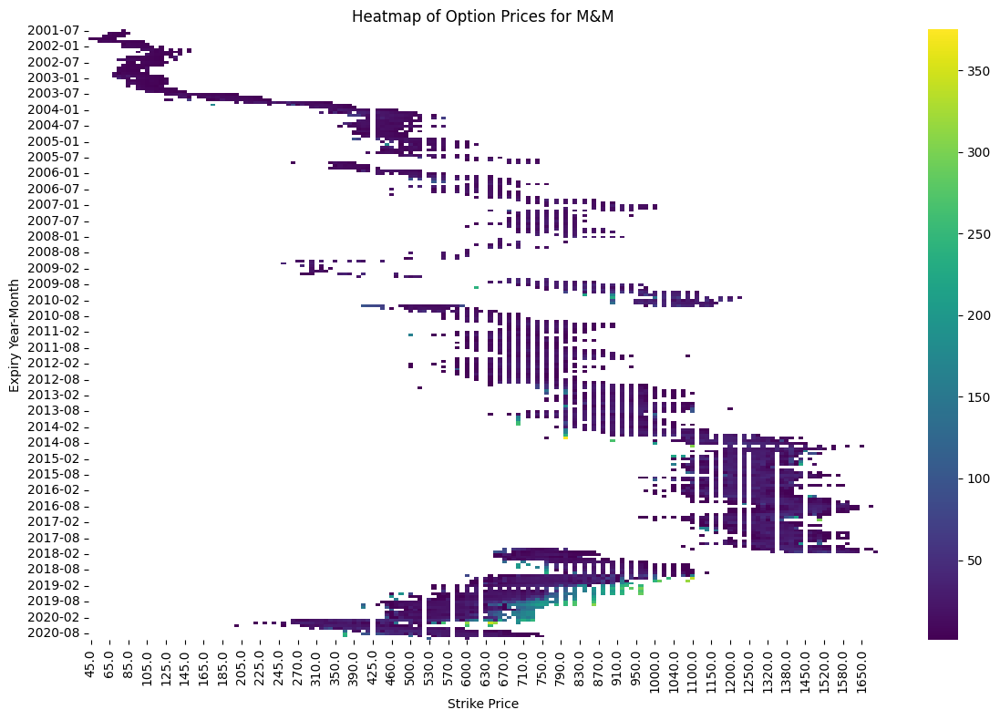

No data available for ADANIGREEN. Skipping...


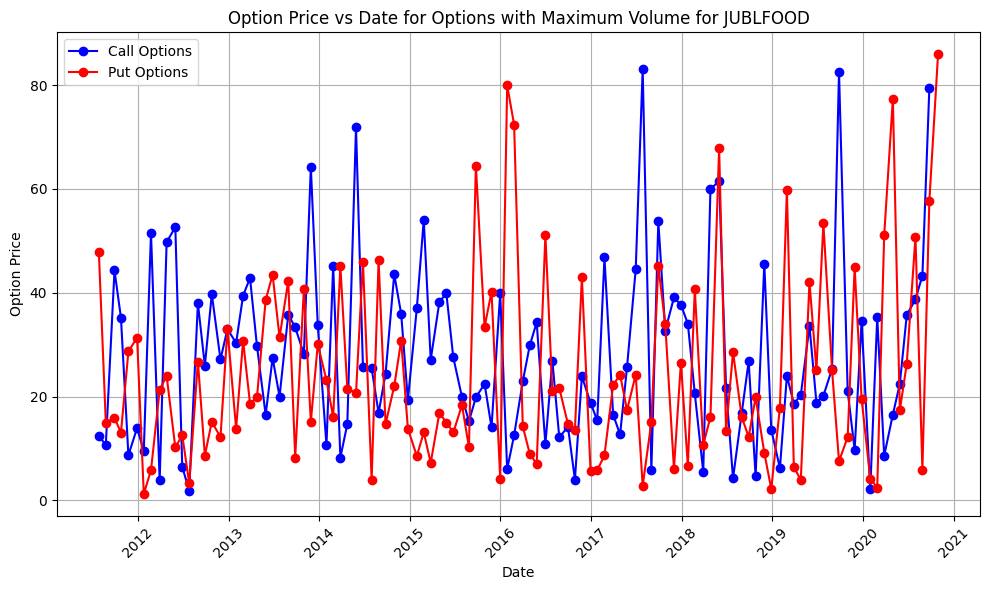

<Figure size 1000x600 with 0 Axes>

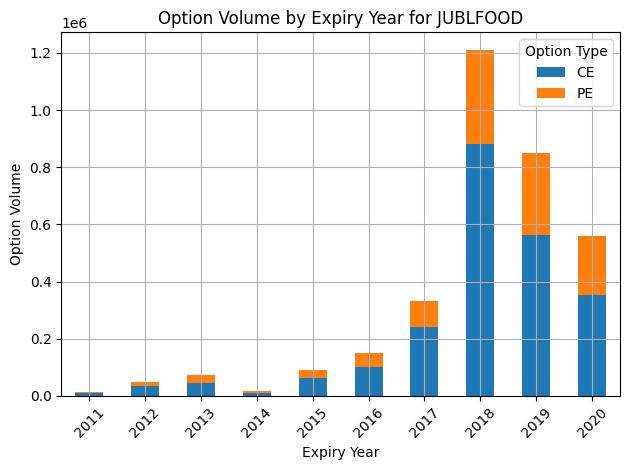

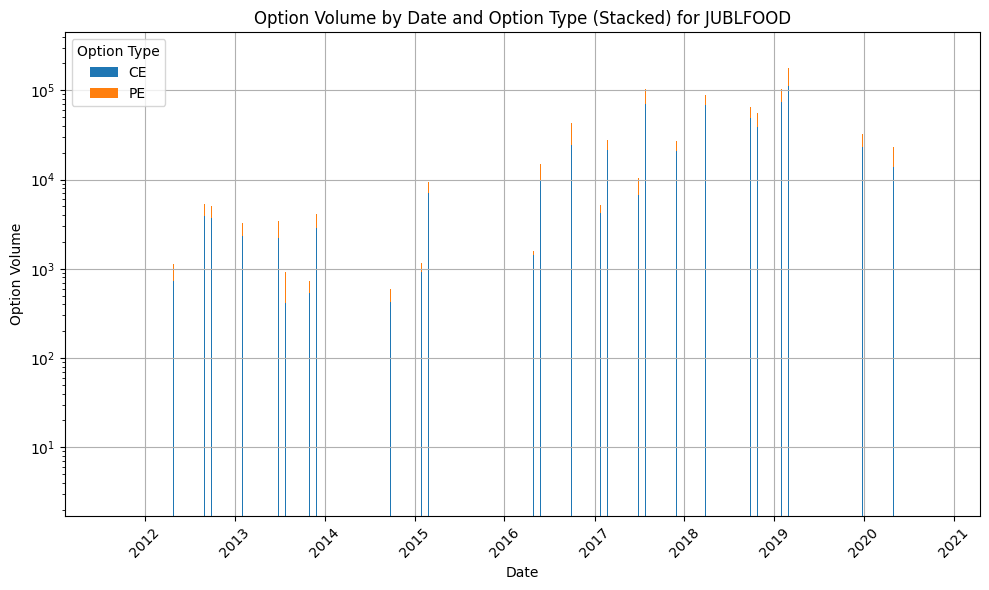

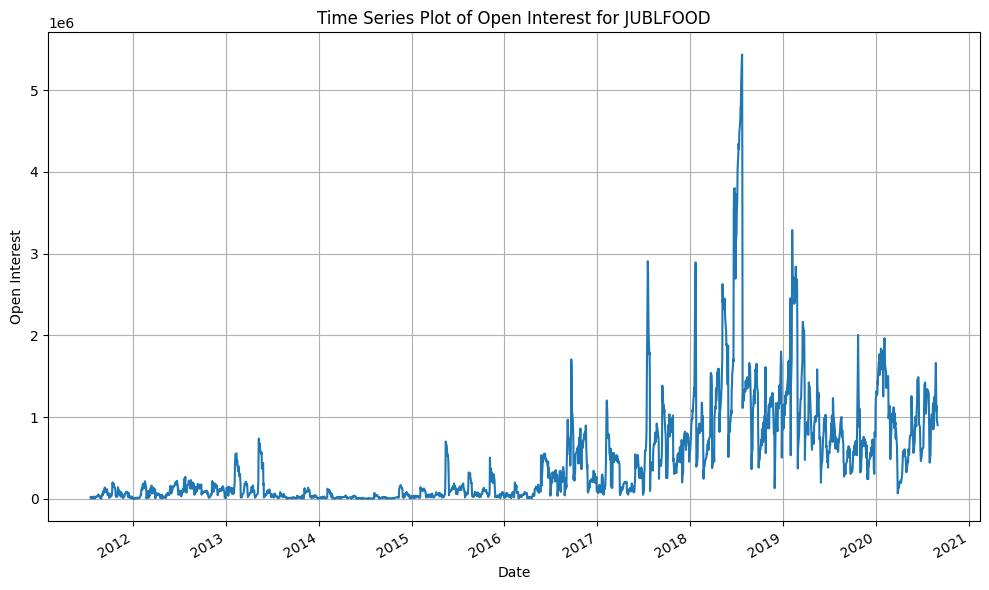

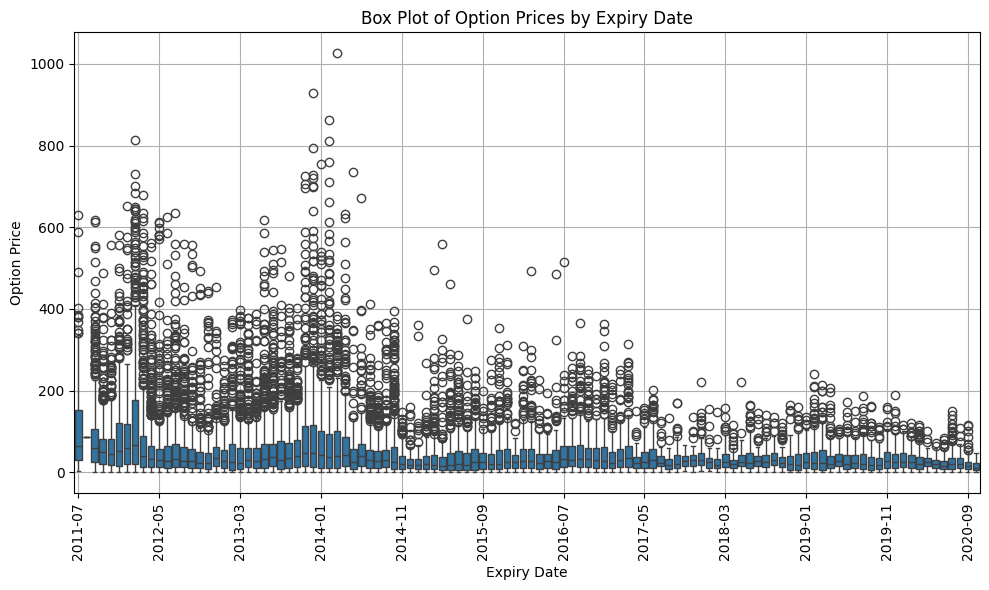

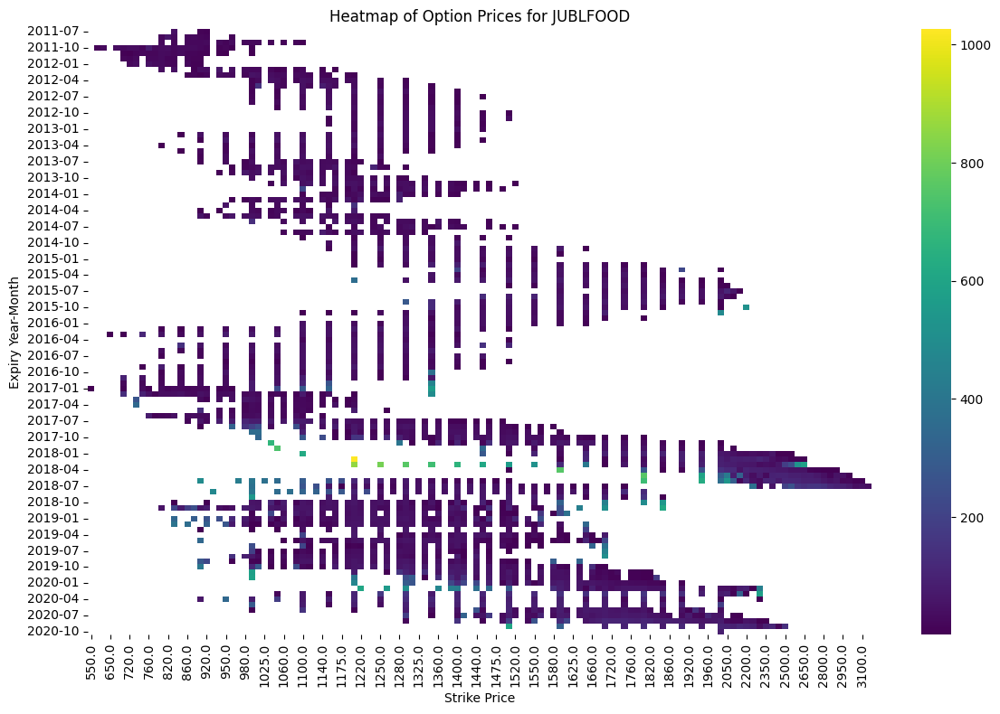

No data available for ADANITRANS. Skipping...


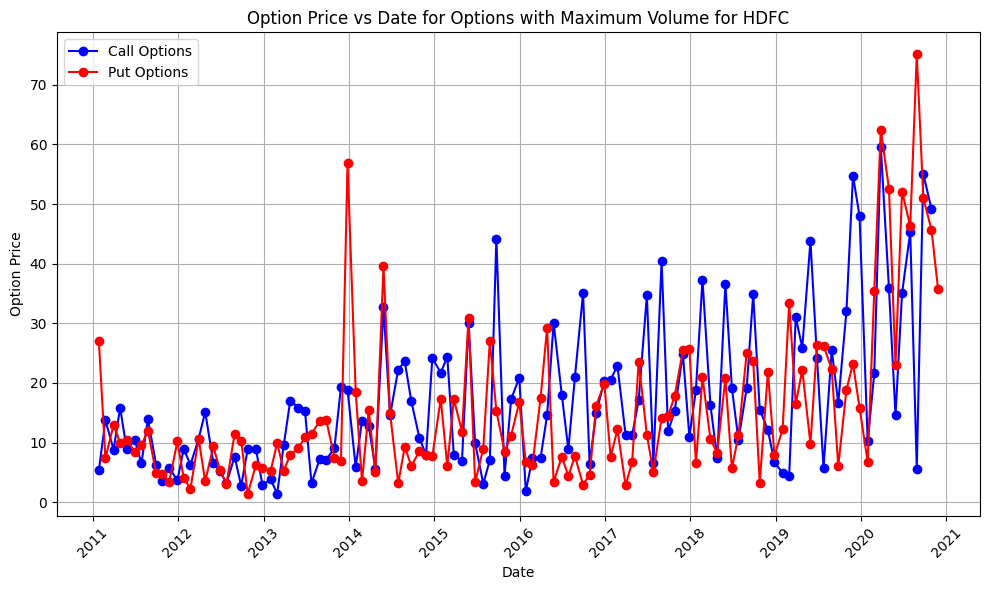

<Figure size 1000x600 with 0 Axes>

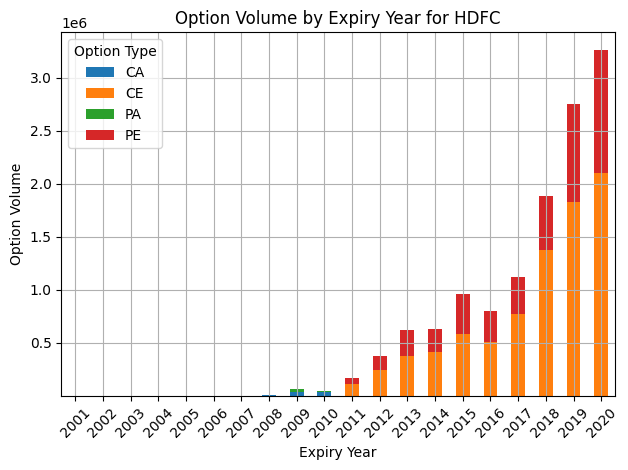

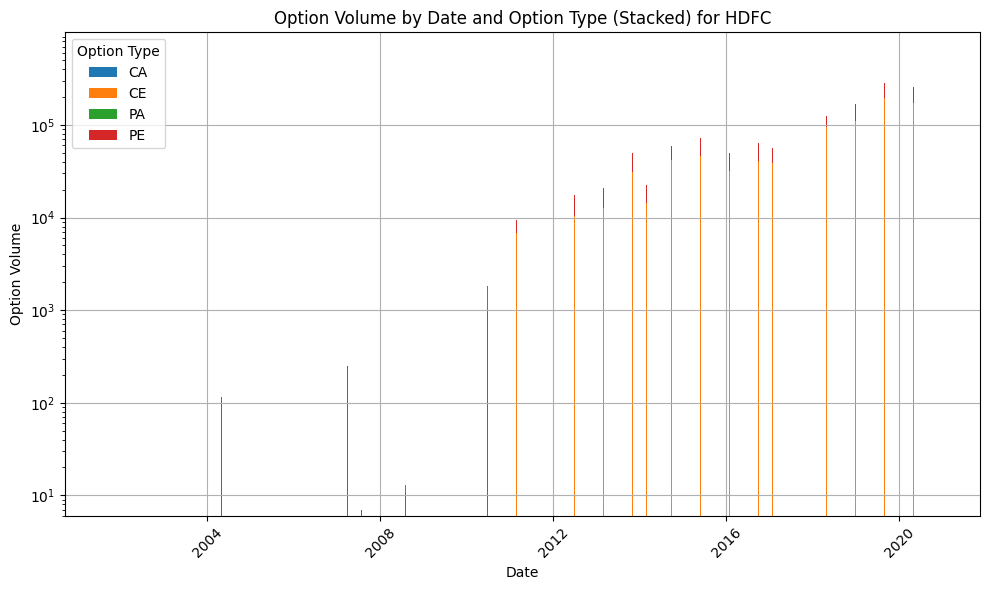

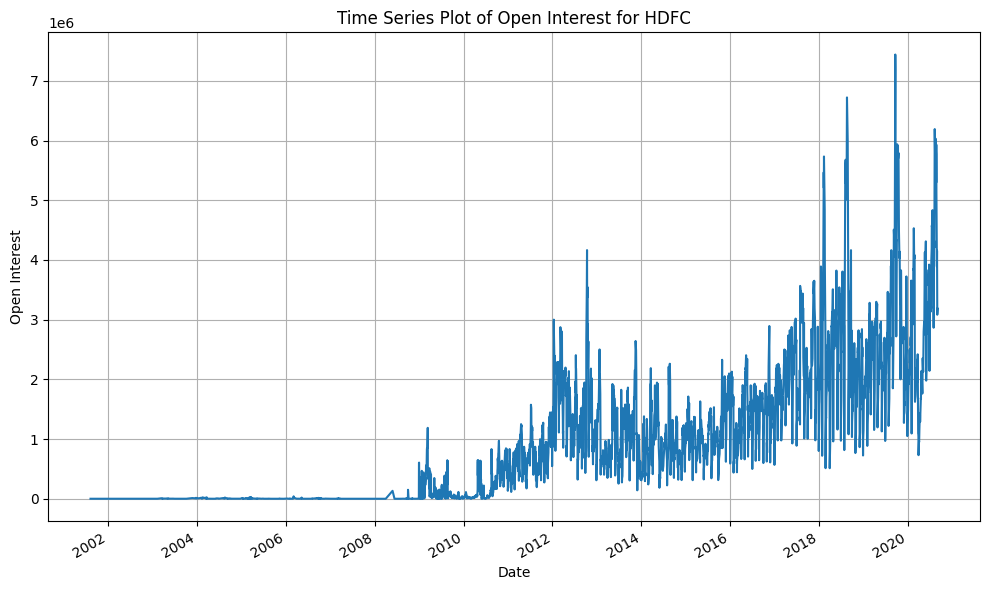

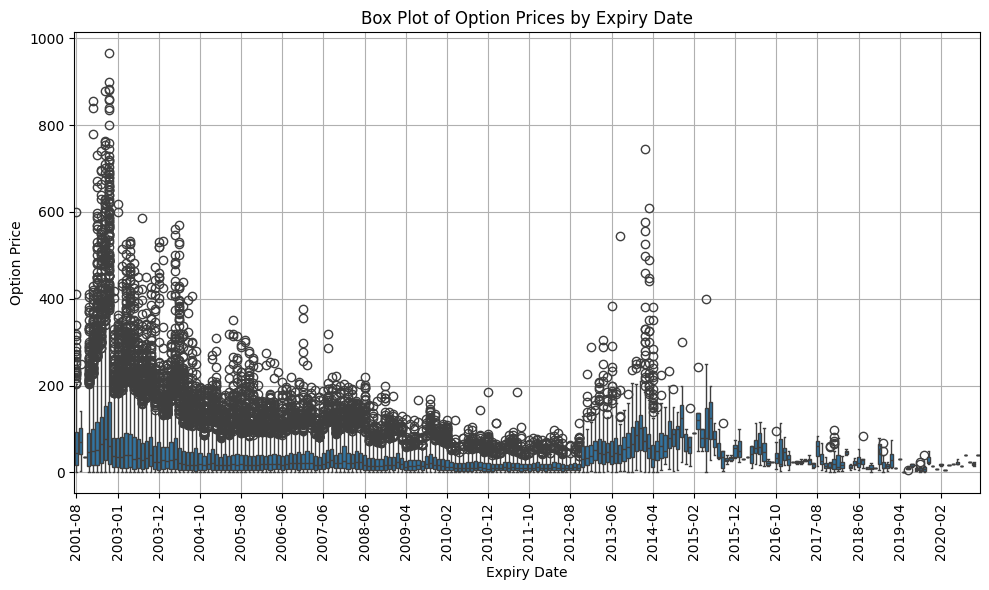

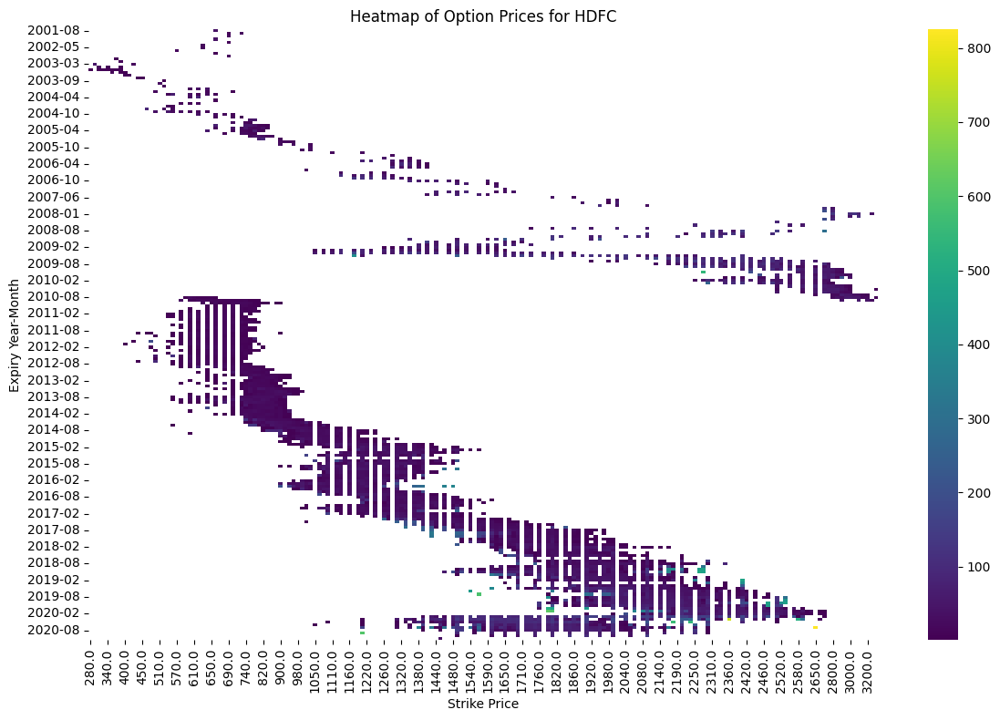

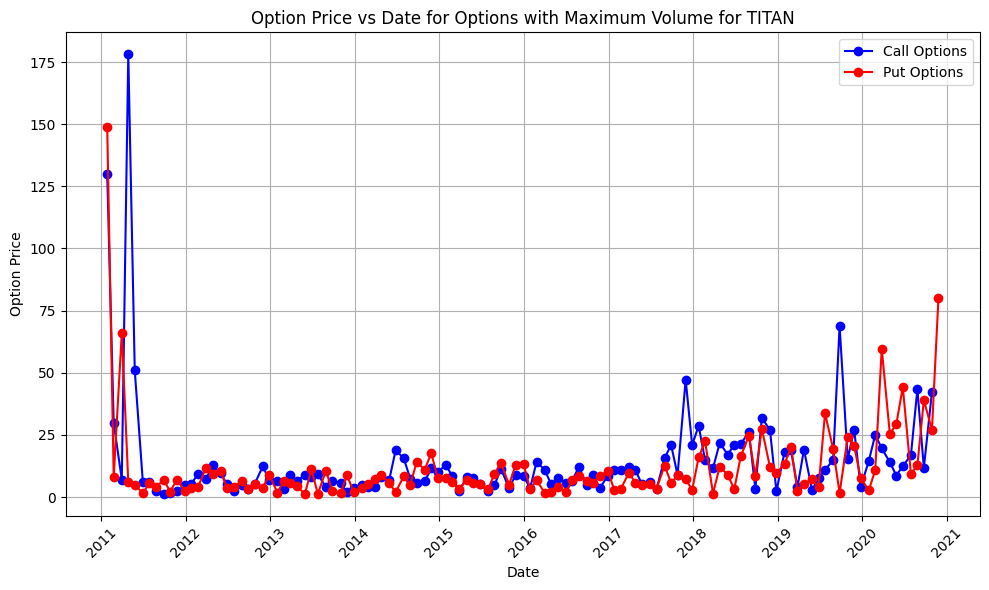

<Figure size 1000x600 with 0 Axes>

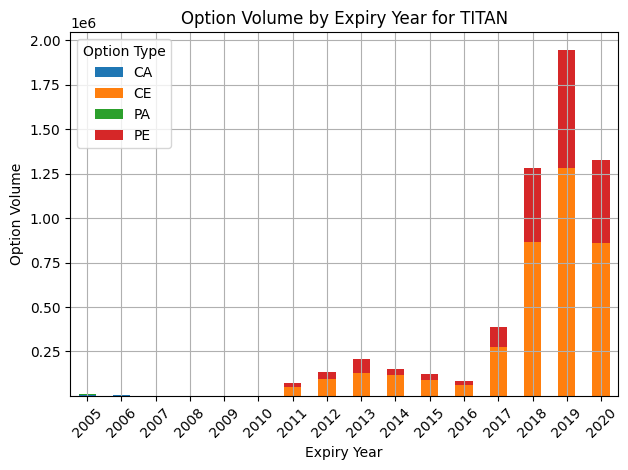

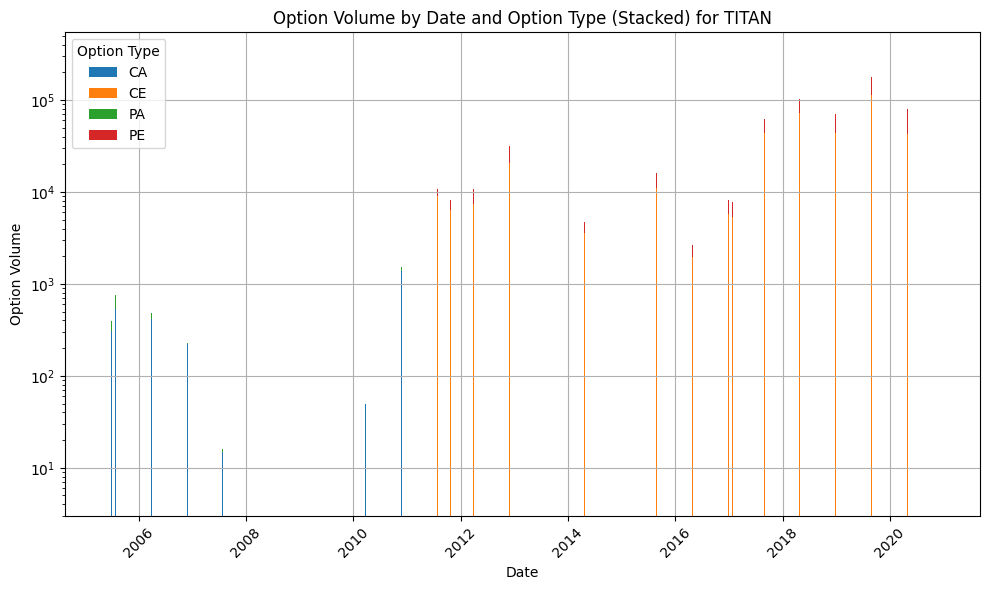

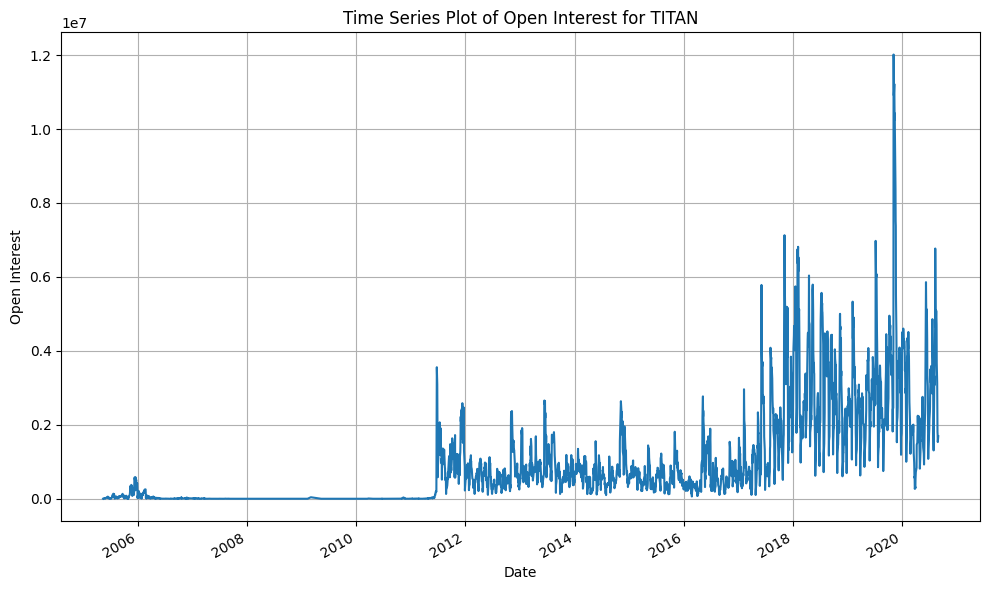

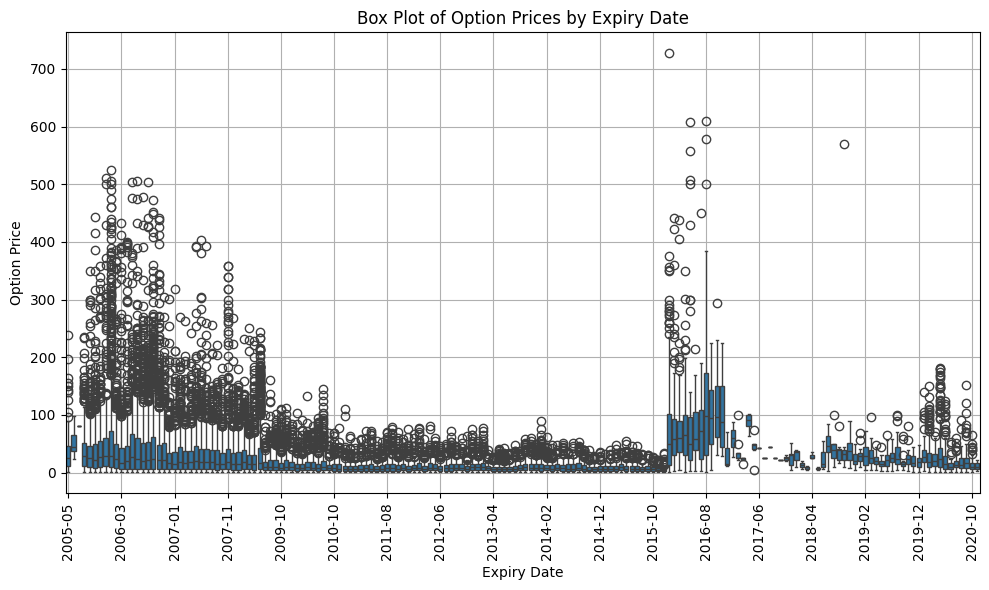

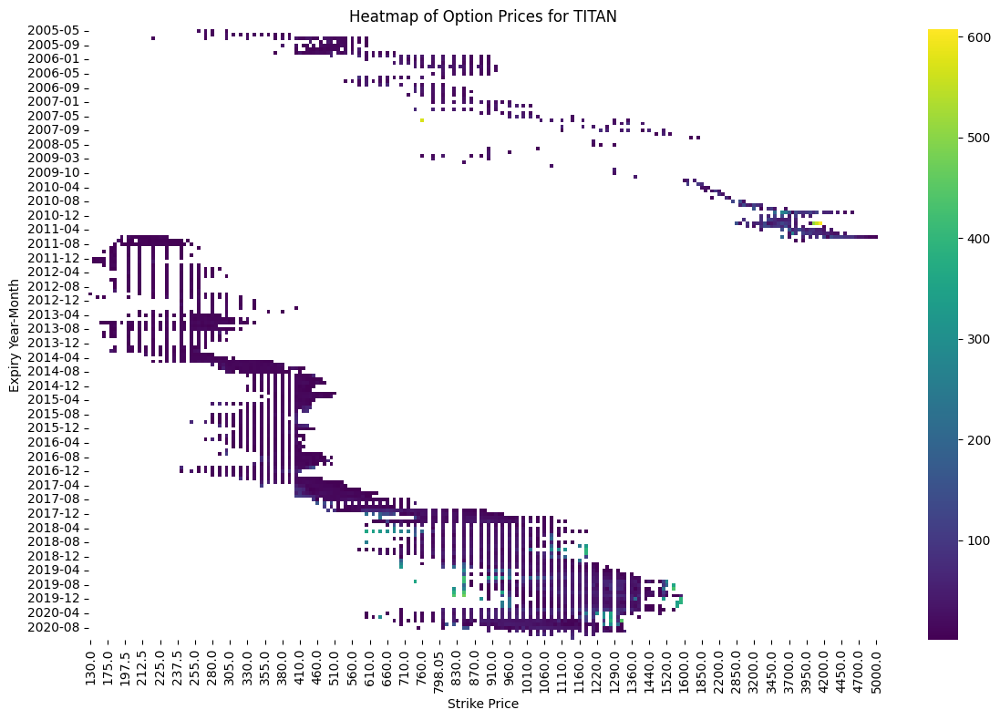

No data available for PIIND. Skipping...


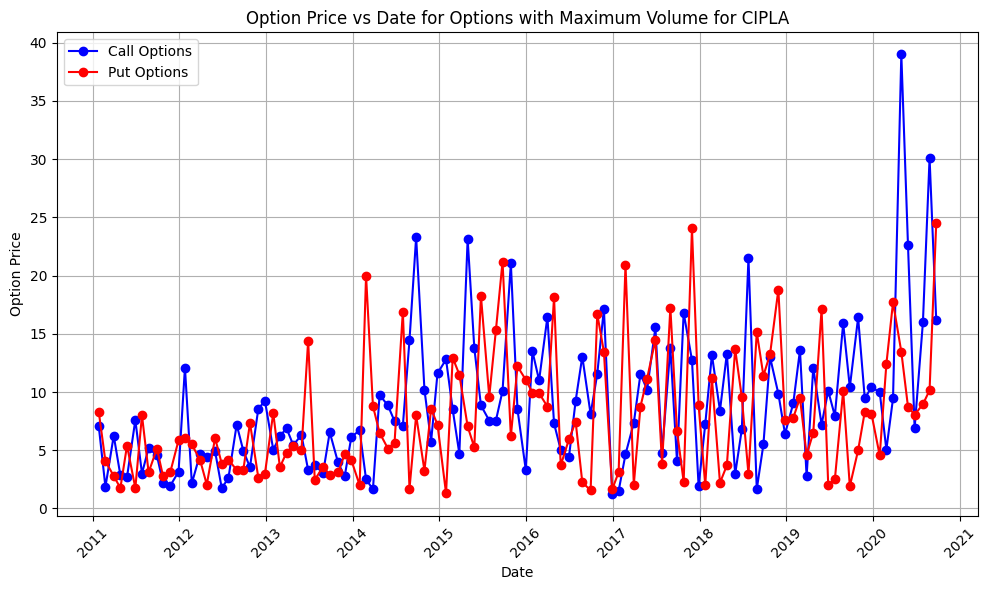

<Figure size 1000x600 with 0 Axes>

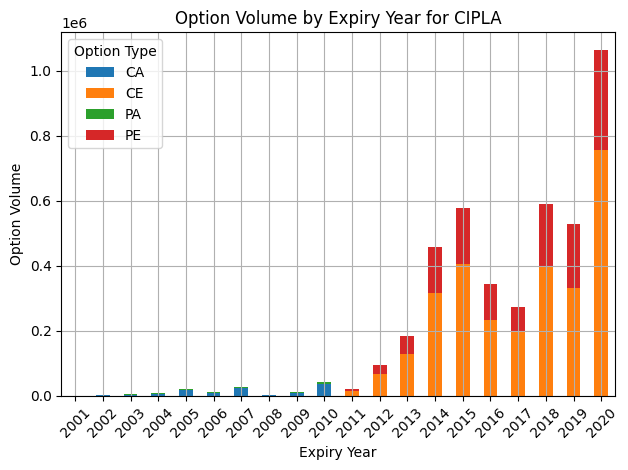

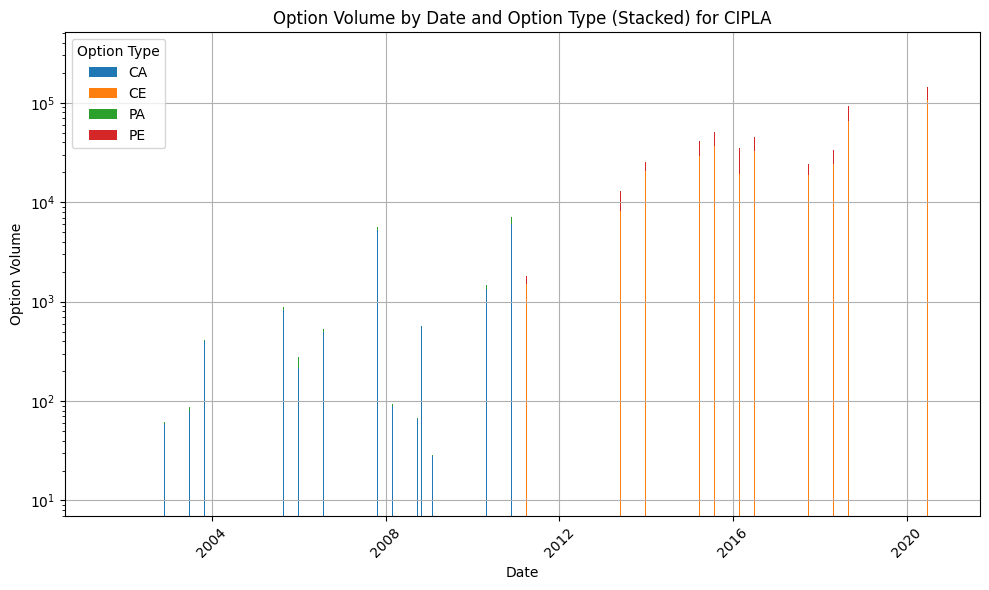

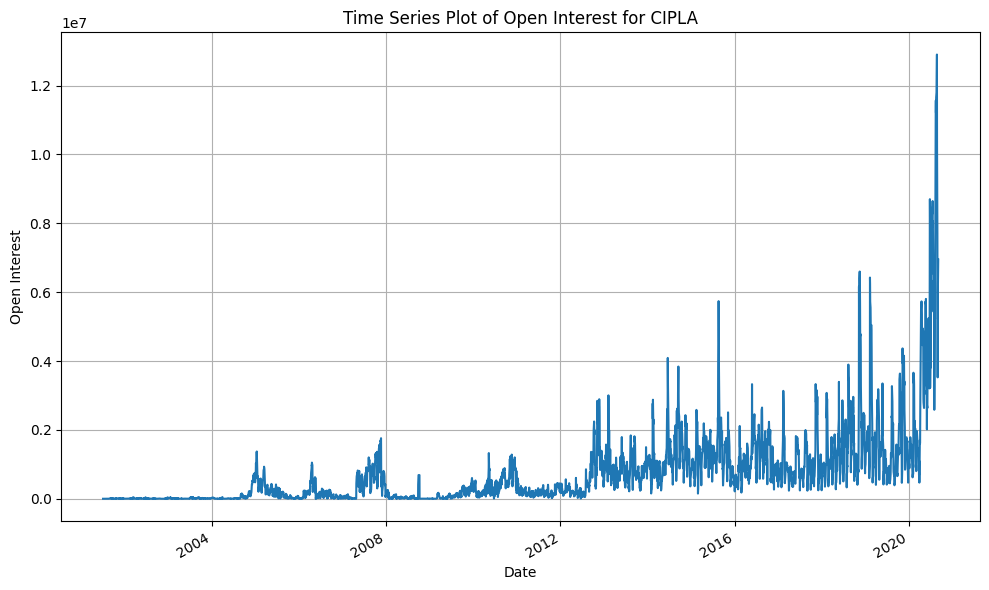

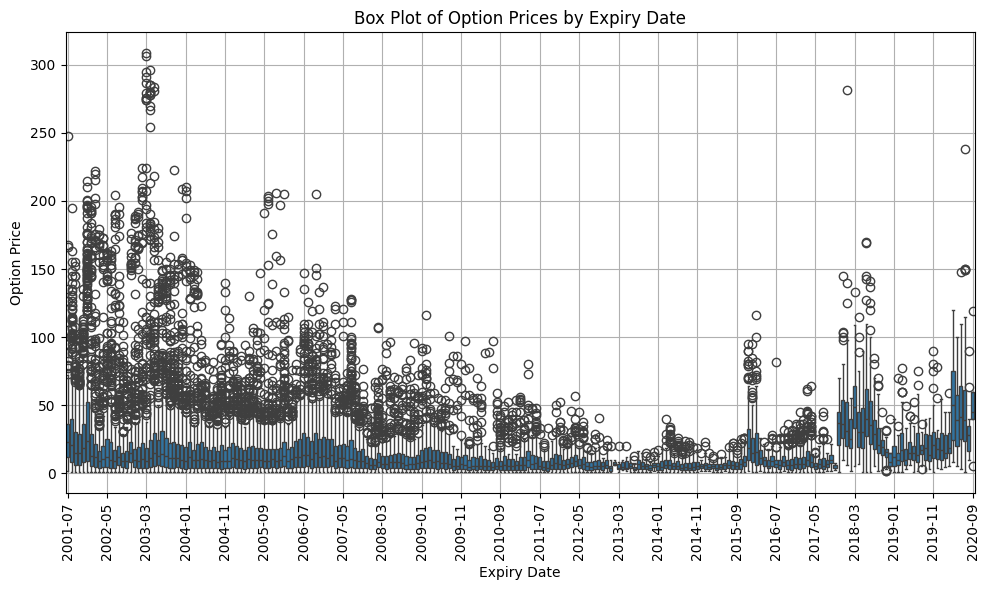

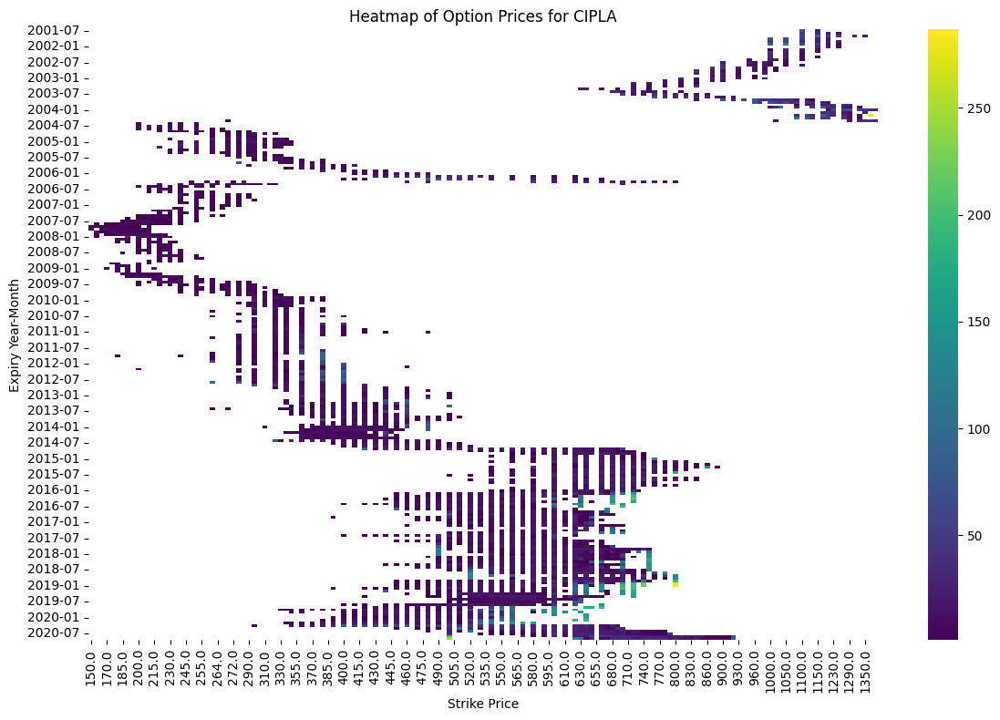

In [36]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Directory containing CSV files
folder_path = '/content/options'

# Get a list of all files in the folder
files = os.listdir(folder_path)

# Filter out CSV files
csv_files = [file for file in files if file.endswith('.csv')]

# Loop through each CSV file
for csv_file in csv_files:
    # Read CSV file
    df = pd.read_csv(os.path.join(folder_path, csv_file))

    # Extract company name from file name
    company_name = os.path.splitext(csv_file)[0].replace('_option', '')

    if df.empty:
        print(f"No data available for {company_name}. Skipping...")
        continue

    # Convert EXPIRY_DT column to datetime format
    df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])

    # Plot 1: Option Price vs Date for Options with Maximum Volume
    plt.figure(figsize=(10, 6))
    call_options = df[df['OPTION_TYP'] == 'CE']
    put_options = df[df['OPTION_TYP'] == 'PE']
    max_volume_call = call_options.loc[call_options.groupby('EXPIRY_DT')['CONTRACTS'].idxmax()]
    max_volume_put = put_options.loc[put_options.groupby('EXPIRY_DT')['CONTRACTS'].idxmax()]
    plt.plot(max_volume_call['EXPIRY_DT'], max_volume_call['CLOSE'], marker='o', linestyle='-', color='blue', label='Call Options')
    plt.plot(max_volume_put['EXPIRY_DT'], max_volume_put['CLOSE'], marker='o', linestyle='-', color='red', label='Put Options')
    plt.xlabel('Date')
    plt.ylabel('Option Price')
    plt.title(f'Option Price vs Date for Options with Maximum Volume for {company_name}')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'graphs/max_volume_option_price_{company_name}.png')
    plt.show()

    # Plot 2: Grouped Bar Plot of Option Volume by Expiry Year
    plt.figure(figsize=(10, 6))
    df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])
    grouped_data = df.groupby([df['EXPIRY_DT'].dt.year, 'OPTION_TYP'])['CONTRACTS'].sum().unstack().fillna(0)
    grouped_data.plot(kind='bar', stacked=True)
    plt.xlabel('Expiry Year')
    plt.ylabel('Option Volume')
    plt.title(f'Option Volume by Expiry Year for {company_name}')
    plt.xticks(rotation=45)
    plt.legend(title='Option Type')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'graphs/grouped_bar_option_volume_{company_name}.png')
    plt.show()

    # Plot 3: Stacked Bar Plot of Option Volume by Expiry Date
    plt.figure(figsize=(10, 6))
    grouped_data = df.groupby(['EXPIRY_DT', 'OPTION_TYP'])['CONTRACTS'].sum().unstack().fillna(0)
    bottom = None
    for option_type in grouped_data.columns:
        plt.bar(grouped_data.index, grouped_data[option_type], label=option_type, bottom=bottom)
        if bottom is None:
            bottom = grouped_data[option_type]
        else:
            bottom += grouped_data[option_type]
    plt.xlabel('Date')
    plt.ylabel('Option Volume')
    plt.title(f'Option Volume by Date and Option Type (Stacked) for {company_name}')
    plt.legend(title='Option Type')
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'graphs/stacked_bar_option_volume_{company_name}.png')
    plt.show()

    # Plot 4: Time Series Plot of Open Interest
    plt.figure(figsize=(10, 6))
    df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])
    df.groupby('TIMESTAMP')['OPEN_INT'].sum().plot()
    plt.xlabel('Date')
    plt.ylabel('Open Interest')
    plt.title(f'Time Series Plot of Open Interest for {company_name}')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'graphs/time_series_open_interest_{company_name}.png')
    plt.show()


    # Plot 5: Box Plot of Option Prices by Expiry Date
    # Group the data by EXPIRY_DT and calculate the median option price for each expiry date
    grouped_data = df.groupby('EXPIRY_DT')['CLOSE'].median().reset_index()

    # Plot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='EXPIRY_DT', y='CLOSE', data=df)
    plt.xlabel('Expiry Date')
    plt.ylabel('Option Price')
    plt.title('Box Plot of Option Prices by Expiry Date')
    plt.xticks(rotation=90)

    # Customize x-axis ticks to display every n-th date
    n = 10  # Display every 30th date
    plt.xticks(range(0, len(grouped_data), n), grouped_data['EXPIRY_DT'].dt.strftime('%Y-%m').iloc[::n])

    plt.grid(True)
    plt.tight_layout()
    plt.show()
    # Plot 6: Heatmap of Option Prices

    df['Year_Month'] = df['EXPIRY_DT'].dt.to_period('M')

    plt.figure(figsize=(12, 8))
    sns.heatmap(df.pivot_table(index='Year_Month', columns='STRIKE_PR', values='CLOSE', aggfunc='mean'), cmap='viridis')
    plt.xlabel('Strike Price')
    plt.ylabel('Expiry Year-Month')
    plt.title(f'Heatmap of Option Prices for {company_name}')
    plt.tight_layout()
    plt.savefig(f'graphs/heatmap_{company_name}.png')
    plt.show()


  adding: options/ (stored 0%)
  adding: options/TATASTEEL_option.csv (deflated 79%)
  adding: options/HDFCBANK_option.csv (deflated 79%)
  adding: options/JSWSTEEL_option.csv (deflated 80%)
  adding: options/NAUKRI_option.csv (deflated 79%)
  adding: options/HEROMOTOCO_option.csv (deflated 79%)
  adding: options/NESTIND_option.csv (deflated 20%)
  adding: options/TCS_option.csv (deflated 78%)
  adding: options/DLF_option.csv (deflated 78%)
  adding: options/INIDGO_option.csv (deflated 20%)
  adding: options/ULTRACEMCO_option.csv (deflated 80%)
  adding: options/PIDILITIND_option.csv (deflated 81%)
  adding: options/SUNPHARMA_option.csv (deflated 79%)
  adding: options/BHARATIARTL_option.csv (deflated 20%)
  adding: options/HINDUNILVR_option.csv (deflated 80%)
  adding: options/INF_option.csv (deflated 20%)
  adding: options/.ipynb_checkpoints/ (stored 0%)
  adding: options/SIEMENS_option.csv (deflated 81%)
  adding: options/LT_option.csv (deflated 77%)
  adding: options/M&M_option.csv

Epoch 1/50
21/21 - 13s - loss: 0.9639 - val_loss: 0.8571 - 13s/epoch - 608ms/step
Epoch 2/50
21/21 - 0s - loss: 0.6989 - val_loss: 0.3574 - 200ms/epoch - 10ms/step
Epoch 3/50
21/21 - 0s - loss: 0.1688 - val_loss: 0.0824 - 176ms/epoch - 8ms/step
Epoch 4/50
21/21 - 0s - loss: 0.0978 - val_loss: 0.0675 - 175ms/epoch - 8ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0853 - val_loss: 0.0471 - 370ms/epoch - 18ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0923 - val_loss: 0.0408 - 299ms/epoch - 14ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0722 - val_loss: 0.0370 - 267ms/epoch - 13ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0690 - val_loss: 0.0328 - 178ms/epoch - 8ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0543 - val_loss: 0.0307 - 180ms/epoch - 9ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0597 - val_loss: 0.0283 - 166ms/epoch - 8ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0758 - val_loss: 0.0235 - 183ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0417 - val_loss: 0.0207 - 177ms/epoch - 8ms/step
Epoch 13/50
21/21 - 

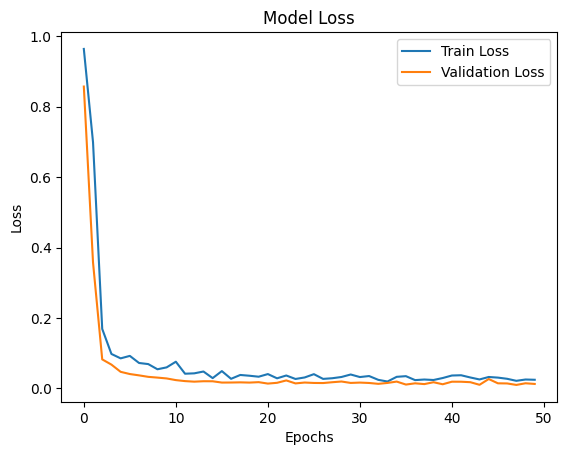

6/6 [==============================] - 2s 4ms/step


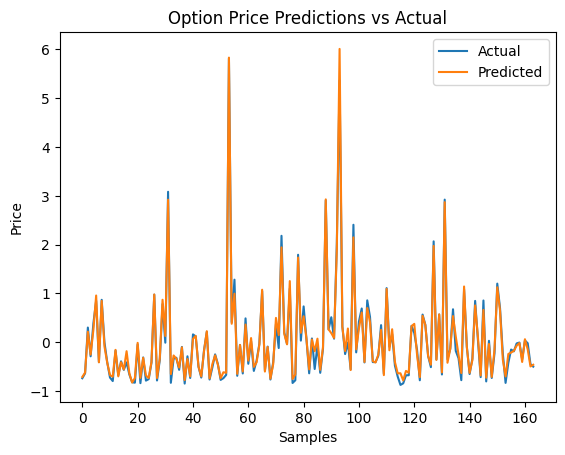

In [56]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv("options/NAUKRI_option.csv")

# Preprocessing
# Drop unnecessary columns
df = df.drop(columns=['Unnamed'])

# Convert 'EXPIRY_DT' and 'TIMESTAMP' to datetime objects
df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])
df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])

# Extract features from datetime columns
df['expiry_year'] = df['EXPIRY_DT'].dt.year
df['expiry_month'] = df['EXPIRY_DT'].dt.month
df['expiry_day'] = df['EXPIRY_DT'].dt.day
df['timestamp_year'] = df['TIMESTAMP'].dt.year
df['timestamp_month'] = df['TIMESTAMP'].dt.month
df['timestamp_day'] = df['TIMESTAMP'].dt.day

# Drop original datetime columns
df = df.drop(columns=['EXPIRY_DT', 'TIMESTAMP'])

# Encode categorical variables
df = pd.get_dummies(df, columns=['INSTRUMENT', 'SYMBOL', 'OPTION_TYP'])

# Normalize numerical features
numerical_cols = ['STRIKE_PR', 'OPEN', 'HIGH', 'LOW', 'CLOSE', 'SETTLE_PR', 'CONTRACTS', 'VAL_INLAKH', 'OPEN_INT', 'CHG_IN_OI',
                  'expiry_year', 'expiry_month', 'expiry_day', 'timestamp_year', 'timestamp_month', 'timestamp_day']
df[numerical_cols] = (df[numerical_cols] - df[numerical_cols].mean()) / df[numerical_cols].std()

# Split the data into train and test sets
X = df.drop(columns=['CLOSE'])  # Features
y = df['CLOSE']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data for LSTM
X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Build the LSTM model
model = Sequential([
    LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
    Dropout(0.2),
    LSTM(100, return_sequences=True),
    Dropout(0.2),
    LSTM(50),
    Dropout(0.2),
    Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=2)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Make predictions
y_pred = model.predict(X_test)

# Visualize predictions vs. actual values
plt.plot(y_test.values, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.title('Option Price Predictions vs Actual')
plt.xlabel('Samples')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/50
21/21 - 26s - loss: 0.9723 - val_loss: 0.8780 - 26s/epoch - 1s/step
Epoch 2/50
21/21 - 0s - loss: 0.7697 - val_loss: 0.4231 - 164ms/epoch - 8ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2443 - val_loss: 0.0962 - 167ms/epoch - 8ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1138 - val_loss: 0.0698 - 218ms/epoch - 10ms/step
Epoch 5/50
21/21 - 0s - loss: 0.1026 - val_loss: 0.0593 - 286ms/epoch - 14ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0887 - val_loss: 0.0481 - 262ms/epoch - 12ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0783 - val_loss: 0.0421 - 275ms/epoch - 13ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0614 - val_loss: 0.0377 - 238ms/epoch - 11ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0821 - val_loss: 0.0329 - 238ms/epoch - 11ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0664 - val_loss: 0.0286 - 254ms/epoch - 12ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0530 - val_loss: 0.0280 - 288ms/epoch - 14ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0780 - val_loss: 0.0270 - 288ms/epoch - 14ms/step
Epoch 13/50
21/21 

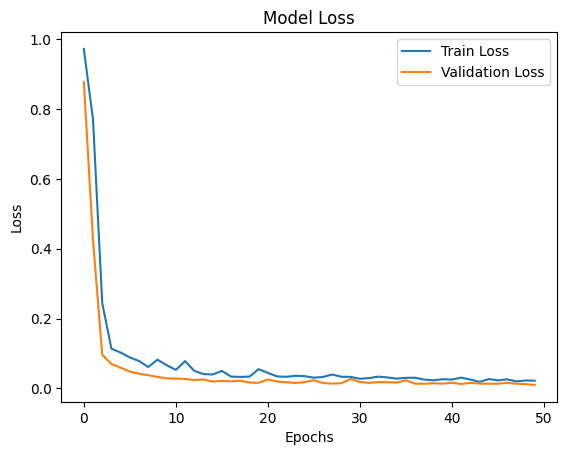

MSE (Train): 0.022068900987505913
MSE (Validation): 0.009875929914414883
6/6 [==============================] - 1s 5ms/step


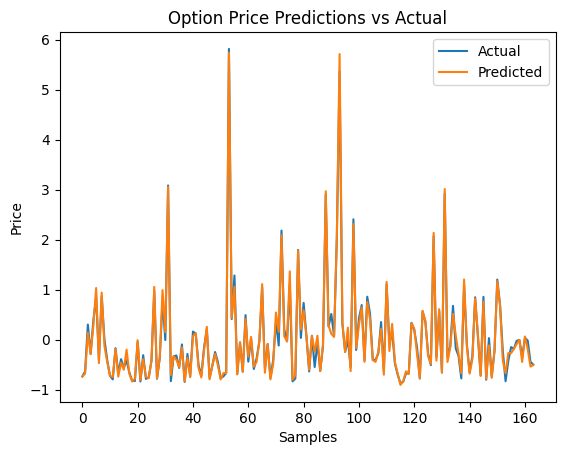

In [80]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Load the dataset
df = pd.read_csv("options/NAUKRI_option.csv")

# Preprocessing
# Drop unnecessary columns
df = df.drop(columns=['Unnamed'])

# Convert 'EXPIRY_DT' and 'TIMESTAMP' to datetime objects
df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])
df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])

# Extract features from datetime columns
df['expiry_year'] = df['EXPIRY_DT'].dt.year
df['expiry_month'] = df['EXPIRY_DT'].dt.month
df['expiry_day'] = df['EXPIRY_DT'].dt.day
df['timestamp_year'] = df['TIMESTAMP'].dt.year
df['timestamp_month'] = df['TIMESTAMP'].dt.month
df['timestamp_day'] = df['TIMESTAMP'].dt.day

# Drop original datetime columns
df = df.drop(columns=['EXPIRY_DT', 'TIMESTAMP'])

# Encode categorical variables
df = pd.get_dummies(df, columns=['INSTRUMENT', 'SYMBOL', 'OPTION_TYP'])

# Normalize numerical features
numerical_cols = ['STRIKE_PR', 'OPEN', 'HIGH', 'LOW', 'CLOSE', 'SETTLE_PR', 'CONTRACTS', 'VAL_INLAKH', 'OPEN_INT', 'CHG_IN_OI',
                  'expiry_year', 'expiry_month', 'expiry_day', 'timestamp_year', 'timestamp_month', 'timestamp_day']
df[numerical_cols] = (df[numerical_cols] - df[numerical_cols].mean()) / df[numerical_cols].std()

# Split the data into train and test sets
X = df.drop(columns=['CLOSE'])  # Features
y = df['CLOSE']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data for LSTM
X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Build the LSTM model
model = Sequential([
    LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
    Dropout(0.2),
    LSTM(100, return_sequences=True),
    Dropout(0.2),
    LSTM(50),
    Dropout(0.2),
    Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=2)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(f"model_graphs/loss- {}")
plt.show()

# Print the MSE of the last epoch
train_mse = history.history['loss'][-1]
val_mse = history.history['val_loss'][-1]
print(f"MSE (Train): {train_mse}")
print(f"MSE (Validation): {val_mse}")

# Make predictions
y_pred = model.predict(X_test)

# Visualize predictions vs. actual values
plt.plot(y_test.values, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.title('Option Price Predictions vs Actual')
plt.xlabel('Samples')
plt.ylabel('Price')
plt.legend()
plt.savefig(f"model_graphs/loss- {}")
plt.show()


Epoch 1/50
21/21 - 10s - loss: 0.9675 - val_loss: 0.8521 - 10s/epoch - 490ms/step
Epoch 2/50
21/21 - 0s - loss: 0.6989 - val_loss: 0.3384 - 227ms/epoch - 11ms/step
Epoch 3/50
21/21 - 0s - loss: 0.1512 - val_loss: 0.1007 - 248ms/epoch - 12ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1093 - val_loss: 0.0606 - 217ms/epoch - 10ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0812 - val_loss: 0.0471 - 236ms/epoch - 11ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0747 - val_loss: 0.0431 - 269ms/epoch - 13ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0716 - val_loss: 0.0355 - 284ms/epoch - 14ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0821 - val_loss: 0.0321 - 227ms/epoch - 11ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0665 - val_loss: 0.0316 - 235ms/epoch - 11ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0497 - val_loss: 0.0250 - 229ms/epoch - 11ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0683 - val_loss: 0.0243 - 189ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0568 - val_loss: 0.0204 - 188ms/epoch - 9ms/step
Epoch 13/50
21/

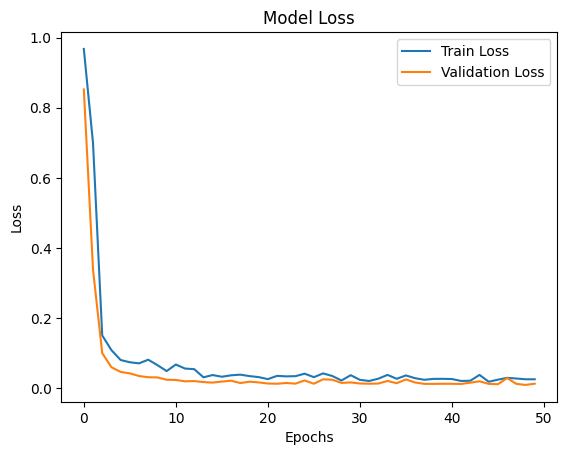

MSE (Train): 0.026254495605826378
MSE (Validation): 0.013706427998840809
6/6 [==============================] - 2s 4ms/step


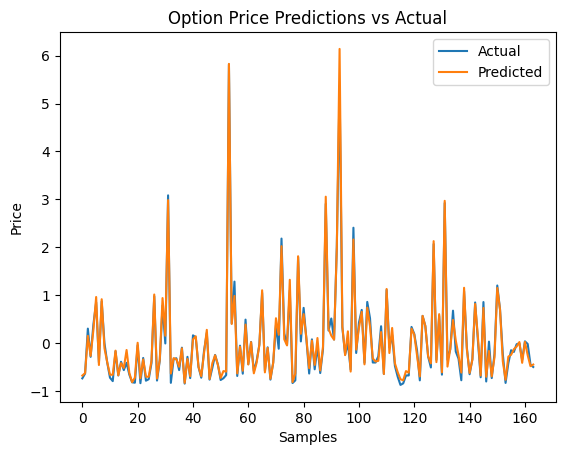

Epoch 1/50
21/21 - 10s - loss: 0.9773 - val_loss: 0.8943 - 10s/epoch - 471ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7761 - val_loss: 0.4739 - 359ms/epoch - 17ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2376 - val_loss: 0.1014 - 416ms/epoch - 20ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1420 - val_loss: 0.0721 - 371ms/epoch - 18ms/step
Epoch 5/50
21/21 - 1s - loss: 0.1069 - val_loss: 0.0685 - 628ms/epoch - 30ms/step
Epoch 6/50
21/21 - 1s - loss: 0.0953 - val_loss: 0.0516 - 774ms/epoch - 37ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0840 - val_loss: 0.0516 - 369ms/epoch - 18ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0739 - val_loss: 0.0435 - 194ms/epoch - 9ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0794 - val_loss: 0.0371 - 188ms/epoch - 9ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0518 - val_loss: 0.0321 - 190ms/epoch - 9ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0653 - val_loss: 0.0278 - 186ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0674 - val_loss: 0.0239 - 187ms/epoch - 9ms/step
Epoch 13/50
21/21 

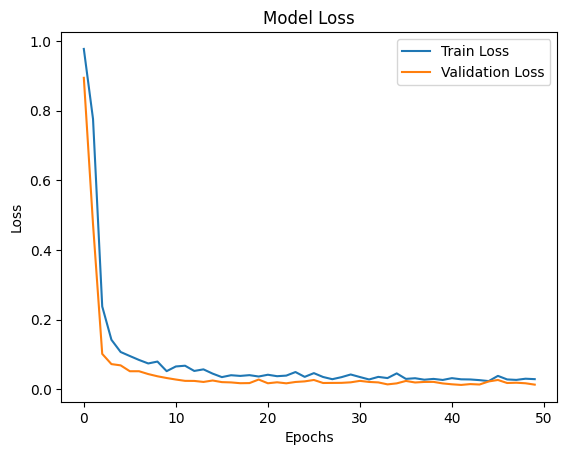

MSE (Train): 0.028865519911050797
MSE (Validation): 0.01309105847030878
6/6 [==============================] - 1s 6ms/step


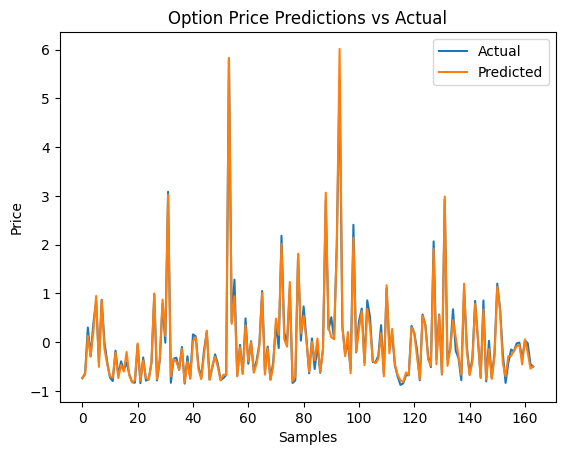

Epoch 1/50
21/21 - 9s - loss: 0.9709 - val_loss: 0.8689 - 9s/epoch - 422ms/step
Epoch 2/50
21/21 - 0s - loss: 0.6928 - val_loss: 0.3594 - 184ms/epoch - 9ms/step
Epoch 3/50
21/21 - 0s - loss: 0.1974 - val_loss: 0.0982 - 181ms/epoch - 9ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1118 - val_loss: 0.0595 - 218ms/epoch - 10ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0811 - val_loss: 0.0477 - 183ms/epoch - 9ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0918 - val_loss: 0.0465 - 191ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0944 - val_loss: 0.0375 - 202ms/epoch - 10ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0678 - val_loss: 0.0371 - 237ms/epoch - 11ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0579 - val_loss: 0.0306 - 291ms/epoch - 14ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0684 - val_loss: 0.0279 - 247ms/epoch - 12ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0629 - val_loss: 0.0260 - 220ms/epoch - 10ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0476 - val_loss: 0.0231 - 180ms/epoch - 9ms/step
Epoch 13/50
21/21 - 

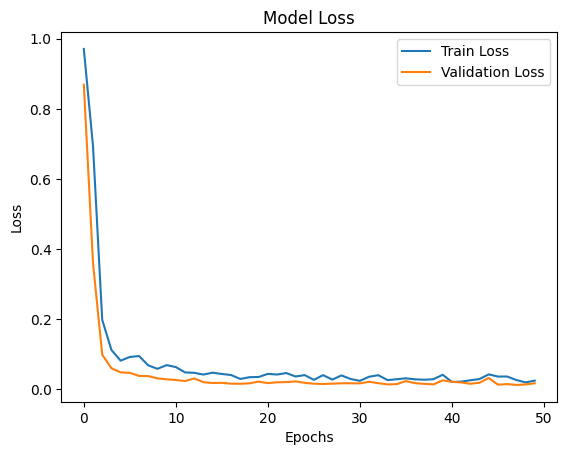

MSE (Train): 0.02416200563311577
MSE (Validation): 0.016595914959907532
6/6 [==============================] - 1s 5ms/step


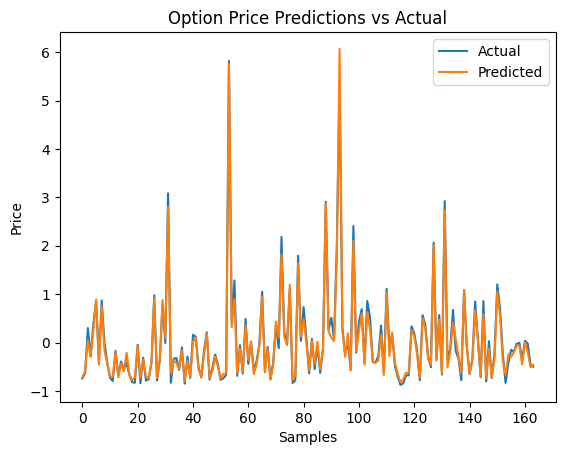

Epoch 1/50
21/21 - 8s - loss: 0.9537 - val_loss: 0.8483 - 8s/epoch - 381ms/step
Epoch 2/50
21/21 - 0s - loss: 0.6542 - val_loss: 0.3362 - 212ms/epoch - 10ms/step
Epoch 3/50
21/21 - 0s - loss: 0.1851 - val_loss: 0.0897 - 177ms/epoch - 8ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1020 - val_loss: 0.0627 - 190ms/epoch - 9ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0783 - val_loss: 0.0490 - 190ms/epoch - 9ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0878 - val_loss: 0.0457 - 201ms/epoch - 10ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0798 - val_loss: 0.0387 - 200ms/epoch - 10ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0756 - val_loss: 0.0310 - 268ms/epoch - 13ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0677 - val_loss: 0.0273 - 225ms/epoch - 11ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0586 - val_loss: 0.0271 - 233ms/epoch - 11ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0671 - val_loss: 0.0251 - 280ms/epoch - 13ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0453 - val_loss: 0.0216 - 186ms/epoch - 9ms/step
Epoch 13/50
21/21 -

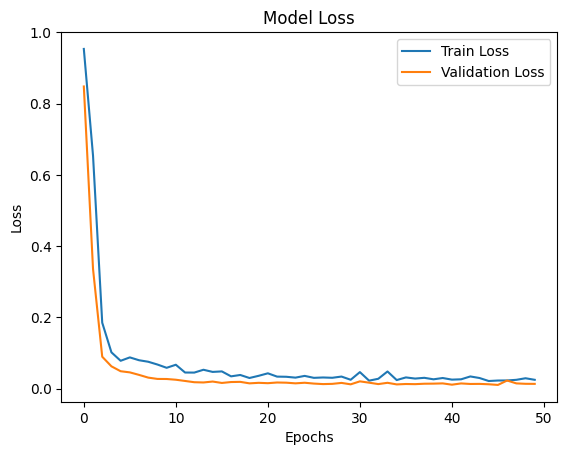

MSE (Train): 0.024863217025995255
MSE (Validation): 0.013466279953718185
6/6 [==============================] - 2s 5ms/step


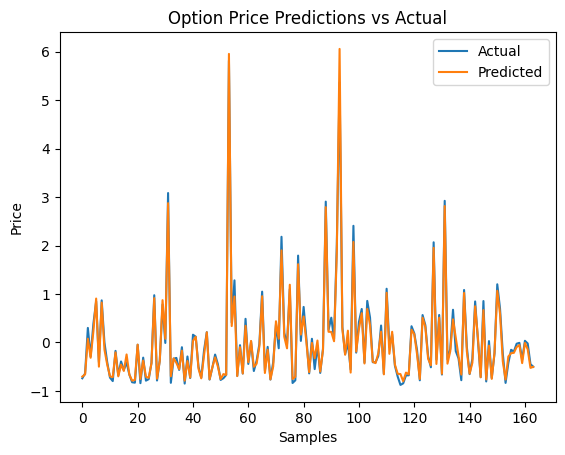

Epoch 1/50
21/21 - 9s - loss: 0.9744 - val_loss: 0.8814 - 9s/epoch - 437ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7449 - val_loss: 0.4191 - 229ms/epoch - 11ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2235 - val_loss: 0.0888 - 175ms/epoch - 8ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1034 - val_loss: 0.0589 - 263ms/epoch - 13ms/step
Epoch 5/50
21/21 - 0s - loss: 0.1020 - val_loss: 0.0529 - 313ms/epoch - 15ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0912 - val_loss: 0.0463 - 252ms/epoch - 12ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0695 - val_loss: 0.0403 - 295ms/epoch - 14ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0868 - val_loss: 0.0540 - 250ms/epoch - 12ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0843 - val_loss: 0.0413 - 296ms/epoch - 14ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0687 - val_loss: 0.0306 - 295ms/epoch - 14ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0619 - val_loss: 0.0294 - 306ms/epoch - 15ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0554 - val_loss: 0.0372 - 313ms/epoch - 15ms/step
Epoch 13/50
21/2

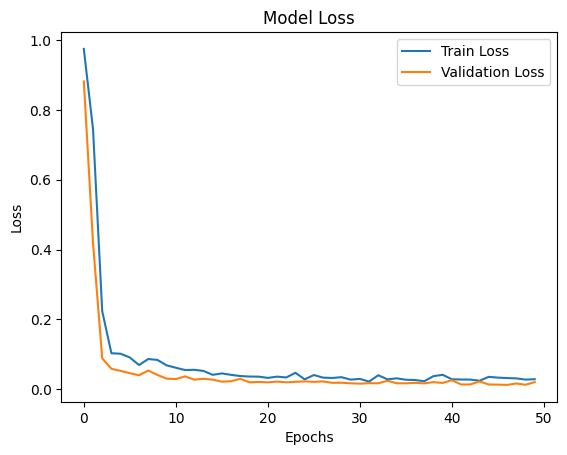

MSE (Train): 0.029060261324048042
MSE (Validation): 0.02075820229947567
6/6 [==============================] - 1s 5ms/step


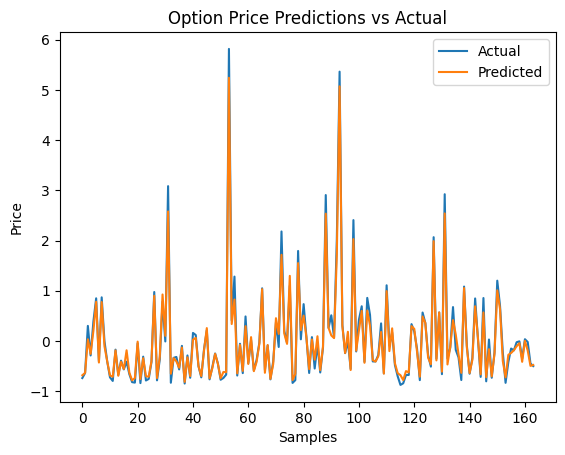

Epoch 1/50
21/21 - 10s - loss: 0.9763 - val_loss: 0.8838 - 10s/epoch - 475ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7605 - val_loss: 0.4395 - 191ms/epoch - 9ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2333 - val_loss: 0.0887 - 171ms/epoch - 8ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1164 - val_loss: 0.0551 - 179ms/epoch - 9ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0843 - val_loss: 0.0475 - 178ms/epoch - 8ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0793 - val_loss: 0.0432 - 191ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0809 - val_loss: 0.0374 - 191ms/epoch - 9ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0822 - val_loss: 0.0455 - 181ms/epoch - 9ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0742 - val_loss: 0.0295 - 176ms/epoch - 8ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0689 - val_loss: 0.0258 - 189ms/epoch - 9ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0458 - val_loss: 0.0252 - 190ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0486 - val_loss: 0.0227 - 183ms/epoch - 9ms/step
Epoch 13/50
21/21 - 0s -

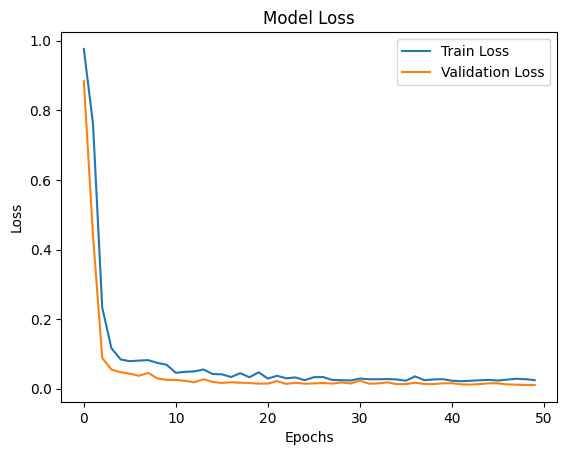

MSE (Train): 0.02482597343623638
MSE (Validation): 0.011070933192968369
6/6 [==============================] - 1s 5ms/step


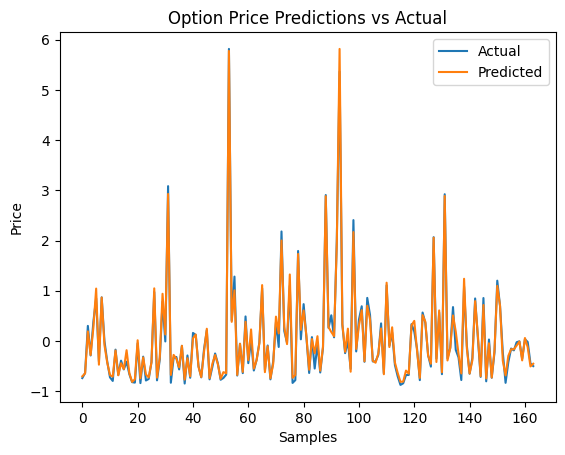

Epoch 1/50
21/21 - 8s - loss: 0.9780 - val_loss: 0.8847 - 8s/epoch - 399ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7515 - val_loss: 0.4605 - 182ms/epoch - 9ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2663 - val_loss: 0.1057 - 183ms/epoch - 9ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1211 - val_loss: 0.0707 - 192ms/epoch - 9ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0982 - val_loss: 0.0578 - 177ms/epoch - 8ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0878 - val_loss: 0.0497 - 272ms/epoch - 13ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0827 - val_loss: 0.0452 - 274ms/epoch - 13ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0730 - val_loss: 0.0373 - 267ms/epoch - 13ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0725 - val_loss: 0.0344 - 229ms/epoch - 11ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0577 - val_loss: 0.0278 - 232ms/epoch - 11ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0483 - val_loss: 0.0252 - 238ms/epoch - 11ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0572 - val_loss: 0.0226 - 240ms/epoch - 11ms/step
Epoch 13/50
21/21 -

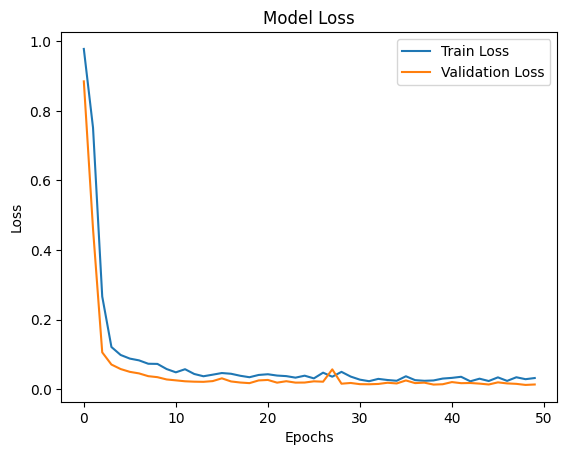

MSE (Train): 0.03191491216421127
MSE (Validation): 0.013355415314435959
6/6 [==============================] - 1s 4ms/step


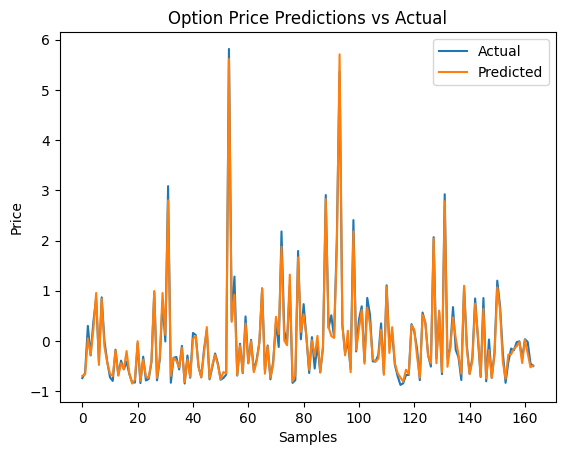

Epoch 1/50
21/21 - 10s - loss: 0.9669 - val_loss: 0.8737 - 10s/epoch - 464ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7537 - val_loss: 0.4391 - 293ms/epoch - 14ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2763 - val_loss: 0.0986 - 271ms/epoch - 13ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1066 - val_loss: 0.0675 - 287ms/epoch - 14ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0931 - val_loss: 0.0515 - 255ms/epoch - 12ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0918 - val_loss: 0.0479 - 208ms/epoch - 10ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0788 - val_loss: 0.0419 - 195ms/epoch - 9ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0695 - val_loss: 0.0432 - 175ms/epoch - 8ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0652 - val_loss: 0.0331 - 190ms/epoch - 9ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0596 - val_loss: 0.0280 - 198ms/epoch - 9ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0525 - val_loss: 0.0335 - 264ms/epoch - 13ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0480 - val_loss: 0.0234 - 286ms/epoch - 14ms/step
Epoch 13/50
21/21

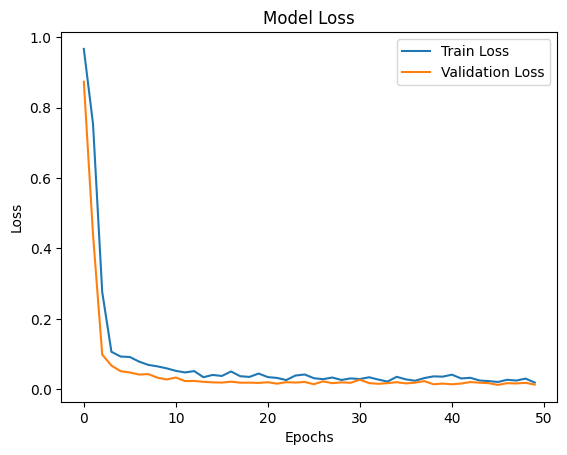

MSE (Train): 0.019328365102410316
MSE (Validation): 0.013447888195514679
6/6 [==============================] - 1s 4ms/step


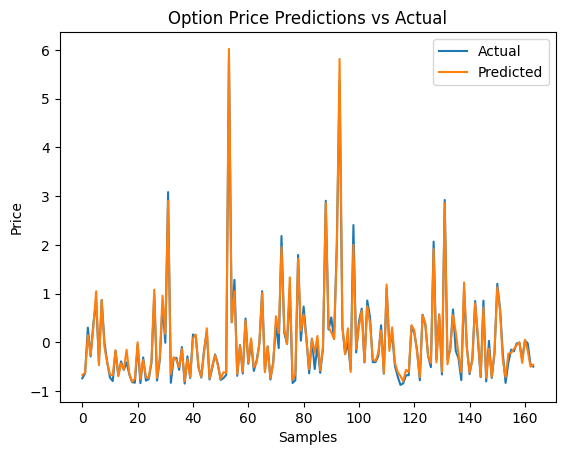

Epoch 1/50
21/21 - 9s - loss: 0.9772 - val_loss: 0.8776 - 9s/epoch - 446ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7667 - val_loss: 0.4776 - 228ms/epoch - 11ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2522 - val_loss: 0.1142 - 278ms/epoch - 13ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1392 - val_loss: 0.0706 - 200ms/epoch - 10ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0957 - val_loss: 0.0556 - 174ms/epoch - 8ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0848 - val_loss: 0.0480 - 191ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0764 - val_loss: 0.0437 - 178ms/epoch - 8ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0643 - val_loss: 0.0374 - 201ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0750 - val_loss: 0.0319 - 179ms/epoch - 9ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0634 - val_loss: 0.0347 - 176ms/epoch - 8ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0526 - val_loss: 0.0262 - 236ms/epoch - 11ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0612 - val_loss: 0.0216 - 190ms/epoch - 9ms/step
Epoch 13/50
21/21 - 0

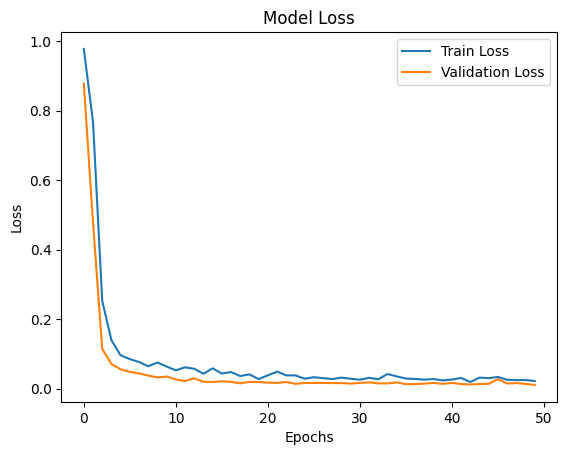

MSE (Train): 0.021727384999394417
MSE (Validation): 0.010539880953729153
6/6 [==============================] - 1s 4ms/step


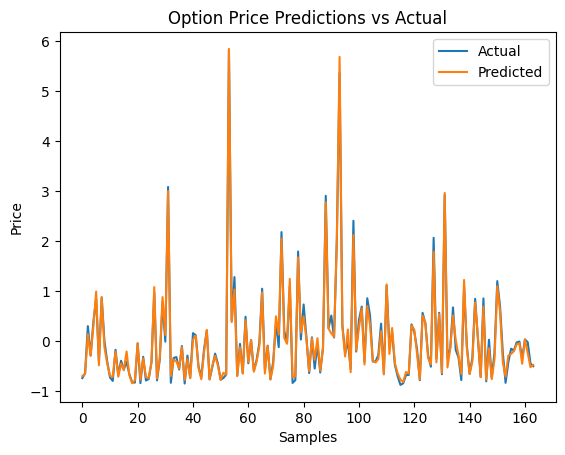

Epoch 1/50
21/21 - 12s - loss: 0.9636 - val_loss: 0.8591 - 12s/epoch - 554ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7169 - val_loss: 0.3775 - 297ms/epoch - 14ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2032 - val_loss: 0.0914 - 244ms/epoch - 12ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1306 - val_loss: 0.0757 - 282ms/epoch - 13ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0862 - val_loss: 0.0543 - 266ms/epoch - 13ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0733 - val_loss: 0.0499 - 235ms/epoch - 11ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0679 - val_loss: 0.0455 - 231ms/epoch - 11ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0676 - val_loss: 0.0356 - 277ms/epoch - 13ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0676 - val_loss: 0.0351 - 252ms/epoch - 12ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0680 - val_loss: 0.0266 - 281ms/epoch - 13ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0635 - val_loss: 0.0228 - 285ms/epoch - 14ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0612 - val_loss: 0.0222 - 243ms/epoch - 12ms/step
Epoch 13/50
2

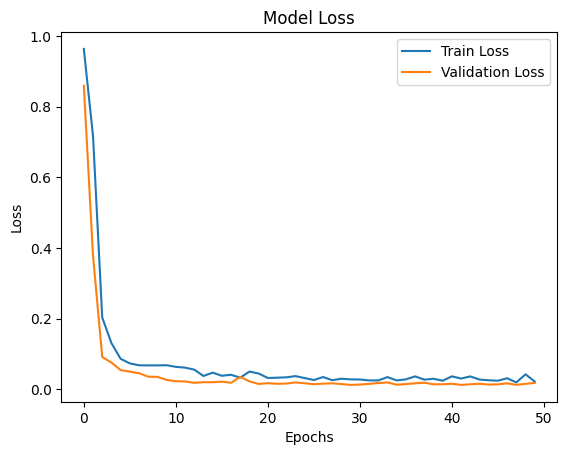

MSE (Train): 0.021895093843340874
MSE (Validation): 0.018041962757706642
6/6 [==============================] - 1s 5ms/step


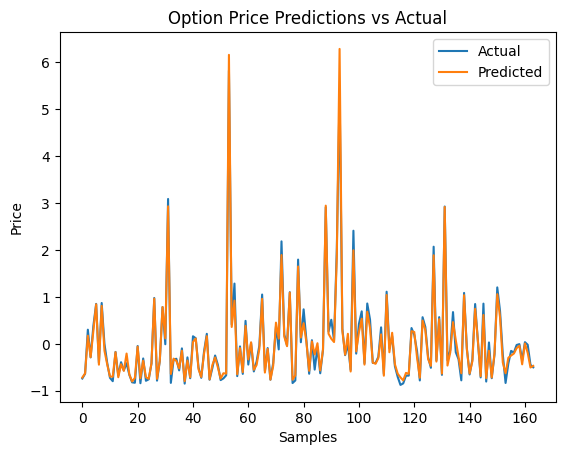

Epoch 1/50
21/21 - 8s - loss: 0.9771 - val_loss: 0.8821 - 8s/epoch - 375ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7672 - val_loss: 0.4503 - 379ms/epoch - 18ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2743 - val_loss: 0.0917 - 321ms/epoch - 15ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1072 - val_loss: 0.0621 - 312ms/epoch - 15ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0885 - val_loss: 0.0514 - 317ms/epoch - 15ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0715 - val_loss: 0.0463 - 313ms/epoch - 15ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0738 - val_loss: 0.0396 - 306ms/epoch - 15ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0651 - val_loss: 0.0353 - 213ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0654 - val_loss: 0.0390 - 188ms/epoch - 9ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0539 - val_loss: 0.0270 - 190ms/epoch - 9ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0563 - val_loss: 0.0232 - 193ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0504 - val_loss: 0.0194 - 208ms/epoch - 10ms/step
Epoch 13/50
21/21 

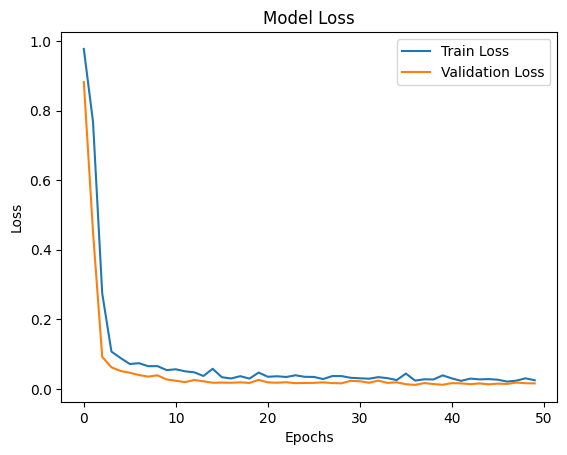

MSE (Train): 0.024759771302342415
MSE (Validation): 0.015729637816548347
6/6 [==============================] - 1s 6ms/step


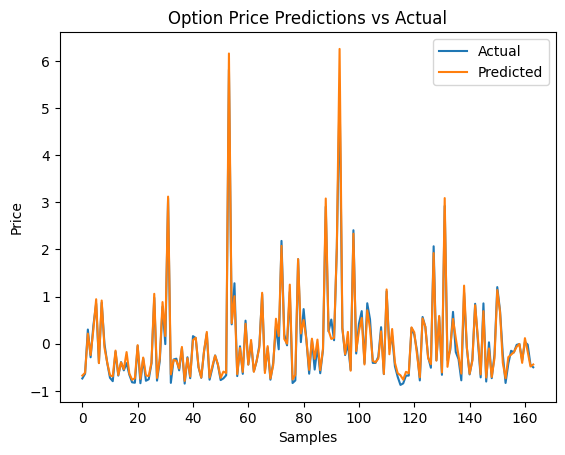

Epoch 1/50
21/21 - 9s - loss: 0.9653 - val_loss: 0.8574 - 9s/epoch - 419ms/step
Epoch 2/50
21/21 - 0s - loss: 0.6900 - val_loss: 0.3589 - 243ms/epoch - 12ms/step
Epoch 3/50
21/21 - 0s - loss: 0.1928 - val_loss: 0.1008 - 273ms/epoch - 13ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1131 - val_loss: 0.0636 - 254ms/epoch - 12ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0983 - val_loss: 0.0528 - 185ms/epoch - 9ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0799 - val_loss: 0.0461 - 185ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0700 - val_loss: 0.0435 - 195ms/epoch - 9ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0743 - val_loss: 0.0375 - 196ms/epoch - 9ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0618 - val_loss: 0.0385 - 205ms/epoch - 10ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0600 - val_loss: 0.0320 - 188ms/epoch - 9ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0616 - val_loss: 0.0276 - 192ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0640 - val_loss: 0.0256 - 190ms/epoch - 9ms/step
Epoch 13/50
21/21 - 0s

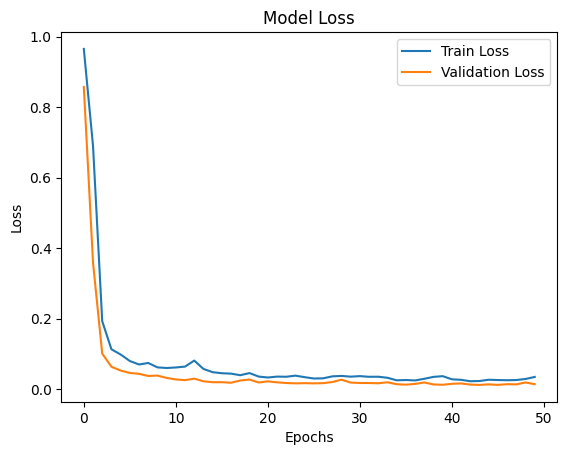

MSE (Train): 0.03467515483498573
MSE (Validation): 0.014122364111244678
6/6 [==============================] - 1s 5ms/step


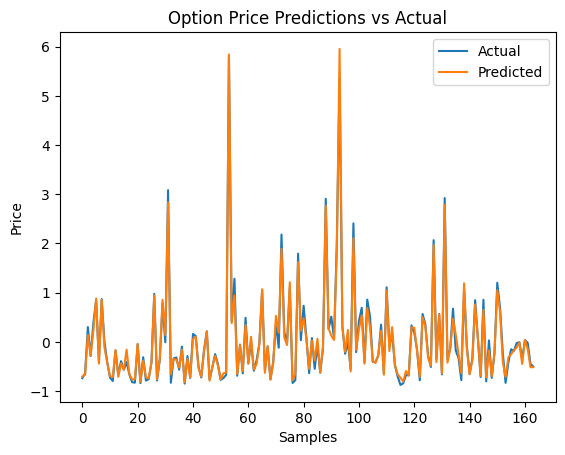

Epoch 1/50
21/21 - 9s - loss: 0.9766 - val_loss: 0.8887 - 9s/epoch - 405ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7751 - val_loss: 0.4626 - 195ms/epoch - 9ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2365 - val_loss: 0.0912 - 189ms/epoch - 9ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1220 - val_loss: 0.0674 - 204ms/epoch - 10ms/step
Epoch 5/50
21/21 - 0s - loss: 0.1040 - val_loss: 0.0538 - 188ms/epoch - 9ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0747 - val_loss: 0.0492 - 190ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0874 - val_loss: 0.0443 - 191ms/epoch - 9ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0786 - val_loss: 0.0361 - 191ms/epoch - 9ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0541 - val_loss: 0.0294 - 243ms/epoch - 12ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0611 - val_loss: 0.0270 - 190ms/epoch - 9ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0517 - val_loss: 0.0265 - 209ms/epoch - 10ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0433 - val_loss: 0.0275 - 195ms/epoch - 9ms/step
Epoch 13/50
21/21 - 0s 

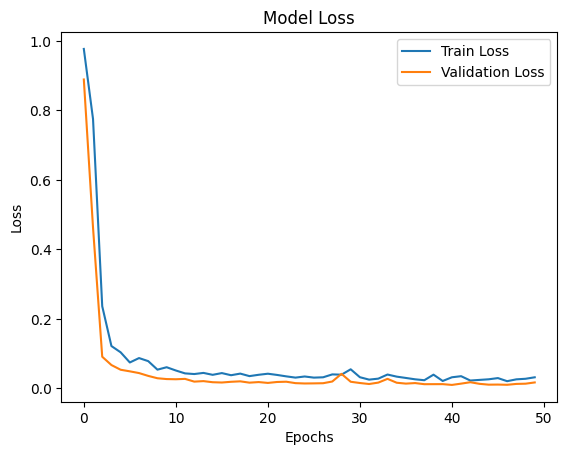

MSE (Train): 0.03212541341781616
MSE (Validation): 0.01730944961309433
6/6 [==============================] - 2s 9ms/step


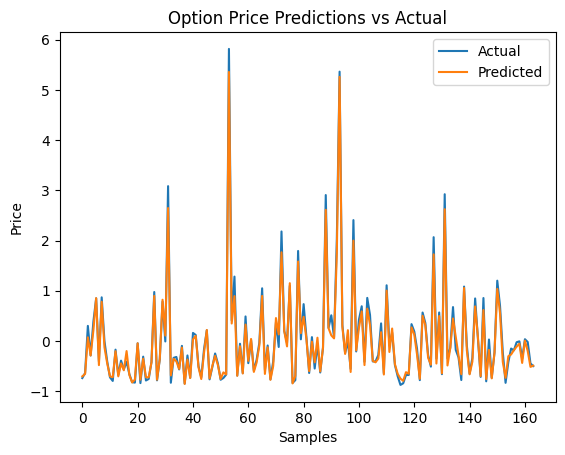

Epoch 1/50
21/21 - 8s - loss: 0.9724 - val_loss: 0.8841 - 8s/epoch - 391ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7935 - val_loss: 0.4654 - 350ms/epoch - 17ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2958 - val_loss: 0.1032 - 309ms/epoch - 15ms/step
Epoch 4/50
21/21 - 1s - loss: 0.1158 - val_loss: 0.0795 - 1s/epoch - 48ms/step
Epoch 5/50
21/21 - 0s - loss: 0.1014 - val_loss: 0.0544 - 260ms/epoch - 12ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0882 - val_loss: 0.0508 - 288ms/epoch - 14ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0915 - val_loss: 0.0435 - 315ms/epoch - 15ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0680 - val_loss: 0.0386 - 284ms/epoch - 14ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0773 - val_loss: 0.0339 - 303ms/epoch - 14ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0703 - val_loss: 0.0305 - 327ms/epoch - 16ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0724 - val_loss: 0.0273 - 334ms/epoch - 16ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0481 - val_loss: 0.0223 - 224ms/epoch - 11ms/step
Epoch 13/50
21/21 

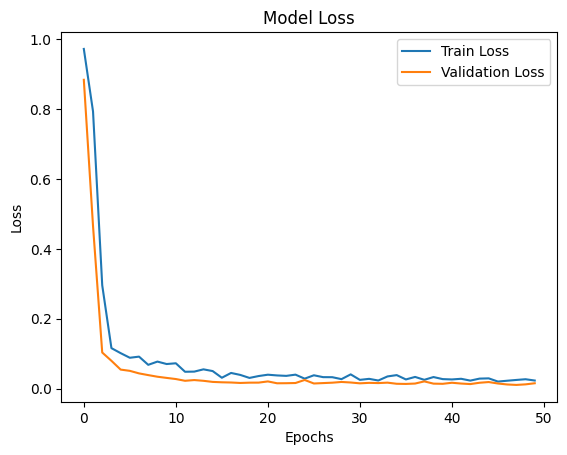

MSE (Train): 0.02304377220571041
MSE (Validation): 0.015234989114105701
6/6 [==============================] - 1s 4ms/step


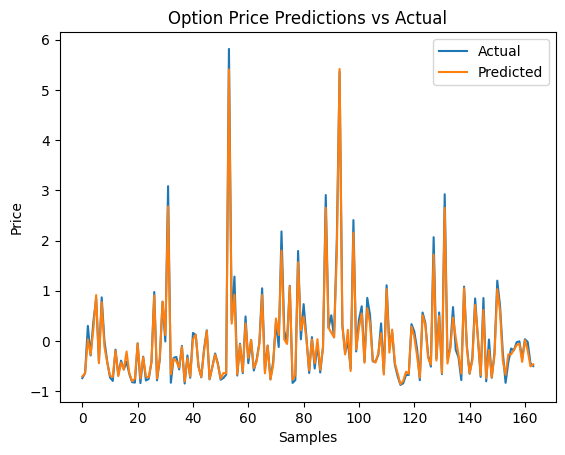

Epoch 1/50
21/21 - 8s - loss: 0.9809 - val_loss: 0.8816 - 8s/epoch - 388ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7228 - val_loss: 0.4211 - 323ms/epoch - 15ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2314 - val_loss: 0.0870 - 312ms/epoch - 15ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1010 - val_loss: 0.0641 - 293ms/epoch - 14ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0997 - val_loss: 0.0527 - 258ms/epoch - 12ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0703 - val_loss: 0.0464 - 265ms/epoch - 13ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0911 - val_loss: 0.0416 - 303ms/epoch - 14ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0670 - val_loss: 0.0379 - 215ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0646 - val_loss: 0.0317 - 198ms/epoch - 9ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0654 - val_loss: 0.0279 - 205ms/epoch - 10ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0643 - val_loss: 0.0268 - 196ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0620 - val_loss: 0.0234 - 208ms/epoch - 10ms/step
Epoch 13/50
21/21

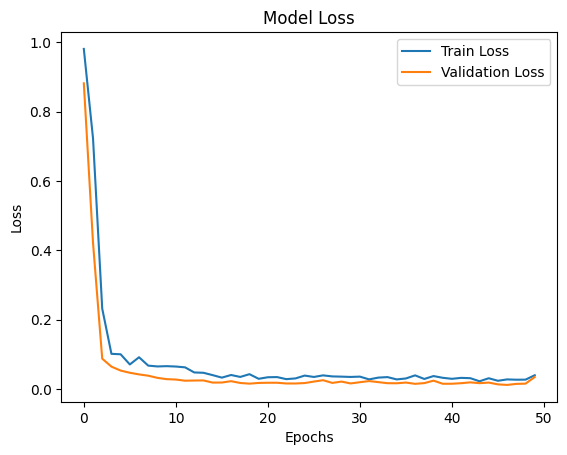

MSE (Train): 0.03922693058848381
MSE (Validation): 0.03403778374195099
6/6 [==============================] - 2s 5ms/step


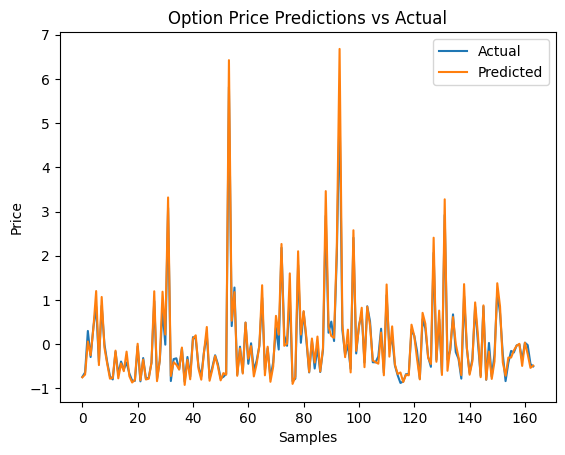

Epoch 1/50
21/21 - 8s - loss: 0.9787 - val_loss: 0.8828 - 8s/epoch - 368ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7414 - val_loss: 0.4494 - 194ms/epoch - 9ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2568 - val_loss: 0.0952 - 183ms/epoch - 9ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1299 - val_loss: 0.0684 - 189ms/epoch - 9ms/step
Epoch 5/50
21/21 - 0s - loss: 0.1063 - val_loss: 0.0527 - 194ms/epoch - 9ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0818 - val_loss: 0.0466 - 197ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0903 - val_loss: 0.0427 - 199ms/epoch - 9ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0760 - val_loss: 0.0401 - 201ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0723 - val_loss: 0.0335 - 206ms/epoch - 10ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0537 - val_loss: 0.0306 - 233ms/epoch - 11ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0672 - val_loss: 0.0259 - 317ms/epoch - 15ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0578 - val_loss: 0.0232 - 314ms/epoch - 15ms/step
Epoch 13/50
21/21 - 0

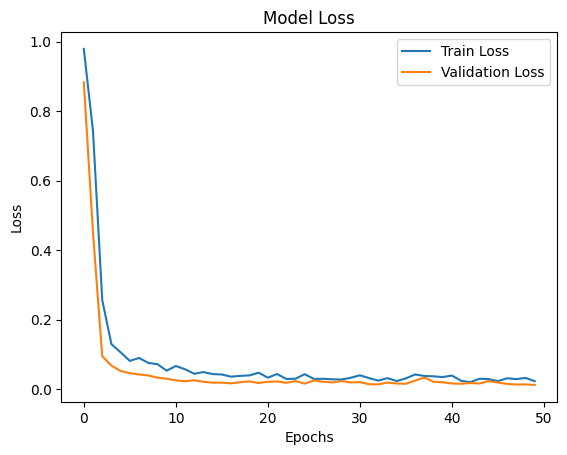

MSE (Train): 0.023405468091368675
MSE (Validation): 0.012732944451272488
6/6 [==============================] - 1s 6ms/step


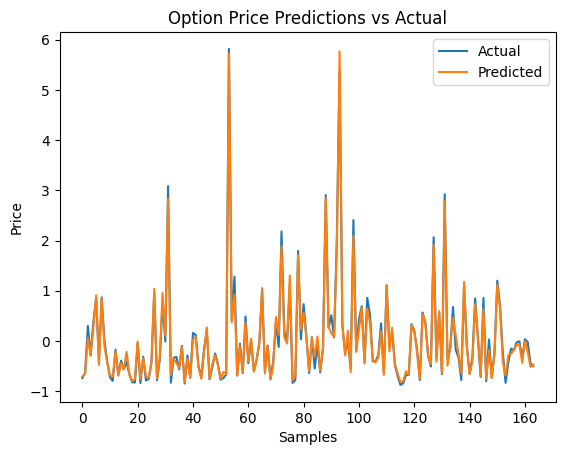

Epoch 1/50
21/21 - 8s - loss: 0.9730 - val_loss: 0.8815 - 8s/epoch - 367ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7464 - val_loss: 0.4557 - 193ms/epoch - 9ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2311 - val_loss: 0.0974 - 185ms/epoch - 9ms/step
Epoch 4/50
21/21 - 0s - loss: 0.0993 - val_loss: 0.0675 - 293ms/epoch - 14ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0850 - val_loss: 0.0524 - 264ms/epoch - 13ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0806 - val_loss: 0.0453 - 256ms/epoch - 12ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0634 - val_loss: 0.0400 - 243ms/epoch - 12ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0823 - val_loss: 0.0372 - 257ms/epoch - 12ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0586 - val_loss: 0.0315 - 240ms/epoch - 11ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0707 - val_loss: 0.0276 - 239ms/epoch - 11ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0541 - val_loss: 0.0263 - 250ms/epoch - 12ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0541 - val_loss: 0.0416 - 278ms/epoch - 13ms/step
Epoch 13/50
21/21

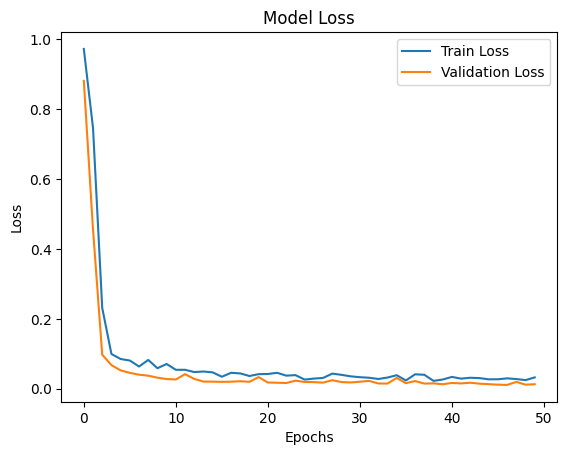

MSE (Train): 0.03224460408091545
MSE (Validation): 0.012677750550210476
6/6 [==============================] - 1s 5ms/step


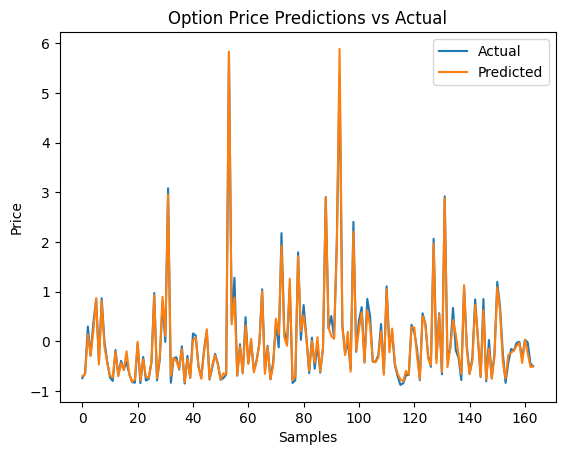

Epoch 1/50
21/21 - 9s - loss: 0.9757 - val_loss: 0.8807 - 9s/epoch - 413ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7343 - val_loss: 0.4145 - 238ms/epoch - 11ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2012 - val_loss: 0.0869 - 246ms/epoch - 12ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1047 - val_loss: 0.0600 - 267ms/epoch - 13ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0858 - val_loss: 0.0529 - 249ms/epoch - 12ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0845 - val_loss: 0.0449 - 242ms/epoch - 12ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0741 - val_loss: 0.0438 - 233ms/epoch - 11ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0683 - val_loss: 0.0342 - 206ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0626 - val_loss: 0.0289 - 187ms/epoch - 9ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0718 - val_loss: 0.0291 - 200ms/epoch - 10ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0568 - val_loss: 0.0243 - 192ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0441 - val_loss: 0.0193 - 205ms/epoch - 10ms/step
Epoch 13/50
21/21

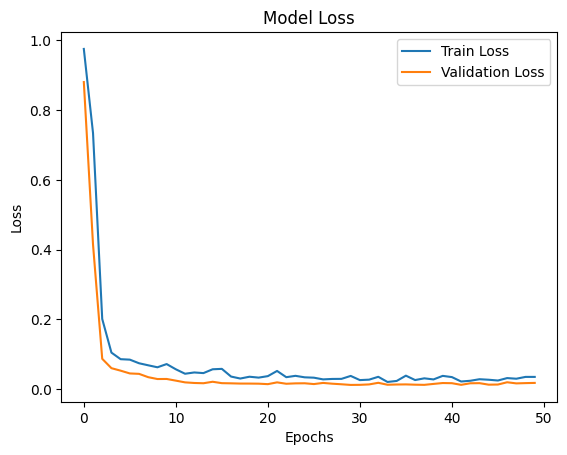

MSE (Train): 0.0350007601082325
MSE (Validation): 0.017787203192710876
6/6 [==============================] - 1s 4ms/step


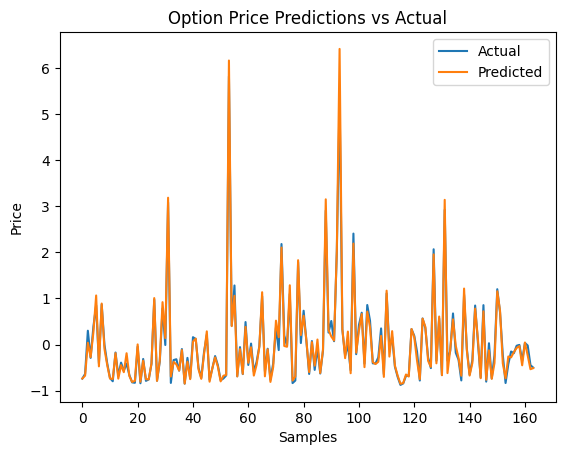

Epoch 1/50
21/21 - 8s - loss: 0.9808 - val_loss: 0.8956 - 8s/epoch - 366ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7774 - val_loss: 0.4581 - 251ms/epoch - 12ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2171 - val_loss: 0.0908 - 255ms/epoch - 12ms/step
Epoch 4/50
21/21 - 0s - loss: 0.0985 - val_loss: 0.0603 - 270ms/epoch - 13ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0794 - val_loss: 0.0531 - 249ms/epoch - 12ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0859 - val_loss: 0.0430 - 307ms/epoch - 15ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0700 - val_loss: 0.0380 - 253ms/epoch - 12ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0695 - val_loss: 0.0401 - 402ms/epoch - 19ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0700 - val_loss: 0.0317 - 379ms/epoch - 18ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0629 - val_loss: 0.0286 - 309ms/epoch - 15ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0519 - val_loss: 0.0245 - 326ms/epoch - 16ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0478 - val_loss: 0.0291 - 360ms/epoch - 17ms/step
Epoch 13/50
21/

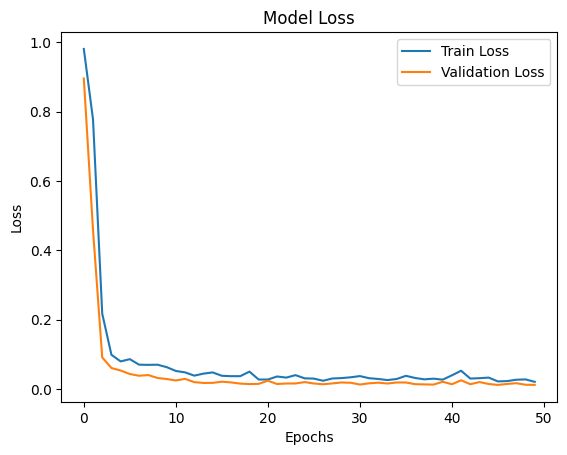

MSE (Train): 0.02056357078254223
MSE (Validation): 0.011726835742592812
6/6 [==============================] - 1s 5ms/step


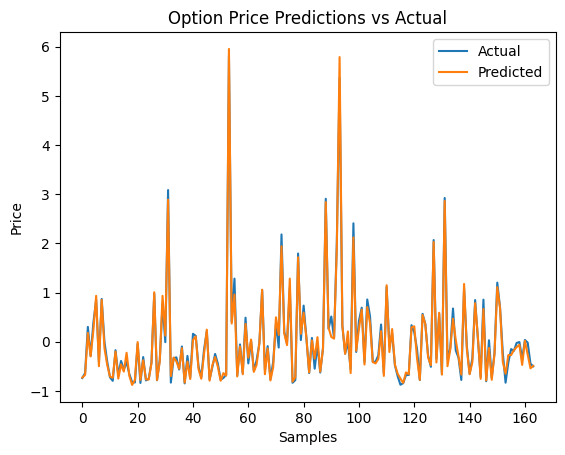

Epoch 1/50
21/21 - 9s - loss: 0.9590 - val_loss: 0.8475 - 9s/epoch - 427ms/step
Epoch 2/50
21/21 - 0s - loss: 0.6712 - val_loss: 0.3189 - 201ms/epoch - 10ms/step
Epoch 3/50
21/21 - 0s - loss: 0.1421 - val_loss: 0.0985 - 209ms/epoch - 10ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1171 - val_loss: 0.0628 - 216ms/epoch - 10ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0947 - val_loss: 0.0526 - 208ms/epoch - 10ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0752 - val_loss: 0.0467 - 195ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.1023 - val_loss: 0.0415 - 218ms/epoch - 10ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0745 - val_loss: 0.0419 - 204ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0686 - val_loss: 0.0338 - 240ms/epoch - 11ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0673 - val_loss: 0.0352 - 193ms/epoch - 9ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0733 - val_loss: 0.0339 - 197ms/epoch - 9ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0485 - val_loss: 0.0274 - 216ms/epoch - 10ms/step
Epoch 13/50
21/21 

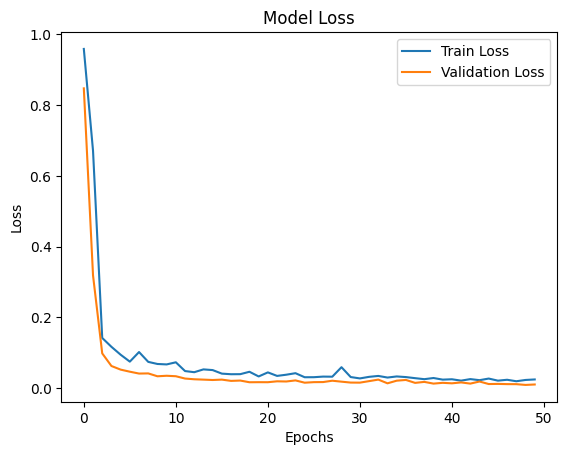

MSE (Train): 0.02481694705784321
MSE (Validation): 0.010585252195596695
6/6 [==============================] - 2s 5ms/step


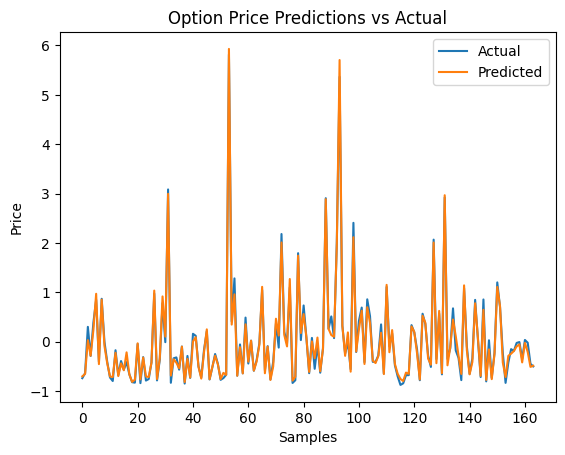

Epoch 1/50
21/21 - 8s - loss: 0.9704 - val_loss: 0.8608 - 8s/epoch - 359ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7079 - val_loss: 0.3662 - 297ms/epoch - 14ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2427 - val_loss: 0.0943 - 233ms/epoch - 11ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1103 - val_loss: 0.0722 - 198ms/epoch - 9ms/step
Epoch 5/50
21/21 - 0s - loss: 0.1058 - val_loss: 0.0550 - 205ms/epoch - 10ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0797 - val_loss: 0.0448 - 206ms/epoch - 10ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0806 - val_loss: 0.0434 - 199ms/epoch - 9ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0673 - val_loss: 0.0356 - 210ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0679 - val_loss: 0.0310 - 206ms/epoch - 10ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0631 - val_loss: 0.0306 - 203ms/epoch - 10ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0640 - val_loss: 0.0254 - 209ms/epoch - 10ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0461 - val_loss: 0.0219 - 239ms/epoch - 11ms/step
Epoch 13/50
21/21

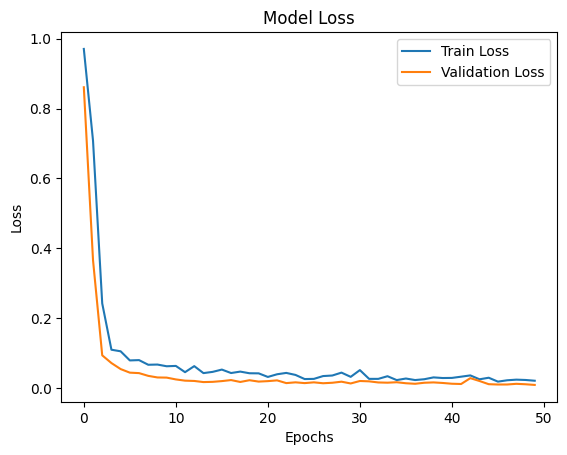

MSE (Train): 0.021652786061167717
MSE (Validation): 0.009676259942352772
6/6 [==============================] - 1s 5ms/step


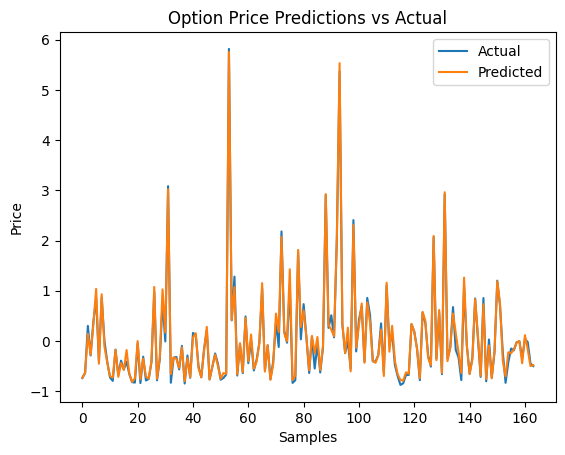

Epoch 1/50
21/21 - 8s - loss: 0.9653 - val_loss: 0.8579 - 8s/epoch - 396ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7233 - val_loss: 0.3785 - 355ms/epoch - 17ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2052 - val_loss: 0.0853 - 364ms/epoch - 17ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1088 - val_loss: 0.0626 - 328ms/epoch - 16ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0993 - val_loss: 0.0556 - 270ms/epoch - 13ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0926 - val_loss: 0.0459 - 277ms/epoch - 13ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0891 - val_loss: 0.0415 - 281ms/epoch - 13ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0619 - val_loss: 0.0446 - 299ms/epoch - 14ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0681 - val_loss: 0.0317 - 255ms/epoch - 12ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0551 - val_loss: 0.0268 - 333ms/epoch - 16ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0441 - val_loss: 0.0264 - 309ms/epoch - 15ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0423 - val_loss: 0.0249 - 349ms/epoch - 17ms/step
Epoch 13/50
21/

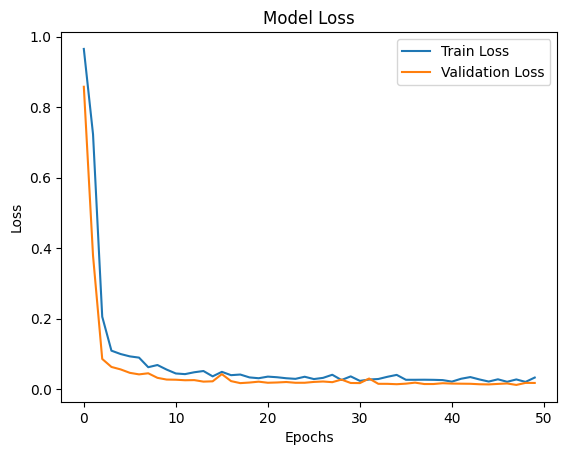

MSE (Train): 0.032501623034477234
MSE (Validation): 0.017198145389556885
6/6 [==============================] - 1s 7ms/step


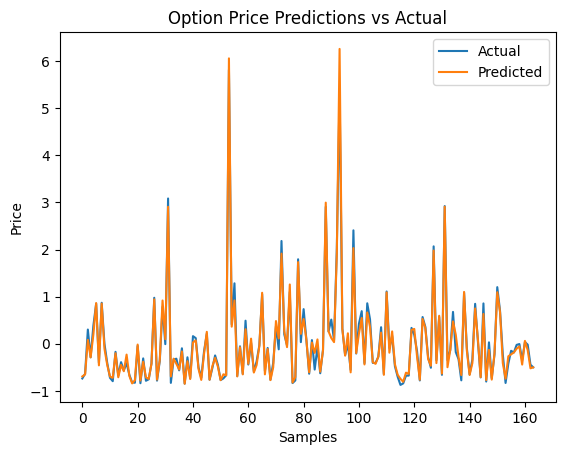

Epoch 1/50
21/21 - 9s - loss: 0.9767 - val_loss: 0.8944 - 9s/epoch - 418ms/step
Epoch 2/50
21/21 - 0s - loss: 0.8200 - val_loss: 0.5023 - 285ms/epoch - 14ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2685 - val_loss: 0.1160 - 261ms/epoch - 12ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1214 - val_loss: 0.0706 - 257ms/epoch - 12ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0940 - val_loss: 0.0545 - 270ms/epoch - 13ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0915 - val_loss: 0.0503 - 247ms/epoch - 12ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0906 - val_loss: 0.0483 - 235ms/epoch - 11ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0695 - val_loss: 0.0411 - 210ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0852 - val_loss: 0.0364 - 218ms/epoch - 10ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0673 - val_loss: 0.0385 - 213ms/epoch - 10ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0565 - val_loss: 0.0283 - 211ms/epoch - 10ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0560 - val_loss: 0.0315 - 243ms/epoch - 12ms/step
Epoch 13/50
21/

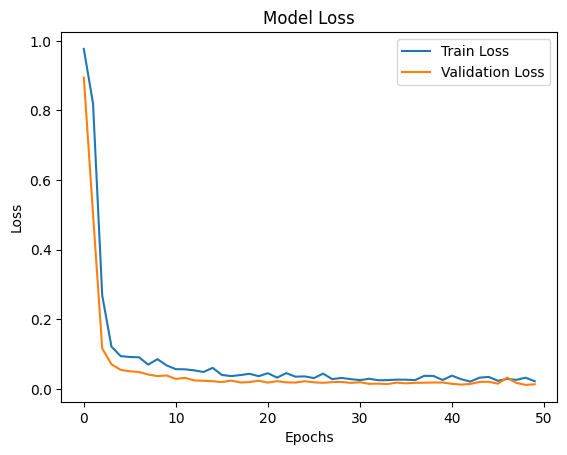

MSE (Train): 0.021819807589054108
MSE (Validation): 0.012978675775229931
6/6 [==============================] - 1s 7ms/step


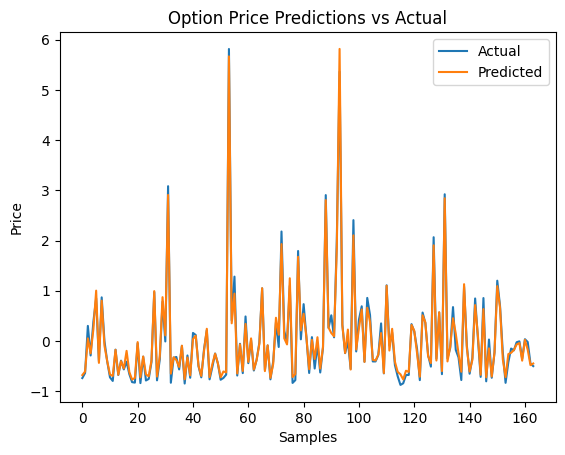

Epoch 1/50
21/21 - 9s - loss: 0.9791 - val_loss: 0.8923 - 9s/epoch - 448ms/step
Epoch 2/50
21/21 - 0s - loss: 0.7898 - val_loss: 0.4558 - 267ms/epoch - 13ms/step
Epoch 3/50
21/21 - 0s - loss: 0.2750 - val_loss: 0.0881 - 305ms/epoch - 15ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1271 - val_loss: 0.0673 - 285ms/epoch - 14ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0862 - val_loss: 0.0520 - 264ms/epoch - 13ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0899 - val_loss: 0.0491 - 203ms/epoch - 10ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0809 - val_loss: 0.0379 - 203ms/epoch - 10ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0750 - val_loss: 0.0342 - 201ms/epoch - 10ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0677 - val_loss: 0.0300 - 221ms/epoch - 11ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0687 - val_loss: 0.0317 - 265ms/epoch - 13ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0584 - val_loss: 0.0320 - 309ms/epoch - 15ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0486 - val_loss: 0.0235 - 300ms/epoch - 14ms/step
Epoch 13/50
21/

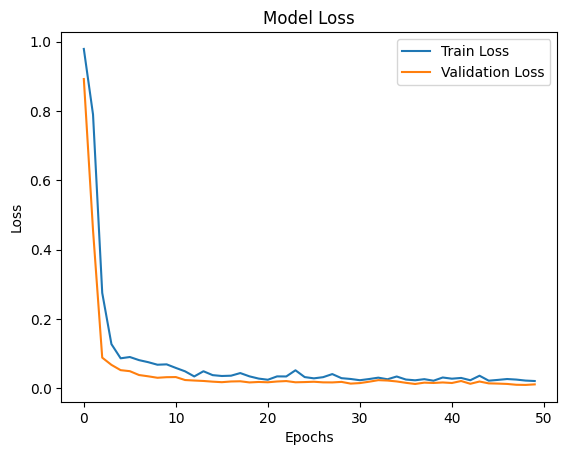

MSE (Train): 0.020649492740631104
MSE (Validation): 0.010943768545985222
6/6 [==============================] - 2s 6ms/step


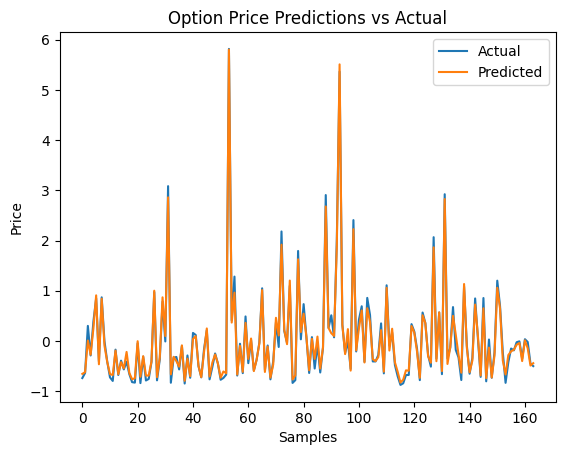

Epoch 1/50
21/21 - 14s - loss: 0.9615 - val_loss: 0.8535 - 14s/epoch - 667ms/step
Epoch 2/50
21/21 - 0s - loss: 0.6978 - val_loss: 0.3301 - 256ms/epoch - 12ms/step
Epoch 3/50
21/21 - 0s - loss: 0.1883 - val_loss: 0.1163 - 265ms/epoch - 13ms/step
Epoch 4/50
21/21 - 0s - loss: 0.1227 - val_loss: 0.0658 - 228ms/epoch - 11ms/step
Epoch 5/50
21/21 - 0s - loss: 0.0997 - val_loss: 0.0606 - 218ms/epoch - 10ms/step
Epoch 6/50
21/21 - 0s - loss: 0.0821 - val_loss: 0.0500 - 198ms/epoch - 9ms/step
Epoch 7/50
21/21 - 0s - loss: 0.0707 - val_loss: 0.0424 - 203ms/epoch - 10ms/step
Epoch 8/50
21/21 - 0s - loss: 0.0596 - val_loss: 0.0374 - 222ms/epoch - 11ms/step
Epoch 9/50
21/21 - 0s - loss: 0.0659 - val_loss: 0.0361 - 264ms/epoch - 13ms/step
Epoch 10/50
21/21 - 0s - loss: 0.0740 - val_loss: 0.0295 - 267ms/epoch - 13ms/step
Epoch 11/50
21/21 - 0s - loss: 0.0526 - val_loss: 0.0273 - 255ms/epoch - 12ms/step
Epoch 12/50
21/21 - 0s - loss: 0.0586 - val_loss: 0.0251 - 313ms/epoch - 15ms/step
Epoch 13/50
21

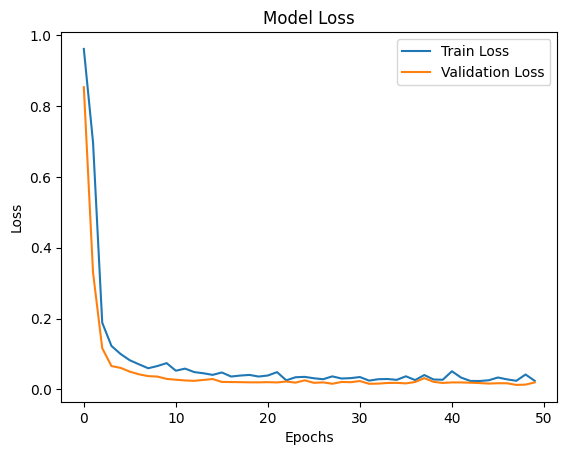

MSE (Train): 0.024025751277804375
MSE (Validation): 0.019586507230997086
6/6 [==============================] - 2s 7ms/step


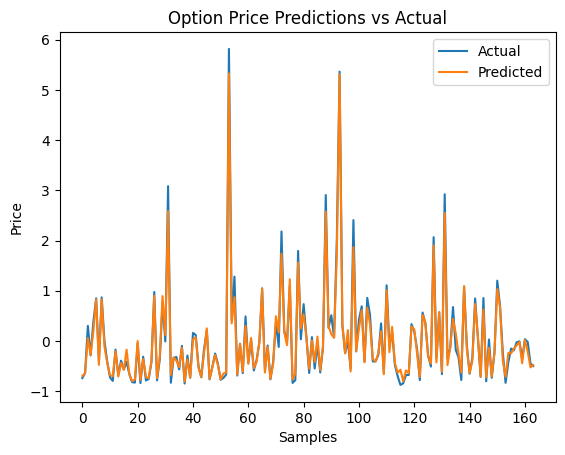

6/6 [==============================] - 0s 5ms/step


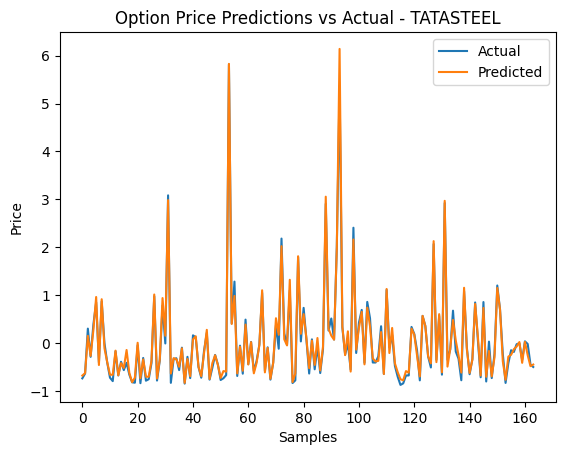

6/6 [==============================] - 0s 4ms/step


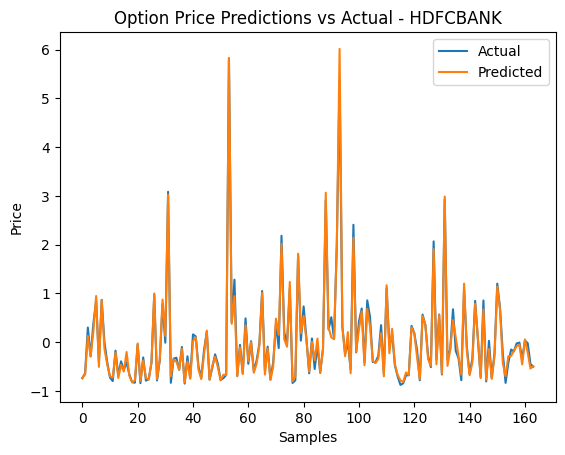

6/6 [==============================] - 0s 7ms/step


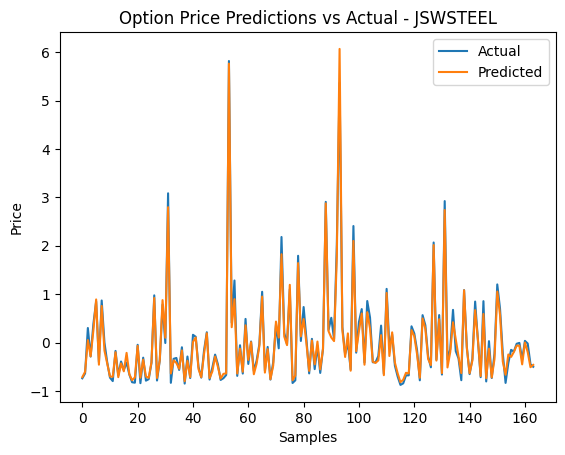

6/6 [==============================] - 0s 6ms/step


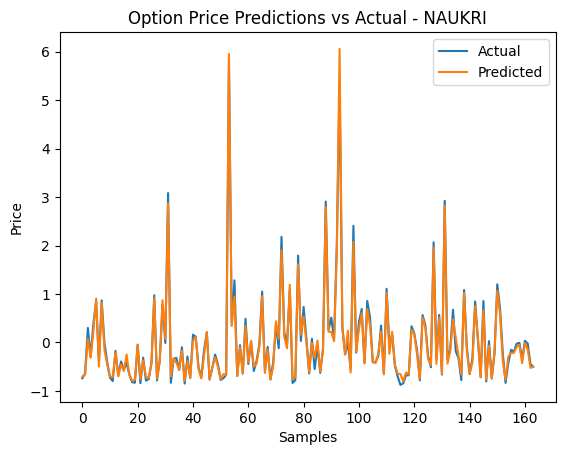

6/6 [==============================] - 0s 5ms/step


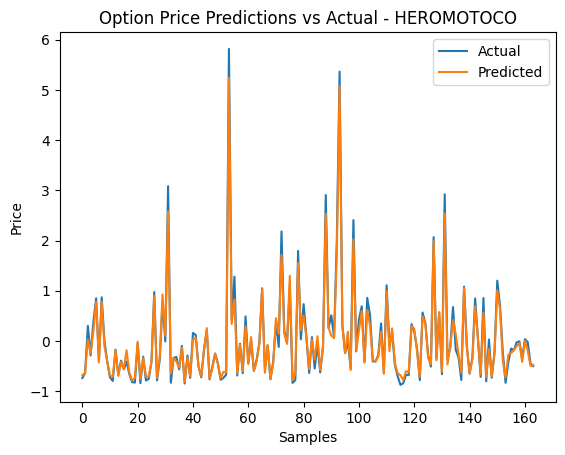

6/6 [==============================] - 0s 7ms/step


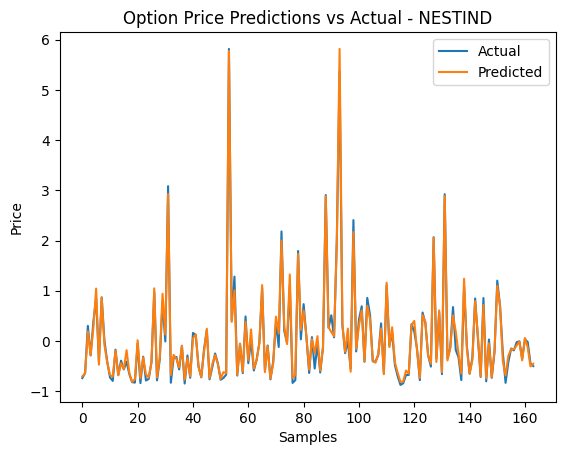

6/6 [==============================] - 0s 7ms/step


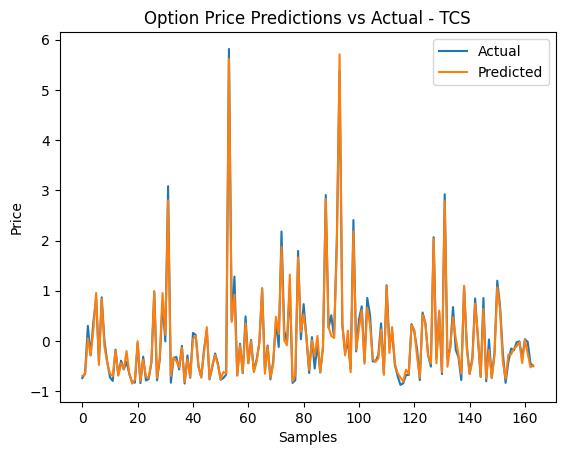

6/6 [==============================] - 0s 5ms/step


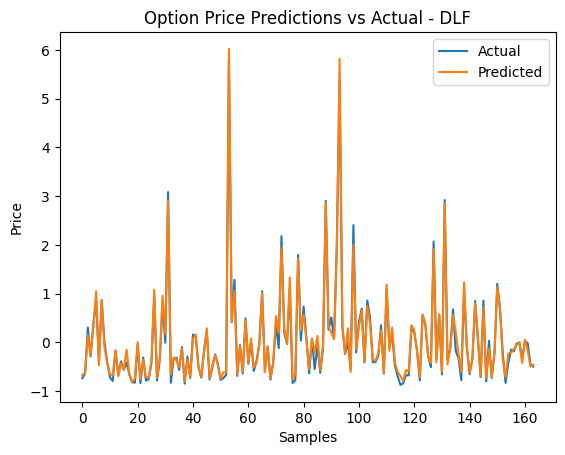

6/6 [==============================] - 0s 7ms/step


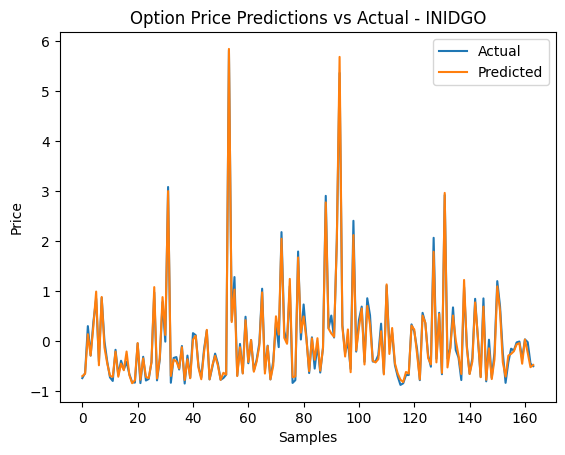

6/6 [==============================] - 0s 8ms/step


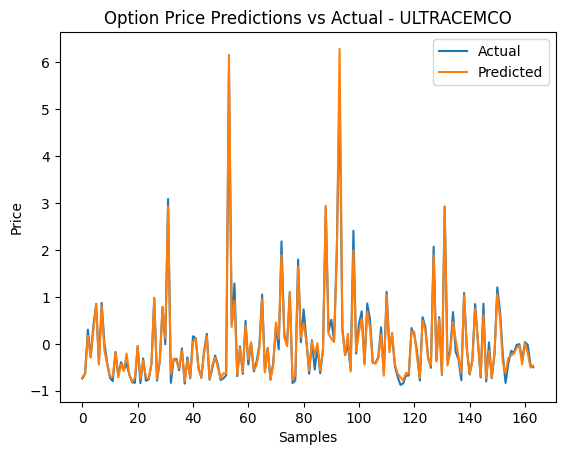

6/6 [==============================] - 0s 11ms/step


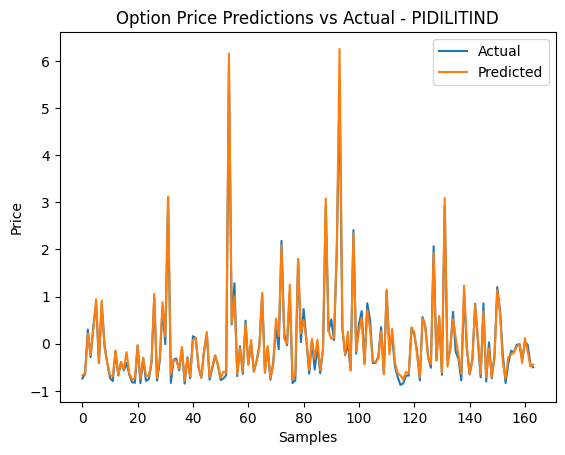

6/6 [==============================] - 0s 14ms/step


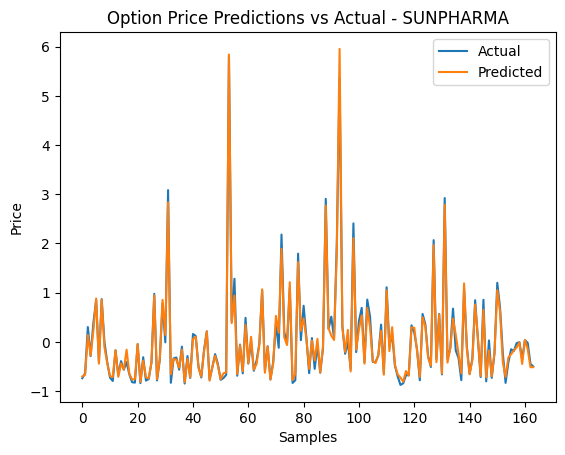

6/6 [==============================] - 0s 11ms/step


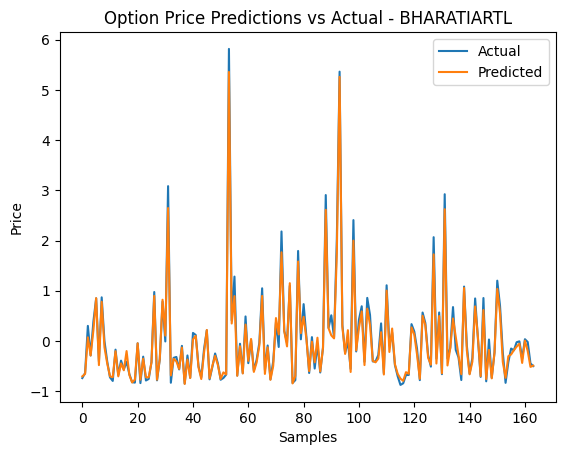

6/6 [==============================] - 0s 9ms/step


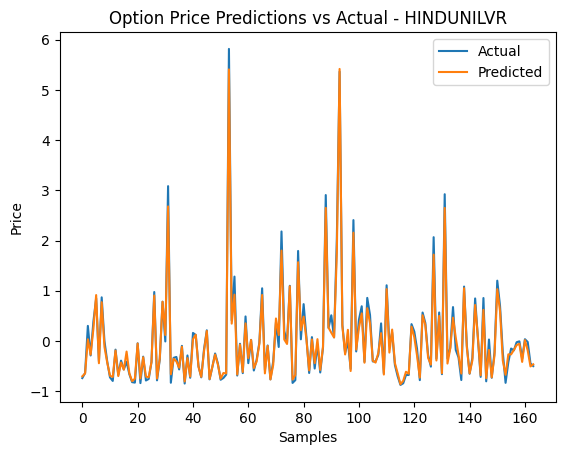

6/6 [==============================] - 0s 10ms/step


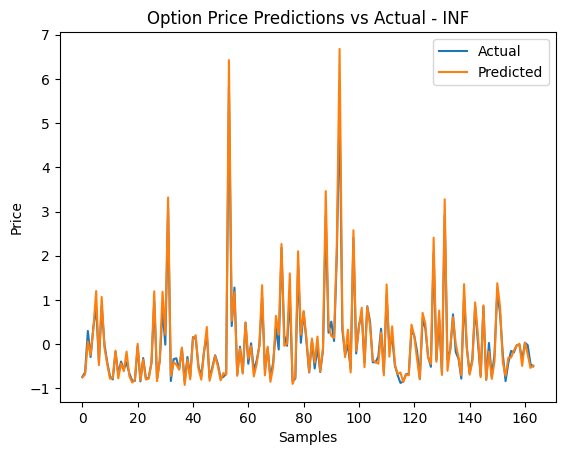

6/6 [==============================] - 0s 7ms/step


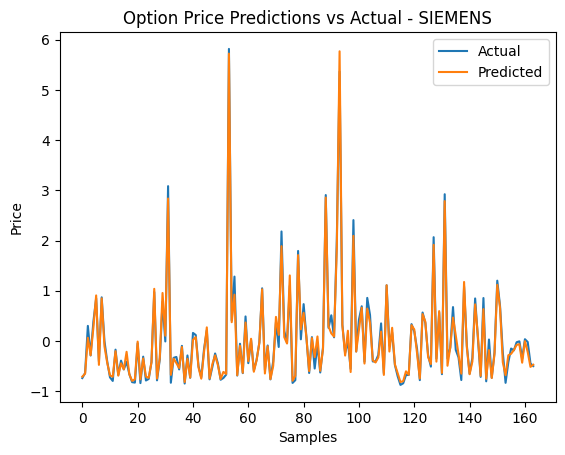

6/6 [==============================] - 0s 6ms/step


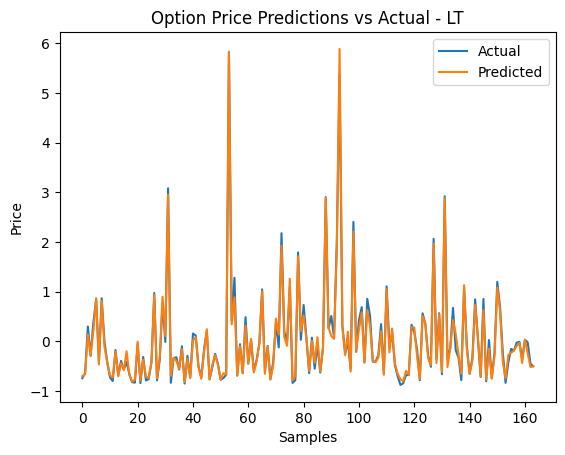

6/6 [==============================] - 0s 6ms/step


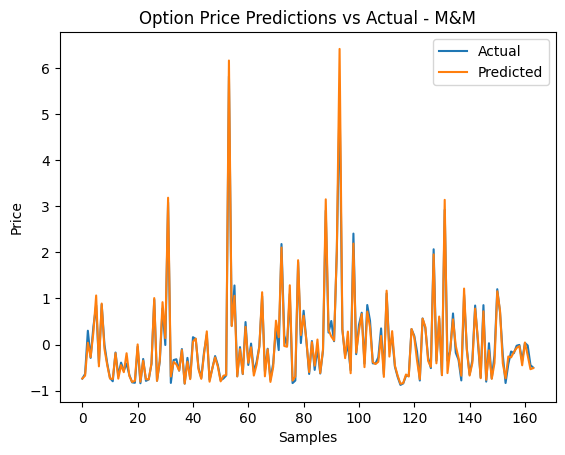

6/6 [==============================] - 0s 6ms/step


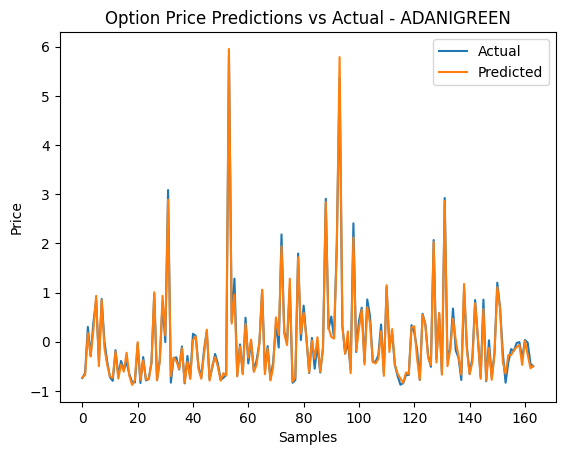

6/6 [==============================] - 0s 8ms/step


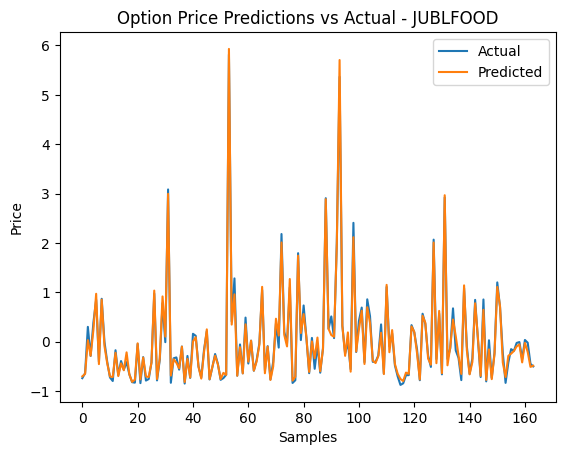

6/6 [==============================] - 0s 7ms/step


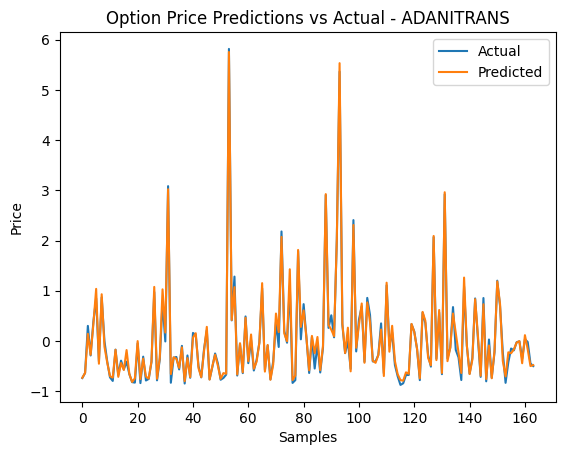

6/6 [==============================] - 0s 7ms/step


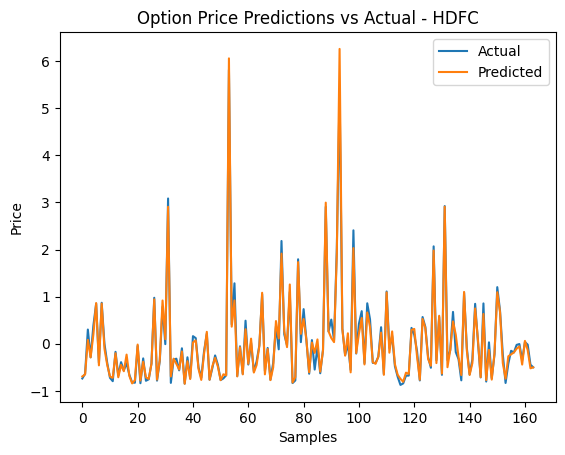

6/6 [==============================] - 0s 6ms/step


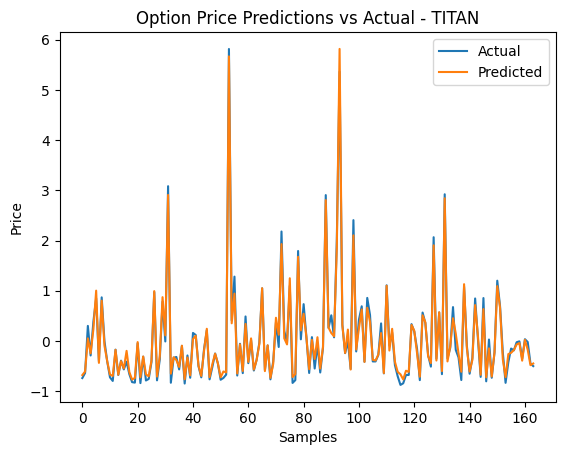

6/6 [==============================] - 0s 6ms/step


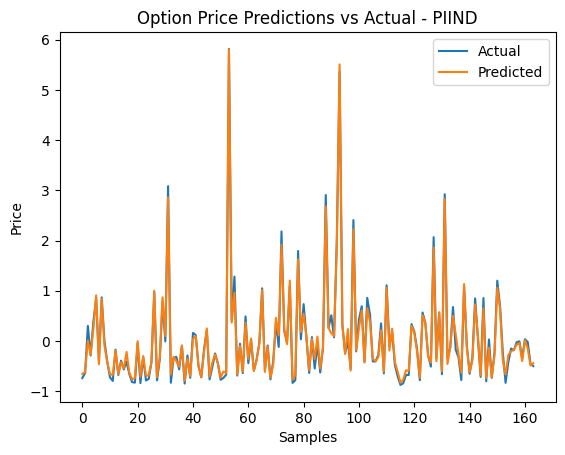

6/6 [==============================] - 0s 5ms/step


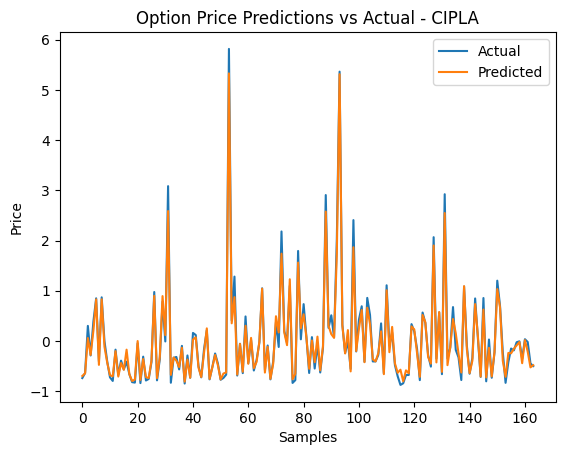

In [82]:
import os
from tensorflow.keras.models import save_model

# Directory where CSV files are stored
options_dir = "options/"

# Directory to save trained models
models_dir = "models/"

# List to store option names
option_names = []

# Dictionary to store trained models
models = {}

# Loop through all files in the options folder
for file in os.listdir(options_dir):
    if file.endswith(".csv"):
        # Extract option name from file name
        option_name = os.path.splitext(file)[0].replace("_option", "")
        option_names.append(option_name)
        # Load the dataset
        df = pd.read_csv("options/NAUKRI_option.csv")

        # Preprocessing
        # Drop unnecessary columns
        df = df.drop(columns=['Unnamed'])

        # Convert 'EXPIRY_DT' and 'TIMESTAMP' to datetime objects
        df['EXPIRY_DT'] = pd.to_datetime(df['EXPIRY_DT'])
        df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])

        # Extract features from datetime columns
        df['expiry_year'] = df['EXPIRY_DT'].dt.year
        df['expiry_month'] = df['EXPIRY_DT'].dt.month
        df['expiry_day'] = df['EXPIRY_DT'].dt.day
        df['timestamp_year'] = df['TIMESTAMP'].dt.year
        df['timestamp_month'] = df['TIMESTAMP'].dt.month
        df['timestamp_day'] = df['TIMESTAMP'].dt.day

        # Drop original datetime columns
        df = df.drop(columns=['EXPIRY_DT', 'TIMESTAMP'])

        # Encode categorical variables
        df = pd.get_dummies(df, columns=['INSTRUMENT', 'SYMBOL', 'OPTION_TYP'])

        # Normalize numerical features
        numerical_cols = ['STRIKE_PR', 'OPEN', 'HIGH', 'LOW', 'CLOSE', 'SETTLE_PR', 'CONTRACTS', 'VAL_INLAKH', 'OPEN_INT', 'CHG_IN_OI',
                          'expiry_year', 'expiry_month', 'expiry_day', 'timestamp_year', 'timestamp_month', 'timestamp_day']
        df[numerical_cols] = (df[numerical_cols] - df[numerical_cols].mean()) / df[numerical_cols].std()

        # Split the data into train and test sets
        X = df.drop(columns=['CLOSE'])  # Features
        y = df['CLOSE']  # Target variable
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Reshape the input data for LSTM
        X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

        # Build the LSTM model
        model = Sequential([
            LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
            Dropout(0.2),
            LSTM(100, return_sequences=True),
            Dropout(0.2),
            LSTM(50),
            Dropout(0.2),
            Dense(1)
        ])

        # Compile the model
        model.compile(optimizer='adam', loss='mean_squared_error')

        # Train the model
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=2)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Model Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.savefig(f"model_graphs/loss- {option_name}")
        plt.show()

        # Print the MSE of the last epoch
        train_mse = history.history['loss'][-1]
        val_mse = history.history['val_loss'][-1]
        print(f"MSE (Train): {train_mse}")
        print(f"MSE (Validation): {val_mse}")

        # Make predictions
        y_pred = model.predict(X_test)

        # Visualize predictions vs. actual values
        plt.plot(y_test.values, label='Actual')
        plt.plot(y_pred, label='Predicted')
        plt.title('Option Price Predictions vs Actual')
        plt.xlabel('Samples')
        plt.ylabel('Price')
        plt.legend()
        plt.savefig(f"model_graphs/accuracy - {option_name}")
        plt.show()

        # Save the trained model
        model.save(os.path.join(models_dir, f"{option_name}_model"))

        # Store the trained model
        models[option_name] = model

# Plot prediction results for each option
for option_name, model in models.items():
    # Make predictions
    y_pred = model.predict(X_test)

    # Visualize predictions vs. actual values
    plt.plot(y_test.values, label='Actual')
    plt.plot(y_pred, label='Predicted')
    plt.title(f'Option Price Predictions vs Actual - {option_name}')
    plt.xlabel('Samples')
    plt.ylabel('Price')
    plt.legend()
    plt.show()


In [84]:
! zip -r ./models models

  adding: models/ (stored 0%)
  adding: models/SIEMENS_model/ (stored 0%)
  adding: models/SIEMENS_model/keras_metadata.pb (deflated 92%)
  adding: models/SIEMENS_model/variables/ (stored 0%)
  adding: models/SIEMENS_model/variables/variables.data-00000-of-00001 (deflated 50%)
  adding: models/SIEMENS_model/variables/variables.index (deflated 63%)
  adding: models/SIEMENS_model/fingerprint.pb (stored 0%)
  adding: models/SIEMENS_model/saved_model.pb (deflated 90%)
  adding: models/SIEMENS_model/assets/ (stored 0%)
  adding: models/TATASTEEL_model/ (stored 0%)
  adding: models/TATASTEEL_model/keras_metadata.pb (deflated 92%)
  adding: models/TATASTEEL_model/variables/ (stored 0%)
  adding: models/TATASTEEL_model/variables/variables.data-00000-of-00001 (deflated 49%)
  adding: models/TATASTEEL_model/variables/variables.index (deflated 63%)
  adding: models/TATASTEEL_model/fingerprint.pb (stored 0%)
  adding: models/TATASTEEL_model/saved_model.pb (deflated 90%)
  adding: models/TATASTEEL_